*This code is for Streaming Bayesian ARIMA algorithm for anomaly detection*

# Importing and Installing Packages and Required Libraries

In [1]:
!nvidia-smi
!pip install pmdarima
!pip install pandas statsmodels scikit-learn
!pip install --upgrade statsmodels
!pip install pmdarima statsmodels
!pip install tensorflow
!pip install tensorflow_io
!pip install kafka-python

/bin/bash: line 1: nvidia-smi: command not found


In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
from scipy.stats import zscore
import scipy.stats as stats
import json
from datetime import datetime
import requests
from io import StringIO

import warnings
import psutil
import time

import os
import threading
from kafka import KafkaProducer
from kafka.errors import KafkaError

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow_io as tfio
from sklearn import metrics


import statistics
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
import numpy as np
import pmdarima as pm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import pickle
import math
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score



# Kafka Producer and Consumer Configuration for Converting Static to Streaming Data

In [3]:
# Install Kafka (adjust version as needed)
!curl -sSOL https://downloads.apache.org/kafka/3.7.1/kafka_2.13-3.7.1.tgz

# Extract Kafka
!tar -xzf kafka_2.13-3.7.1.tgz

# Start Zookeeper and Kafka server
!./kafka_2.13-3.7.1/bin/zookeeper-server-start.sh -daemon ./kafka_2.13-3.7.1/config/zookeeper.properties
!./kafka_2.13-3.7.1/bin/kafka-server-start.sh -daemon ./kafka_2.13-3.7.1/config/server.properties
!echo "Waiting for 10 secs until kafka and zookeeper services are up and running"
!sleep 10

!./kafka_2.13-3.7.1/bin/kafka-topics.sh --create --bootstrap-server 127.0.0.1:9092 --replication-factor 1 --partitions 1 --topic dataanomaly-train
!./kafka_2.13-3.7.1/bin/kafka-topics.sh --create --bootstrap-server 127.0.0.1:9092 --replication-factor 1 --partitions 2 --topic dataanomaly-test

!./kafka_2.13-3.7.1/bin/kafka-topics.sh --describe --bootstrap-server 127.0.0.1:9092 --topic dataanomaly-train
!./kafka_2.13-3.7.1/bin/kafka-topics.sh --describe --bootstrap-server 127.0.0.1:9092 --topic dataanomaly-test


Waiting for 10 secs until kafka and zookeeper services are up and running
Error while executing topic command : Topic 'dataanomaly-train' already exists.
[2024-11-25 21:09:37,338] ERROR org.apache.kafka.common.errors.TopicExistsException: Topic 'dataanomaly-train' already exists.
 (org.apache.kafka.tools.TopicCommand)
Error while executing topic command : Topic 'dataanomaly-test' already exists.
[2024-11-25 21:09:42,700] ERROR org.apache.kafka.common.errors.TopicExistsException: Topic 'dataanomaly-test' already exists.
 (org.apache.kafka.tools.TopicCommand)
Topic: dataanomaly-train	TopicId: P5Rbx_k3Q-C83vsRWWaF6w	PartitionCount: 1	ReplicationFactor: 1	Configs: 
	Topic: dataanomaly-train	Partition: 0	Leader: 0	Replicas: 0	Isr: 0
Topic: dataanomaly-test	TopicId: UrLa2WdXSemUSu_5dEw2_Q	PartitionCount: 2	ReplicationFactor: 1	Configs: 
	Topic: dataanomaly-test	Partition: 0	Leader: 0	Replicas: 0	Isr: 0
	Topic: dataanomaly-test	Partition: 1	Leader: 0	Replicas: 0	Isr: 0


# Select Filename that you wish to stream and for training model

In [4]:
user_input_filename = input("Please enter the file path you wish to train on: ") #example realKnownCause/nyc_taxi.csv
print(f"You entered: {user_input_filename}")

Please enter something: realKnownCause/nyc_taxi.csv
You entered: realKnownCause/nyc_taxi.csv


# Loading Static Data, Data analysis and Preprocessing

In [5]:
static_data = "https://raw.githubusercontent.com/numenta/NAB/master/data/"+user_input_filename+""
static_data_df = pd.read_csv(static_data)

labels_url = "https://raw.githubusercontent.com/numenta/NAB/master/labels/combined_labels.json"
response = requests.get(labels_url)
anomaly_labels = json.loads(response.text)

In [6]:
anomaly_labels_df = pd.DataFrame(anomaly_labels[user_input_filename], columns=['timestamp'])
anomaly_labels_df['anomaly_label'] = True

static_data_labeled_df = pd.merge(static_data_df, anomaly_labels_df, on='timestamp', how='left')
static_data_labeled_df['anomaly_label'] = static_data_labeled_df['anomaly_label'].fillna(False)

# Assuming static_data_labeled_df is your labeled DataFrame
static_data_labeled_df['timestamp'] = pd.to_datetime(static_data_labeled_df['timestamp'])

<ipython-input-6-042738c0ed06>:5: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  static_data_labeled_df['anomaly_label'] = static_data_labeled_df['anomaly_label'].fillna(False)


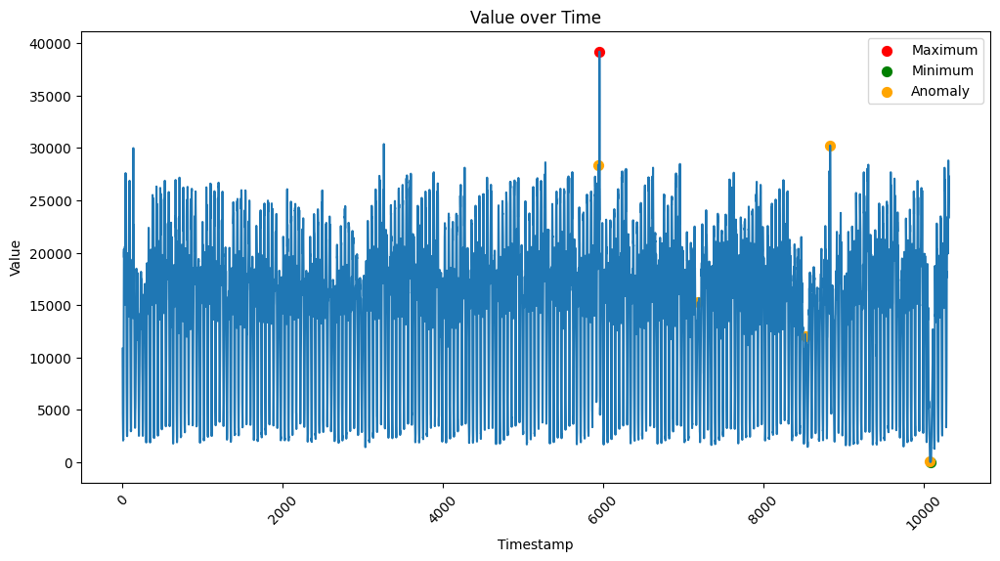

In [7]:

# Plot the values over time
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(static_data_labeled_df.index, static_data_labeled_df['value'])

# Add a scatter plot to highlight the maximum and minimum values
max_idx = static_data_labeled_df['value'].idxmax()
min_idx = static_data_labeled_df['value'].idxmin()
ax.scatter(static_data_labeled_df.index[max_idx], static_data_labeled_df.loc[max_idx, 'value'], color='red', label='Maximum', s=50)
ax.scatter(static_data_labeled_df.index[min_idx], static_data_labeled_df.loc[min_idx, 'value'], color='green', label='Minimum', s=50)

# Highlight the anomalies based on the label column
anomalies = static_data_labeled_df[static_data_labeled_df['anomaly_label'] == 1]
ax.scatter(anomalies.index, anomalies['value'], color='orange', label='Anomaly', s=50)

# Set the plot title and axis labels
ax.set_title('Value over Time')
ax.set_xlabel('Timestamp')
ax.set_ylabel('Value')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Add a legend
ax.legend()

# Display the plot
plt.show()

In [8]:
static_data_labeled_df = static_data_labeled_df.dropna()
#converting datetime to milliseconds for floating value
static_data_labeled_df['timestamp'] = static_data_labeled_df['timestamp'].astype(np.int64) // 10**9
static_data_labeled_df = static_data_labeled_df.sort_values("timestamp")
static_data_labeled_df = static_data_labeled_df.reset_index(drop=True)
static_data_labeled_df['anomaly_label'] = static_data_labeled_df['anomaly_label'].replace(False,0)
static_data_labeled_df['anomaly_label'] = static_data_labeled_df['anomaly_label'].replace(True,1)

<ipython-input-8-e3cf0aaed2ad>:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  static_data_labeled_df['anomaly_label'] = static_data_labeled_df['anomaly_label'].replace(True,1)


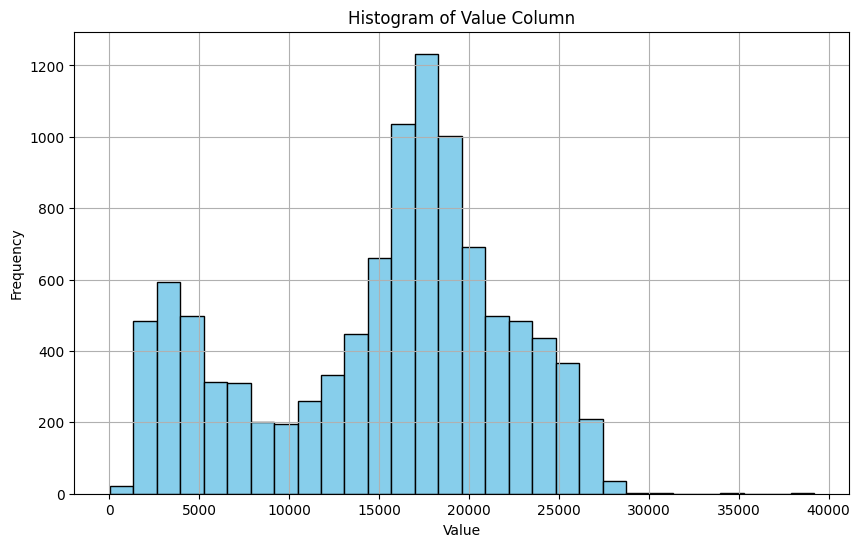

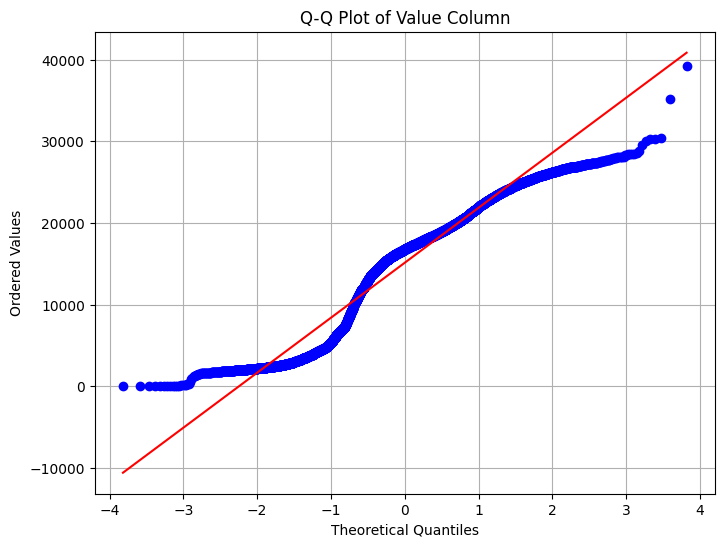

Shapiro-Wilk Test:
Test Statistic: 0.9407801105021597
p-value: 3.3421261386768146e-53

Anderson-Darling Test:
Test Statistic: 222.89802464022978
Critical Values: [0.576 0.656 0.787 0.918 1.092]
Significance Levels: [15.  10.   5.   2.5  1. ]


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 10320.
  res = hypotest_fun_out(*samples, **kwds)


In [9]:
# Plot histogram of the 'value' column
plt.figure(figsize=(10, 6))
plt.hist(static_data_labeled_df['value'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Value Column')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Generate Q-Q plot
plt.figure(figsize=(8, 6))
stats.probplot(static_data_labeled_df['value'], dist="norm", plot=plt)
plt.title('Q-Q Plot of Value Column')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Ordered Values')
plt.grid(True)
plt.show()

# Perform Shapiro-Wilk test for normality
shapiro_test_stat, shapiro_p_value = stats.shapiro(static_data_labeled_df['value'])
print("Shapiro-Wilk Test:")
print("Test Statistic:", shapiro_test_stat)
print("p-value:", shapiro_p_value)

# Perform Anderson-Darling test for normality
anderson_test_statistic, anderson_critical_values, anderson_significance_levels = stats.anderson(static_data_labeled_df['value'])
print("\nAnderson-Darling Test:")
print("Test Statistic:", anderson_test_statistic)
print("Critical Values:", anderson_critical_values)
print("Significance Levels:", anderson_significance_levels)

# Creating the test and train data sets

In [10]:
train_df, test_df = train_test_split(static_data_labeled_df, test_size=0.2, shuffle= False)

print("Number of training samples: ",len(train_df))
print("Number of testing sample: ",len(test_df))

x_train_df = train_df.drop(["anomaly_label"], axis=1)
y_train_df = train_df["anomaly_label"]

x_test_df = test_df.drop(["anomaly_label"], axis=1)
y_test_df = test_df["anomaly_label"]

Number of training samples:  8256
Number of testing sample:  2064


In [11]:
# Assuming x_test_df and y_test_df are already defined
random_rows_indices = np.random.choice(x_test_df.index, size=2, replace=False)
anomalous_values = 945876
x_test_df.loc[random_rows_indices , 'value'] = anomalous_values

# Add corresponding labels to y_test_df
for idx in random_rows_indices:
    y_test_df.at[idx] = 1

# Verify the changes
print("Modified x_test_df:")
print(x_test_df.loc[random_rows_indices])

print("\nModified y_test_df:")
print(y_test_df.loc[random_rows_indices])

Modified x_test_df:
       timestamp   value
9799  1421811000  945876
9333  1420972200  945876

Modified y_test_df:
9799    1
9333    1
Name: anomaly_label, dtype: int64


# Writing training set to Kafka to convert to stream

In [12]:
x_train = list(filter(None, x_train_df.to_csv(index=False).split("\n")[1:]))
y_train = list(filter(None, y_train_df.to_csv(index=False).split("\n")[1:]))
x_test = list(filter(None, x_test_df.to_csv(index=False).split("\n")[1:]))
y_test = list(filter(None, y_test_df.to_csv(index=False).split("\n")[1:]))

In [13]:
def error_callback(exc):
      raise Exception('Error while sending data to kafka: {0}'.format(str(exc)))


def write_to_kafka(topic_name, items):
      count=0
      producer = KafkaProducer(bootstrap_servers=['127.0.0.1:9092'])

      for message, key in items:
        # print(message.encode('utf-8'))
        # print(key.encode('utf-8'))

        datetime_str, value_str = message.split(',')
        value = int(value_str)

        #print(datetime_str,value)
        message = f"{datetime_str},{value}"

        producer.send(topic_name,
                      key=key.encode('utf-8'),
                      value=message.encode('utf-8')).add_errback(error_callback)


        count+=1
      producer.flush()
      print("Wrote {0} messages into topic: {1}".format(count, topic_name))

write_to_kafka("dataanomaly-train", zip(x_train, y_train))

Wrote 8256 messages into topic: dataanomaly-train


In [14]:
online_train_ds = tfio.experimental.streaming.KafkaBatchIODataset(
    topics=["dataanomaly-train"],
    group_id="cgonline",
    servers="127.0.0.1:9092",
    stream_timeout=100000,                                                           # in milliseconds, to block indefinitely,set it -1
    configuration=[
        "session.timeout.ms=7000",
        "max.poll.interval.ms=8000",
        "auto.offset.reset=earliest"
    ],
)

Instructions for updating:
Use `tf.data.Dataset.counter(...)` instead.
Instructions for updating:
Use `tf.data.Dataset.take_while(...)


# Defining Global Parameters and Generic Functions

In [15]:
buffer_size = 48
batch_size = 48 #considering data is collected per day 30min and that it considers 0.0-24hr   #128


global_anomalies_detected = {}

count_of_anomalies_detected = {}
actualanomalies_detected_index = {}
tp_anomalies_detected_index= {}
global_minima_maxima_index_count = {}

performance_metrics_mse = {}
performance_metrics_rmse = {}
performance_metrics_mae = {}

performance_metrics_accuracy = {}
performance_metrics_f1_score = {}
performance_metrics_precision = {}
performance_metrics_recall = {}

In [16]:
def custom_plot_diagnostics(result_df):

    timestamp_column = result_df['Timestamp']
    actual_values = result_df['Actual Values Normalized']
    predicted_values = result_df['Predicted Values']
    detected_mean = result_df['Batch Mean'].iloc[0]
    detected_lower = result_df['Lower Threshold Batch'].iloc[0]
    detected_upper = result_df['Upper Threshold Batch'].iloc[0]

    # Plotting the actual values with a hue color
    sns.lineplot(x=timestamp_column, y=actual_values, label='Actual Values', color='blue')

    # Plotting the predicted values with a hue color
    sns.lineplot(x=timestamp_column, y=predicted_values, label='Predicted Values', color='red')

    # Plotting the batch mean
    plt.axhline(y=detected_mean, color='green', linestyle='--', label='Batch Mean')

    # Plotting the batch upper boundary
    plt.axhline(y=detected_upper, color='orange', linestyle='-.', label='Batch Upper Boundary')

    # Plotting the batch lower boundary
    plt.axhline(y=detected_lower, color='purple', linestyle='-.', label='Batch Lower Boundary')

    # Highlighting anomalies
    anomalies = result_df[result_df['Detected Anomaly - Batch']]
    sns.scatterplot(x=anomalies['Timestamp'], y=anomalies['Predicted Values'], color='black', label='Batch Outliers', marker='*', s=100)

    plt.xlabel('Timestamp')
    plt.ylabel('Values')
    plt.title('Batch Statistics')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [17]:
def decode_kafka_online_item(raw_message, raw_key):

    message = tf.io.decode_csv(
        raw_message,
        record_defaults=[[0], [0.0]],
    )
    rounding_value = 100000
    message = [tf.cast(tf.round(col), tf.int64) for col in message]

    message = tf.stack(message)
    key = int(raw_key)

    return (message, key)


In [18]:

def fit_sarimax_model(loaded_model, minids_message, minids_key , current_message_count, prev_message):

    timestamp_column = minids_message[:, 0]
    value_column = minids_message[:, 1]

    #normalizing data
    min_val = np.min(value_column)
    max_val = np.max(value_column)
    normalized_value_column = (value_column - min_val) / (max_val - min_val)

    # Fit SARIMAX model using both timestamp and value columns
    if current_message_count == 1:
        model = SARIMAX(normalized_value_column,
                        # exog=timestamp_column,
                        order=(0,1,1),
                        seasonal_order=(1,1,0,48),                                     #frequency of series (30 minutes) thats why m=48 as there are 48 30 min mintervals in a day
                        seasonal= True,
                        enforce_invertibility=False)                                  #enforce_stationarity=False,
        results = model.fit()

    else:
        model = loaded_model
        results = model.extend(endog = normalized_value_column)                                       #, exog=timestamp_column)

    # # Save the updated model
    with open('sarimax_model.pkl', 'wb') as f:
           pickle.dump(results, f)

    f.close()

#Training Phase

*training bayesian arima using each kafka incoming batch*

In [19]:
def training_bayesian_arima(message, key, current_message_count, prev_message):

            # Load the existing model
            with open('sarimax_model.pkl', 'rb') as f:
                loaded_model = pickle.load(f)

            # Fit SARIMAX model with the new mini-batch
            fit_sarimax_model(loaded_model, message.numpy(), key.numpy() , current_message_count, prev_message)

            f.close()


In [20]:
## this is forecasting using the mean with distance and error rate updated calculation when we calculate the mean on predicted values
def forecasting_using_bayesian_arima(loaded_model, minids_message, minids_key, current_message_count, batch_conf_interval):

                  timestamp_column = minids_message[:, 0]
                  values_column1 = minids_message[:, 1]

                  min_val = np.min(values_column1)
                  max_val = np.max(values_column1)
                  values_column = (values_column1 - min_val) / (max_val - min_val)                               #normalizing data

                  y_train = minids_key
                  forecast_steps = batch_size                                                         # Adjust this to the number of steps you want to forecast
                  forecast = loaded_model.get_forecast(steps =forecast_steps)                          #,exog= timestamp_column[-forecast_steps:]

                  predicted_values = forecast.predicted_mean
                  residuals = predicted_values - values_column[-forecast_steps:]

                  ###-------------------------------------------------------------------------------
                  #### Calculate the anomaly based on the batch mean
                  batch_conf_interval_multiplier = batch_conf_interval
                  batch_data = calculating_batch_confidence_bound(timestamp_column, predicted_values, batch_conf_interval_multiplier)
                  batch_data_mean =  batch_data[0]
                  batch_data_lower =  batch_data[1]
                  batch_data_upper =  batch_data[2]
                  batch_anomaly = 0.0

                  anomalies_conf_batch = (predicted_values < batch_data_lower) | (predicted_values > batch_data_upper)

                  result_df = pd.DataFrame({
                      'Timestamp': timestamp_column[-forecast_steps:],
                      'Predicted Values': predicted_values,
                      'Actual Values Normalized': values_column[-forecast_steps:],
                      'Actual Values': values_column1[-forecast_steps:],
                      'Difference': residuals,
                      'Anomaly Label Actual': y_train,
                      'Detected Anomaly - Batch': anomalies_conf_batch,                                         # Anomaly by batch
                      'Lower Threshold Batch': batch_data_lower,
                      'Upper Threshold Batch': batch_data_upper,
                       'Batch Mean': batch_data_mean,
                      # 'Batch Flag': batch_flag,
                      'Batch Anomaly': batch_anomaly
                      #  ,'Z-Score': z_score
                  })

                  print(result_df[['Timestamp',
                                        'Predicted Values',
                                        'Actual Values Normalized',
                                         'Actual Values',
                                        'Detected Anomaly - Batch',
                                        'Anomaly Label Actual',
                                        'Batch Mean']])

                  #count of anomalies in each batch
                  anomalies_detected_in_batch = result_df[result_df['Detected Anomaly - Batch'] == True]            #all local anomalies detected


                  if not anomalies_detected_in_batch.empty:
                      anomaly_count = anomalies_detected_in_batch.shape[0]
                      count_of_anomalies_detected[current_message_count] = anomaly_count                           #count of all anomalies per batch


                  if not anomalies_detected_in_batch.empty :
                      actual_tp_anomalies = anomalies_detected_in_batch[anomalies_detected_in_batch['Anomaly Label Actual'].values == 1.0]
                      tp_anomaly_count = actual_tp_anomalies.shape[0]
                      tp_anomalies_detected_index[current_message_count] = tp_anomaly_count                        #count of true positive anomalies in batch


                  actualanomaly_rows = result_df[result_df['Anomaly Label Actual'] == 1]

                  if not actualanomaly_rows.empty:
                      actualanomaly_count = actualanomaly_rows.shape[0]
                      actualanomalies_detected_index[current_message_count] = actualanomaly_count                    #all actual anomalies present


                  if not anomalies_detected_in_batch.empty :
                      anomaly_is_minormax_in_batch = anomalies_detected_in_batch[anomalies_detected_in_batch['Detected Anomaly - Batch'].values == True]
                      unique_batch_anomalies = anomaly_is_minormax_in_batch['Batch Anomaly'].unique()
                      minormax_anomaly_count = len(unique_batch_anomalies)
                      global_minima_maxima_index_count[current_message_count] = minormax_anomaly_count                #count of minormax anomalies in batch

                  ###----------------------------PERFORMANCE----------------------------------
                  # Calculate MSE, RMSE and MAE
                  mse = np.mean((residuals) ** 2)
                  rmse = np.sqrt(mse)
                  mae = np.mean(np.abs(residuals))
                  performance_metrics_mae[current_message_count] = mae
                  performance_metrics_rmse[current_message_count] = rmse
                  performance_metrics_mse[current_message_count] = mse

                  pred_val_int = [1.0 if pred == True else 0.0 for pred in result_df['Detected Anomaly - Batch'].values]

                  confusionmatrix = confusion_matrix(result_df['Anomaly Label Actual'].values , pred_val_int)
                  accuracy = accuracy_score(result_df['Anomaly Label Actual'].values, pred_val_int)   ## Calculate accuracy
                  precision = precision_score(result_df['Anomaly Label Actual'].values, pred_val_int, zero_division=1) ## Calculate precision
                  recall = recall_score(result_df['Anomaly Label Actual'].values, pred_val_int)       ## Calculate recall
                  f1score = metrics.f1_score(result_df['Anomaly Label Actual'].values, pred_val_int, zero_division=1 ) ## Calculate F1 score

                  performance_metrics_accuracy[current_message_count] = accuracy
                  performance_metrics_precision[current_message_count] = precision
                  performance_metrics_recall[current_message_count] = recall
                  performance_metrics_f1_score[current_message_count] = f1score

                  custom_plot_diagnostics(result_df)



In [21]:
def predicting_using_bayesian_arima(message, key, current_message_count, batch_conf_interval):

          batch_conf_interval_multiplier = batch_conf_interval                                 #update this as needed

          # Load the existing model
          with open('sarimax_model.pkl', 'rb') as f:
                loaded_model = pickle.load(f)

          forecasting_using_bayesian_arima(loaded_model, message.numpy(), key.numpy(), current_message_count, batch_conf_interval)

          f.close()


In [22]:
def calculating_batch_confidence_bound(timestamp_column, predicted_values_column, batch_conf_interval_multiplier):
        print("\n\n----------batch mean------------\n\n")


        timestamp_column = timestamp_column
        # shifted_data = predicted_values_column - np.min(predicted_values_column) + 1
        values_column = predicted_values_column
        batch_flag = ""

        # Calculate mean across all values
        batch_mean = np.mean(values_column)
        batch_std = np.std(values_column)
        sigma_level =  1.125

        # Calculate upper and lower thresholds
        batch_mean_upper_bound = batch_mean + sigma_level * batch_std
        batch_mean_lower_bound = batch_mean - sigma_level * batch_std


        # Calculate confidence interval
        batch_data = [batch_std, batch_mean_lower_bound, batch_mean_upper_bound]

        print("Batch STD:", batch_std)
        print("Batch Mean Lower Bound w/ error rate:", batch_mean_lower_bound)
        print("Batch Mean Upper Bound w/ error rate:", batch_mean_upper_bound)
        print("\n\n------------------------------------\n\n")

        return batch_data

In [23]:
def train_bayesianarima_model(batch_conf_interval):

    initial_model = None
    current_message_count = 0
    desired_message_count = len(x_train)
    iterations_count = math.ceil(desired_message_count/batch_size)-1
    prev_message = None

    # Save the initial model
    with open('sarimax_model.pkl', 'wb') as f:
        pickle.dump(initial_model, f)

    # Fit the model to the training data
    for mini_ds in online_train_ds:
        #mini_ds = mini_ds.shuffle(buffer_size)
        mini_ds = mini_ds.map(decode_kafka_online_item)
        mini_ds = mini_ds.batch(batch_size)

        for (message, key) in mini_ds:

            # Check if we have reached the desired message count
            if current_message_count < iterations_count :

                current_message_count += 1
                print(f"\n Message Index: {current_message_count} \n")
                # print(f"Message: {message.numpy()}, Key: {key.numpy()}")

                ##Training with each message
                training_bayesian_arima(message,key,current_message_count, prev_message)
                prev_message = message

                ##Predicting with each message
                predicting_using_bayesian_arima(message,key,current_message_count, batch_conf_interval)


            else:
                break

        if current_message_count >= iterations_count :
            break



 Message Index: 1 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._



----------batch mean------------


Batch STD: 0.2919875564308319
Batch Mean Lower Bound w/ error rate: 0.5775209451132841
Batch Mean Upper Bound w/ error rate: 1.2344929470826558


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1404172800          0.722057                  0.343855          10844   
1   1404174600          0.615650                  0.237448           8127   
2   1404176400          0.540573                  0.162372           6210   
3   1404178200          0.479713                  0.101512           4656   
4   1404180000          0.446973                  0.068771           3820   
5   1404181800          0.409885                  0.031683           2873   
6   1404183600          0.390147                  0.011945           2369   
7   1404185400          0.378202                  0.000000           2064   
8   1404187200          0.384350                  0.006149           2221   
9   1404

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


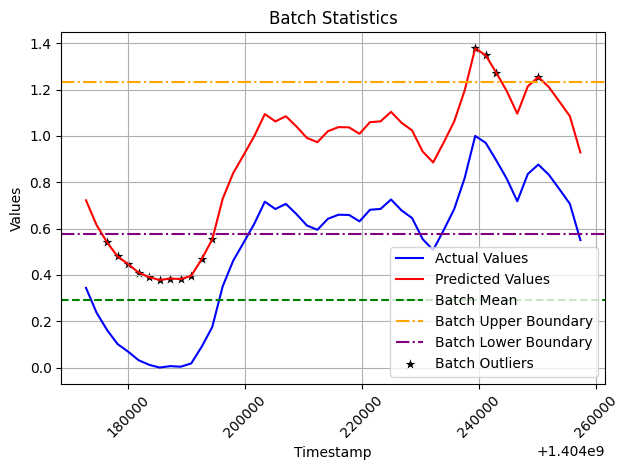


 Message Index: 2 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28074033947665267
Batch Mean Lower Bound w/ error rate: 0.18464544278296469
Batch Mean Upper Bound w/ error rate: 0.8163112066054332


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1404259200          0.421987                  0.446344          13370   
1   1404261000          0.281543                  0.305901           9945   
2   1404262800          0.184196                  0.208554           7571   
3   1404264600          0.116373                  0.140731           5917   
4   1404266400          0.071390                  0.095748           4820   
5   1404268200          0.022758                  0.047115           3634   
6   1404270000         -0.003527                  0.020831           2993   
7   1404271800         -0.022307                  0.002050           2535   
8   1404273600         -0.020872                  0.003485           2570   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


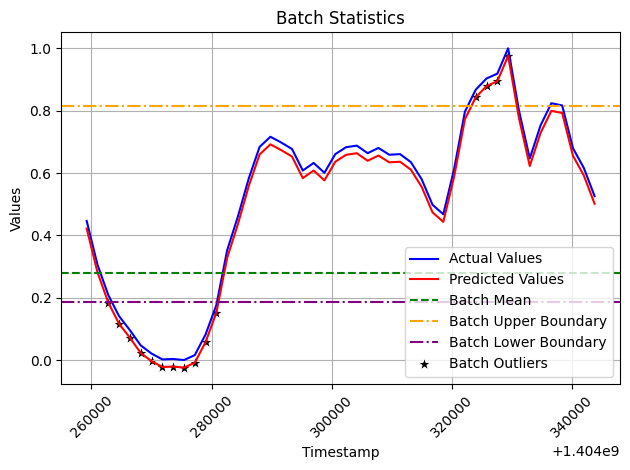


 Message Index: 3 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.23785936661141874
Batch Mean Lower Bound w/ error rate: 0.12828532140434196
Batch Mean Upper Bound w/ error rate: 0.6634688962800341


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1404345600          0.316407                  0.358694          12646   
1   1404347400          0.239328                  0.281614          10562   
2   1404349200          0.159955                  0.202241           8416   
3   1404351000          0.111207                  0.153493           7098   
4   1404352800          0.064160                  0.106447           5826   
5   1404354600          0.010789                  0.053075           4383   
6   1404356400         -0.030377                  0.011910           3270   
7   1404358200         -0.042286                  0.000000           2948   
8   1404360000         -0.034963                  0.007323           3146   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


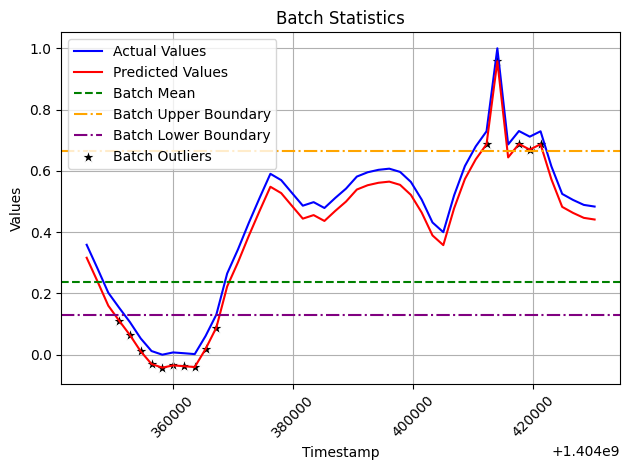


 Message Index: 4 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30231004610388834
Batch Mean Lower Bound w/ error rate: 0.6888314707559403
Batch Mean Upper Bound w/ error rate: 1.369029074489689


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1404432000          1.297230                  0.809984          15591   
1   1404433800          1.218566                  0.731321          14395   
2   1404435600          1.096230                  0.608984          12535   
3   1404437400          1.017698                  0.530453          11341   
4   1404439200          0.928182                  0.440937           9980   
5   1404441000          0.824525                  0.337280           8404   
6   1404442800          0.745336                  0.258090           7200   
7   1404444600          0.704425                  0.217180           6578   
8   1404446400          0.643849                  0.156604           5657   
9   1404

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


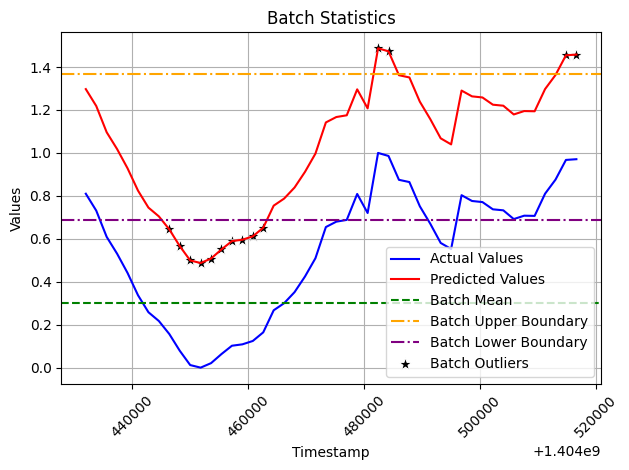


 Message Index: 5 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29331938736243385
Batch Mean Lower Bound w/ error rate: 0.20236648723510126
Batch Mean Upper Bound w/ error rate: 0.8623351088005775


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1404518400          0.915534                  0.961322          17576   
1   1404520200          0.827009                  0.872798          16189   
2   1404522000          0.715444                  0.761233          14441   
3   1404523800          0.593795                  0.639584          12535   
4   1404525600          0.496208                  0.541996          11006   
5   1404527400          0.377813                  0.423602           9151   
6   1404529200          0.304990                  0.350779           8010   
7   1404531000          0.246654                  0.292443           7096   
8   1404532800          0.202679                  0.248468           6407   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


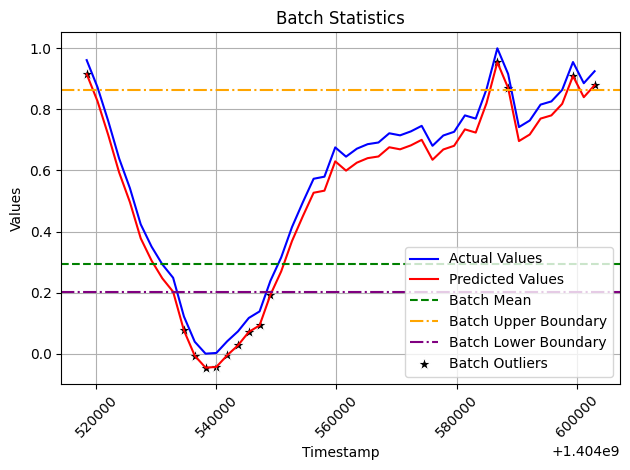


 Message Index: 6 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31493318298517015
Batch Mean Lower Bound w/ error rate: -0.05297502184772257
Batch Mean Upper Bound w/ error rate: 0.6556246398689103


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1404604800          0.574334                  0.889907          15427   
1   1404606600          0.518392                  0.833965          14615   
2   1404608400          0.415671                  0.731244          13124   
3   1404610200          0.353528                  0.669101          12222   
4   1404612000          0.278571                  0.594144          11134   
5   1404613800          0.141540                  0.457113           9145   
6   1404615600          0.105646                  0.421219           8624   
7   1404617400          0.054734                  0.370307           7885   
8   1404619200          0.005268                  0.320841           7167   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


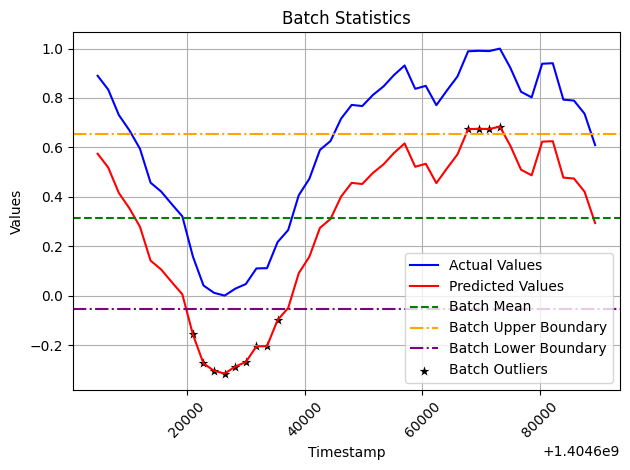


 Message Index: 7 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30245461441465576
Batch Mean Lower Bound w/ error rate: 0.09191368633058694
Batch Mean Upper Bound w/ error rate: 0.7724365687635624


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1404691200          0.208480                  0.331529           8675   
1   1404693000          0.135571                  0.258620           7180   
2   1404694800          0.037936                  0.160985           5178   
3   1404696600         -0.036192                  0.086857           3658   
4   1404698400         -0.059455                  0.063594           3181   
5   1404700200         -0.097446                  0.025604           2402   
6   1404702000         -0.119782                  0.003267           1944   
7   1404703800         -0.123049                  0.000000           1877   
8   1404705600         -0.104517                  0.018532           2257   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


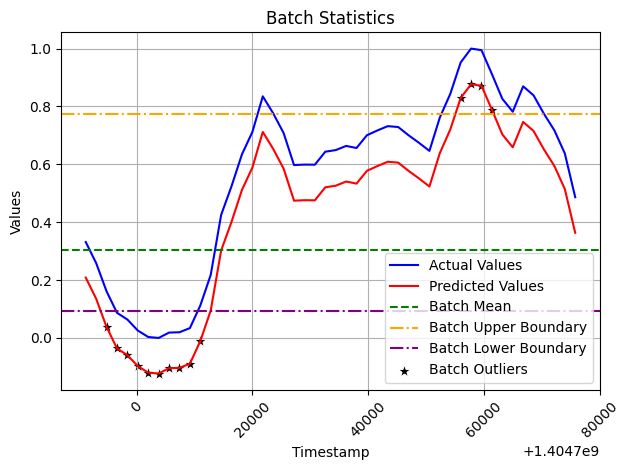


 Message Index: 8 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.307264186489869
Batch Mean Lower Bound w/ error rate: 0.2792986187830566
Batch Mean Upper Bound w/ error rate: 0.9706430383852618


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1404777600          0.377683                  0.313756           9292   
1   1404779400          0.327669                  0.263741           8110   
2   1404781200          0.295595                  0.231668           7352   
3   1404783000          0.198146                  0.134219           5049   
4   1404784800          0.130529                  0.066602           3451   
5   1404786600          0.088808                  0.024880           2465   
6   1404788400          0.074421                  0.010494           2125   
7   1404790200          0.063927                  0.000000           1877   
8   1404792000          0.072051                  0.008124           2069   
9   14047

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


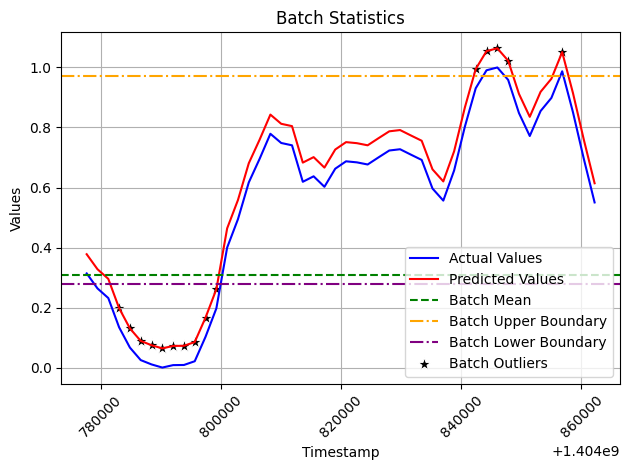


 Message Index: 9 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3026058807081004
Batch Mean Lower Bound w/ error rate: 0.3720793679585711
Batch Mean Upper Bound w/ error rate: 1.052942599551797


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1404864000          0.565014                  0.405955          12053   
1   1404865800          0.454916                  0.295857           9409   
2   1404867600          0.385418                  0.226359           7740   
3   1404869400          0.293309                  0.134249           5528   
4   1404871200          0.257456                  0.098397           4667   
5   1404873000          0.198118                  0.039059           3242   
6   1404874800          0.174633                  0.015574           2678   
7   1404876600          0.161807                  0.002748           2370   
8   1404878400          0.166180                  0.007121           2475   
9   14048

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


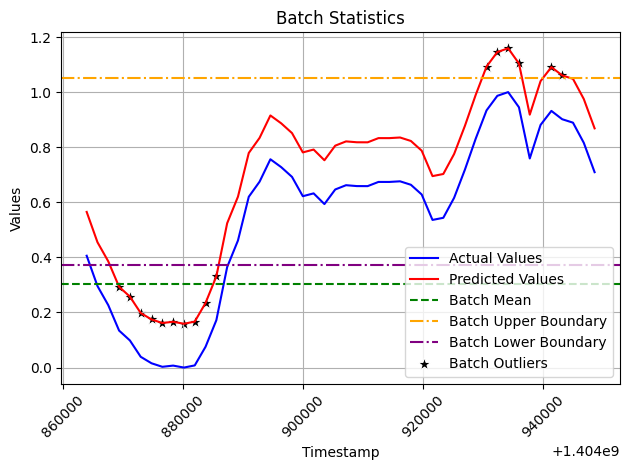


 Message Index: 10 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3027071370974789
Batch Mean Lower Bound w/ error rate: 0.33112281633135066
Batch Mean Upper Bound w/ error rate: 1.0122138748006781


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1404950400          0.642854                  0.534920          15185   
1   1404952200          0.485333                  0.377399          11459   
2   1404954000          0.374907                  0.266974           8847   
3   1404955800          0.279067                  0.171134           6580   
4   1404957600          0.222713                  0.114780           5247   
5   1404959400          0.175364                  0.067430           4127   
6   1404961200          0.146320                  0.038387           3440   
7   1404963000          0.125901                  0.017967           2957   
8   1404964800          0.118376                  0.010442           2779   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


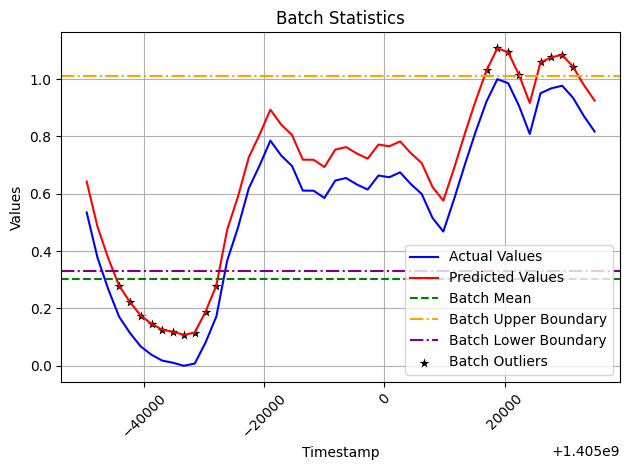


 Message Index: 11 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2718780321957088
Batch Mean Lower Bound w/ error rate: 0.4285454835144784
Batch Mean Upper Bound w/ error rate: 1.0402710559548232


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405036800          0.895385                  0.712625          20051   
1   1405038600          0.729876                  0.547117          16122   
2   1405040400          0.602870                  0.420110          13107   
3   1405042200          0.493304                  0.310544          10506   
4   1405044000          0.406442                  0.223683           8444   
5   1405045800          0.340391                  0.157631           6876   
6   1405047600          0.277161                  0.094402           5375   
7   1405049400          0.234658                  0.051898           4366   
8   1405051200          0.226949                  0.044189           4183   
9   1405

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


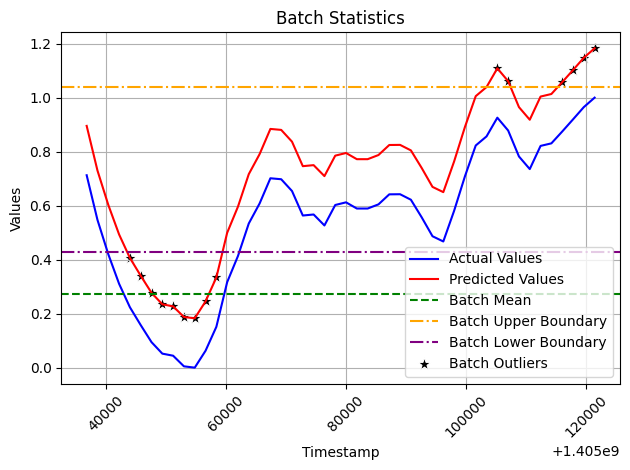


 Message Index: 12 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28350491200532163
Batch Mean Lower Bound w/ error rate: 0.2611171474241096
Batch Mean Upper Bound w/ error rate: 0.8990031994360832


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405123200          0.994699                  1.000000          25871   
1   1405125000          0.950287                  0.955588          24874   
2   1405126800          0.877634                  0.882935          23243   
3   1405128600          0.807742                  0.813043          21674   
4   1405130400          0.698472                  0.703773          19221   
5   1405132200          0.561228                  0.566529          16140   
6   1405134000          0.437881                  0.443182          13371   
7   1405135800          0.378636                  0.383937          12041   
8   1405137600          0.301127                  0.306428          10301   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


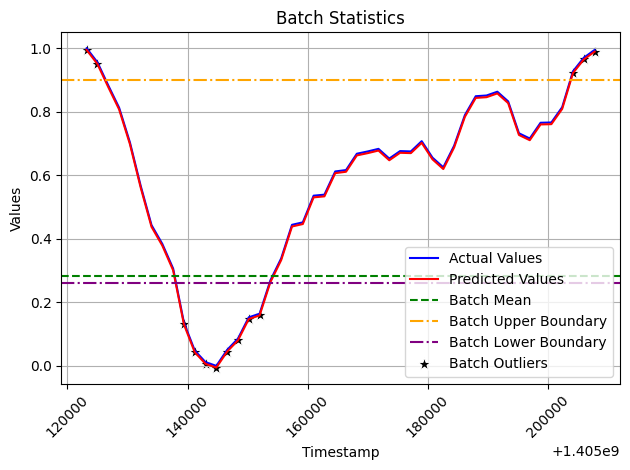


 Message Index: 13 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2721669932427572
Batch Mean Lower Bound w/ error rate: -0.3203210357758733
Batch Mean Upper Bound w/ error rate: 0.2920546990203305


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405209600          0.472501                  1.000000          25792   
1   1405211400          0.438561                  0.966060          25033   
2   1405213200          0.389462                  0.916961          23935   
3   1405215000          0.277894                  0.805393          21440   
4   1405216800          0.189713                  0.717211          19468   
5   1405218600          0.062449                  0.589948          16622   
6   1405220400         -0.033111                  0.494388          14485   
7   1405222200         -0.100678                  0.426821          12974   
8   1405224000         -0.180408                  0.347091          11191   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


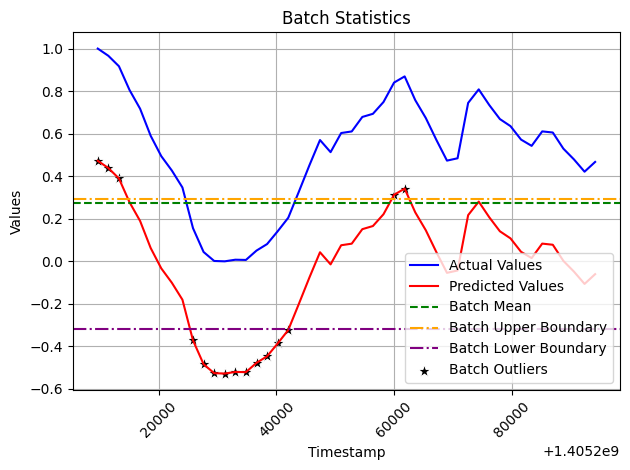


 Message Index: 14 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2707778786934898
Batch Mean Lower Bound w/ error rate: 0.16507300219904608
Batch Mean Upper Bound w/ error rate: 0.7743232292593981


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405296000          0.389846                  0.425604          12484   
1   1405297800          0.252930                  0.288688           9037   
2   1405299600          0.187630                  0.223387           7393   
3   1405301400          0.099570                  0.135327           5176   
4   1405303200          0.032164                  0.067922           3479   
5   1405305000          0.003407                  0.039164           2755   
6   1405306800         -0.025510                  0.010248           2027   
7   1405308600         -0.035758                  0.000000           1769   
8   1405310400         -0.022968                  0.012790           2091   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


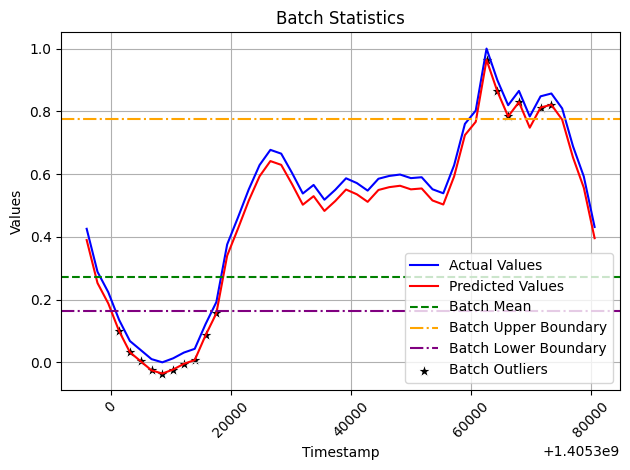


 Message Index: 15 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29219520987524855
Batch Mean Lower Bound w/ error rate: 0.2807368982822772
Batch Mean Upper Bound w/ error rate: 0.9381761205015865


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405382400          0.408255                  0.324206          10089   
1   1405384200          0.347474                  0.263424           8553   
2   1405386000          0.262911                  0.178861           6416   
3   1405387800          0.194769                  0.110720           4694   
4   1405389600          0.164656                  0.080606           3933   
5   1405391400          0.121127                  0.037078           2833   
6   1405393200          0.091687                  0.007637           2089   
7   1405395000          0.084049                  0.000000           1896   
8   1405396800          0.090341                  0.006292           2055   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


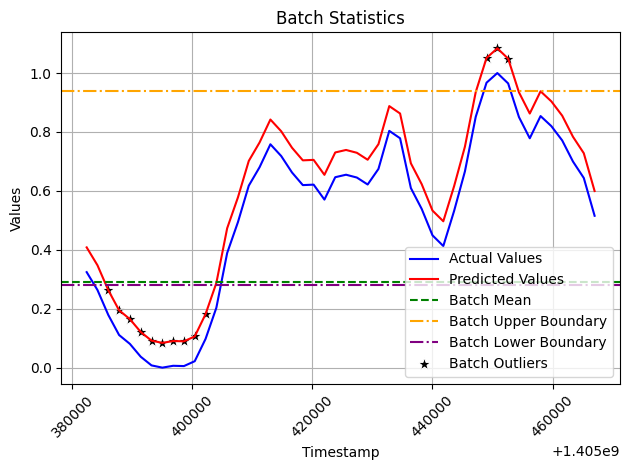


 Message Index: 16 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.303448598078188
Batch Mean Lower Bound w/ error rate: 0.4438703684069343
Batch Mean Upper Bound w/ error rate: 1.1266297140828574


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405468800          0.625089                  0.395832          11815   
1   1405470600          0.508071                  0.278814           9024   
2   1405472400          0.438430                  0.209174           7363   
3   1405474200          0.373401                  0.144145           5812   
4   1405476000          0.320867                  0.091610           4559   
5   1405477800          0.283720                  0.054463           3673   
6   1405479600          0.248375                  0.019119           2830   
7   1405481400          0.229257                  0.000000           2374   
8   1405483200          0.236887                  0.007631           2556   
9   14054

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


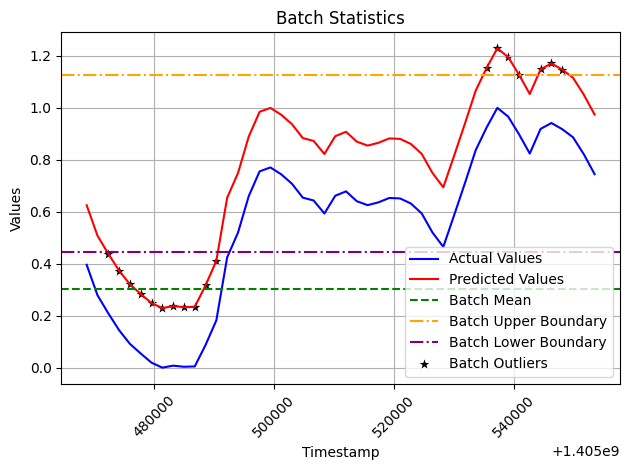


 Message Index: 17 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2966538502429139
Batch Mean Lower Bound w/ error rate: 0.33987669565449935
Batch Mean Upper Bound w/ error rate: 1.0073478587010556


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405555200          0.712050                  0.600717          16928   
1   1405557000          0.533913                  0.422580          12753   
2   1405558800          0.420162                  0.308828          10087   
3   1405560600          0.326037                  0.214703           7881   
4   1405562400          0.246035                  0.134702           6006   
5   1405564200          0.176743                  0.065409           4382   
6   1405566000          0.146620                  0.035286           3676   
7   1405567800          0.126907                  0.015574           3214   
8   1405569600          0.126523                  0.015190           3205   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


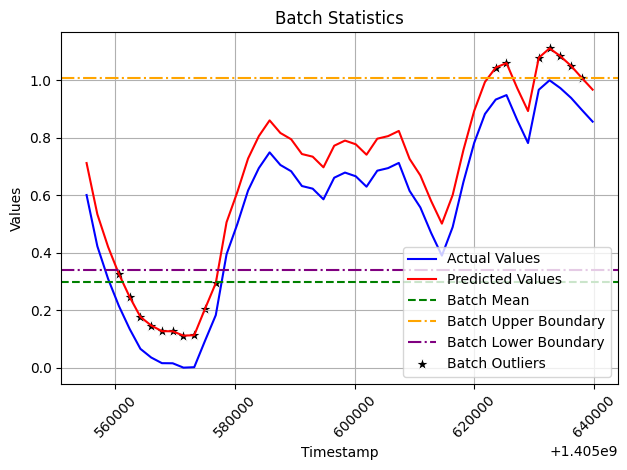


 Message Index: 18 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28409524306759143
Batch Mean Lower Bound w/ error rate: 0.38113045722960587
Batch Mean Upper Bound w/ error rate: 1.0203447541316866


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405641600          0.904361                  0.768861          20850   
1   1405643400          0.721053                  0.585553          16734   
2   1405645200          0.604014                  0.468513          14106   
3   1405647000          0.491829                  0.356328          11587   
4   1405648800          0.374433                  0.238933           8951   
5   1405650600          0.296407                  0.160907           7199   
6   1405652400          0.245281                  0.109780           6051   
7   1405654200          0.184801                  0.049301           4693   
8   1405656000          0.176518                  0.041017           4507   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


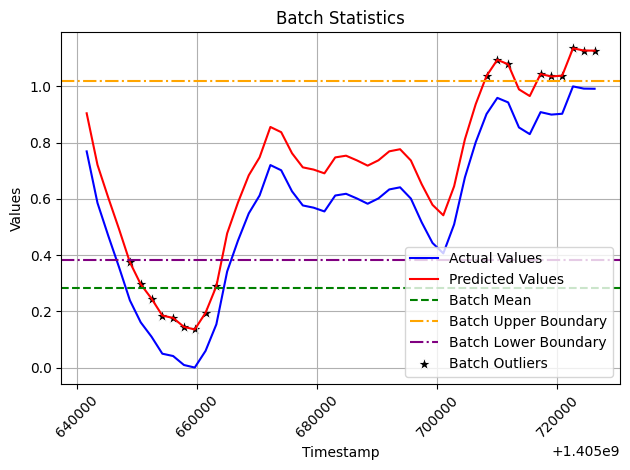


 Message Index: 19 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28116235346047463
Batch Mean Lower Bound w/ error rate: 0.254050611033829
Batch Mean Upper Bound w/ error rate: 0.886665906319897


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405728000          0.997437                  1.000000          26100   
1   1405729800          0.932134                  0.934697          24625   
2   1405731600          0.845005                  0.847567          22657   
3   1405733400          0.740166                  0.742728          20289   
4   1405735200          0.662023                  0.664586          18524   
5   1405737000          0.547754                  0.550317          15943   
6   1405738800          0.425383                  0.427945          13179   
7   1405740600          0.391912                  0.394475          12423   
8   1405742400          0.305801                  0.308363          10478   
9   14057

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


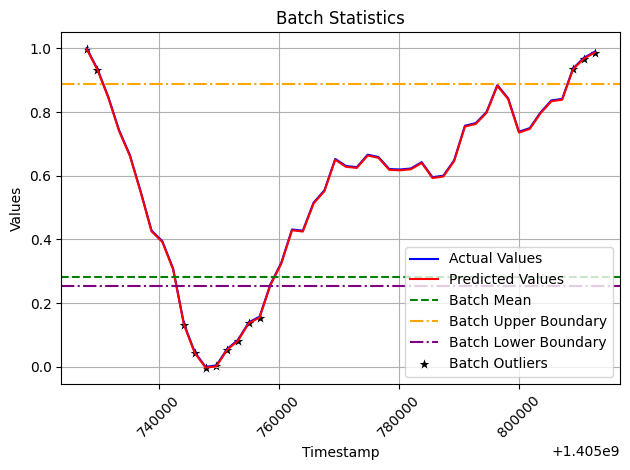


 Message Index: 20 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.25565396515922156
Batch Mean Lower Bound w/ error rate: -0.36405326819286693
Batch Mean Upper Bound w/ error rate: 0.2111681534153816


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405814400          0.408126                  1.000000          25137   
1   1405816200          0.360347                  0.952221          24099   
2   1405818000          0.312430                  0.904304          23058   
3   1405819800          0.207850                  0.799724          20786   
4   1405821600          0.135629                  0.727503          19217   
5   1405823400          0.002694                  0.594568          16329   
6   1405825200         -0.091023                  0.500852          14293   
7   1405827000         -0.141655                  0.450219          13193   
8   1405828800         -0.234958                  0.356916          11166   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


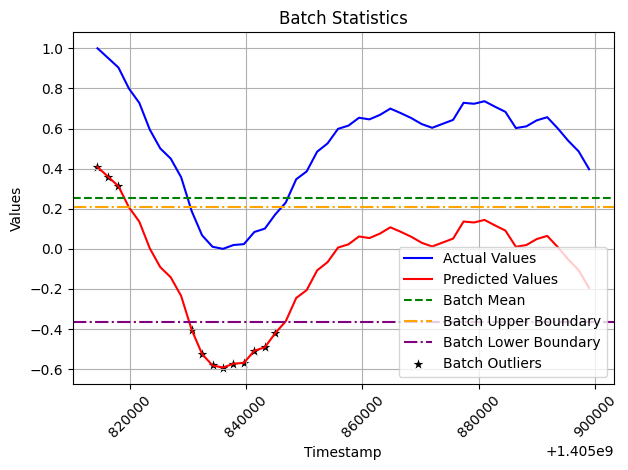


 Message Index: 21 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3067742702562543
Batch Mean Lower Bound w/ error rate: 0.37425305041007395
Batch Mean Upper Bound w/ error rate: 1.064495158486646


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405900800          0.508104                  0.362309           9494   
1   1405902600          0.388077                  0.242282           6963   
2   1405904400          0.323962                  0.178167           5611   
3   1405906200          0.254203                  0.108408           4140   
4   1405908000          0.217688                  0.071893           3370   
5   1405909800          0.182358                  0.036563           2625   
6   1405911600          0.157129                  0.011334           2093   
7   1405913400          0.145795                  0.000000           1854   
8   1405915200          0.175576                  0.029781           2482   
9   1405

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


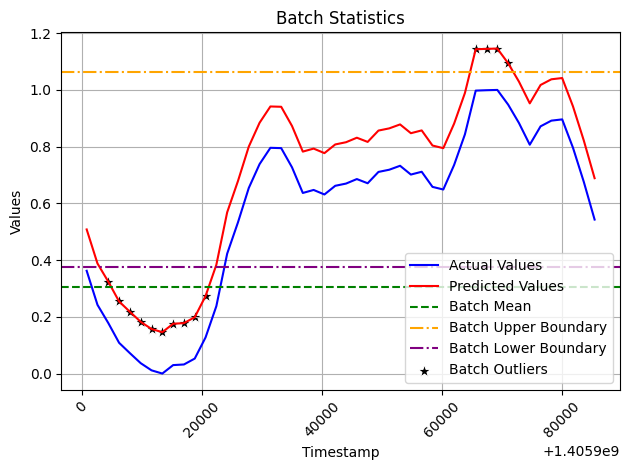


 Message Index: 22 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3096160456808493
Batch Mean Lower Bound w/ error rate: 0.29774251134680846
Batch Mean Upper Bound w/ error rate: 0.9943786141287194


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1405987200          0.440249                  0.352793          10611   
1   1405989000          0.332519                  0.245063           8009   
2   1405990800          0.258036                  0.170579           6210   
3   1405992600          0.200900                  0.113443           4830   
4   1405994400          0.156309                  0.068853           3753   
5   1405996200          0.123560                  0.036103           2962   
6   1405998000          0.099422                  0.011965           2379   
7   1405999800          0.088450                  0.000994           2114   
8   1406001600          0.093336                  0.005879           2232   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


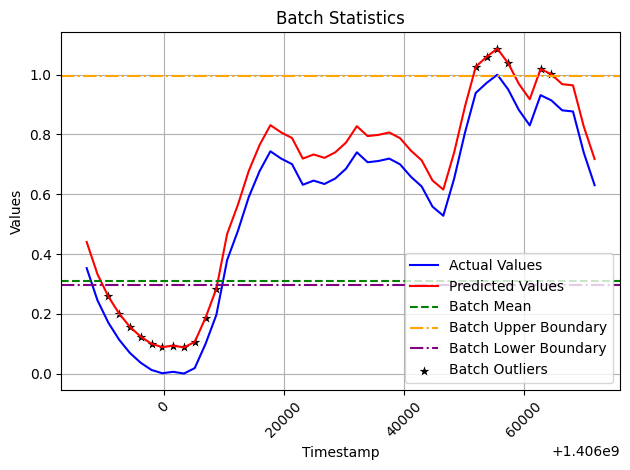


 Message Index: 23 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3101131617976079
Batch Mean Lower Bound w/ error rate: 0.28531908429792874
Batch Mean Upper Bound w/ error rate: 0.9830736983425465


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406073600          0.511071                  0.453016          13369   
1   1406075400          0.387916                  0.329861          10390   
2   1406077200          0.288863                  0.230807           7994   
3   1406079000          0.201840                  0.143784           5889   
4   1406080800          0.153140                  0.095085           4711   
5   1406082600          0.113701                  0.055645           3757   
6   1406084400          0.085134                  0.027078           3066   
7   1406086200          0.067812                  0.009757           2647   
8   1406088000          0.067729                  0.009674           2645   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


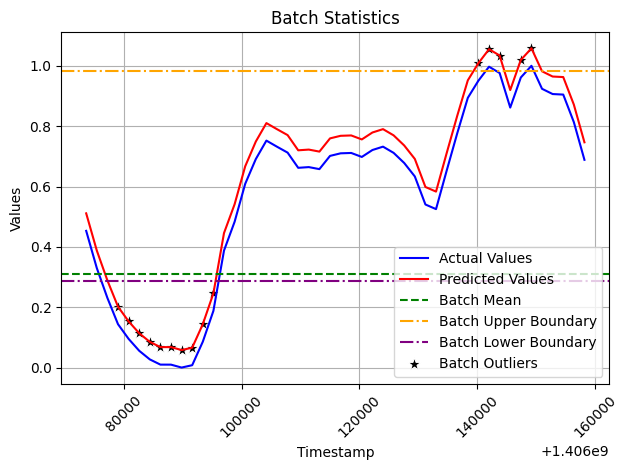


 Message Index: 24 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30844770822671974
Batch Mean Lower Bound w/ error rate: 0.42910376186644633
Batch Mean Upper Bound w/ error rate: 1.1231111053765657


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406160000          0.753337                  0.557910          15542   
1   1406161800          0.602849                  0.407422          12026   
2   1406163600          0.459552                  0.264124           8678   
3   1406165400          0.389530                  0.194102           7042   
4   1406167200          0.317325                  0.121897           5355   
5   1406169000          0.264851                  0.069423           4129   
6   1406170800          0.221194                  0.025766           3109   
7   1406172600          0.196583                  0.001156           2534   
8   1406174400          0.207455                  0.012027           2788   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


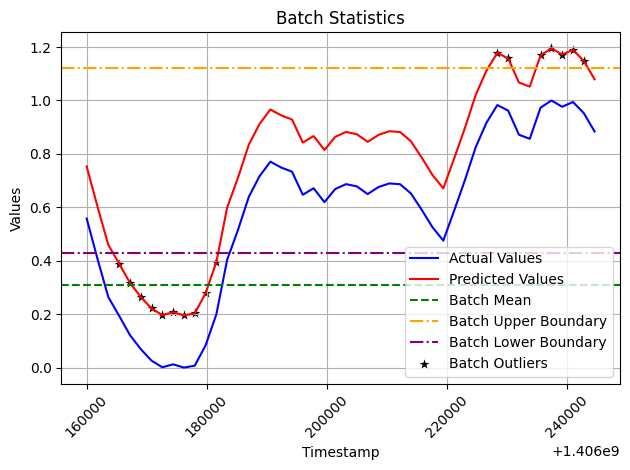


 Message Index: 25 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.27670250755747755
Batch Mean Lower Bound w/ error rate: 0.34061701777477393
Batch Mean Upper Bound w/ error rate: 0.9631976597790984


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406246400          0.830386                  0.734032          20525   
1   1406248200          0.704501                  0.608148          17608   
2   1406250000          0.567612                  0.471258          14436   
3   1406251800          0.425587                  0.329234          11145   
4   1406253600          0.329350                  0.232997           8915   
5   1406255400          0.257237                  0.160884           7244   
6   1406257200          0.197338                  0.100984           5856   
7   1406259000          0.158368                  0.062015           4953   
8   1406260800          0.140804                  0.044450           4546   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


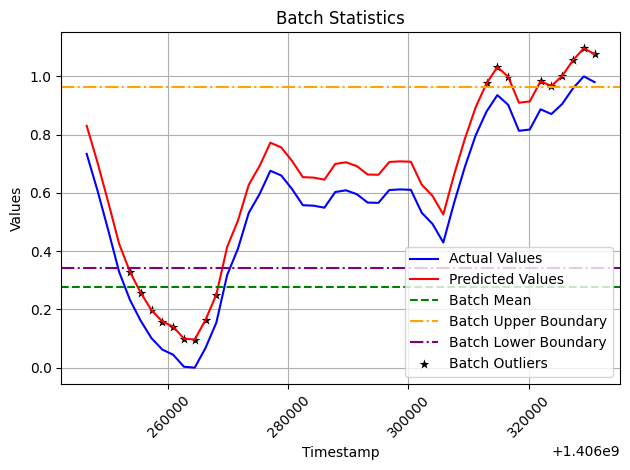


 Message Index: 26 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.27946564428315634
Batch Mean Lower Bound w/ error rate: 0.253761863807166
Batch Mean Upper Bound w/ error rate: 0.8825595634442678


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406332800          0.998916                  1.000000          26300   
1   1406334600          0.911466                  0.912550          24337   
2   1406336400          0.857427                  0.858511          23124   
3   1406338200          0.748326                  0.749410          20675   
4   1406340000          0.658692                  0.659776          18663   
5   1406341800          0.539924                  0.541008          15997   
6   1406343600          0.424452                  0.425536          13405   
7   1406345400          0.358341                  0.359424          11921   
8   1406347200          0.281805                  0.282889          10203   
9   1406

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


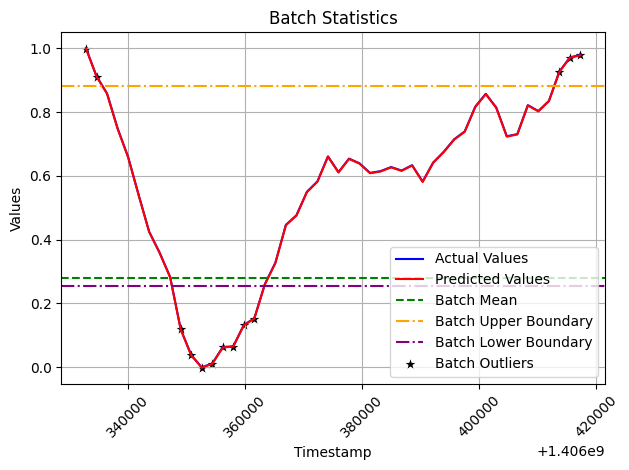


 Message Index: 27 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.25770750507332385
Batch Mean Lower Bound w/ error rate: -0.3364757791389272
Batch Mean Upper Bound w/ error rate: 0.24336610727605154


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406419200          0.441245                  1.000000          25659   
1   1406421000          0.400228                  0.958982          24748   
2   1406422800          0.301353                  0.860108          22552   
3   1406424600          0.218508                  0.777262          20712   
4   1406426400          0.146918                  0.705673          19122   
5   1406428200          0.041335                  0.600090          16777   
6   1406430000         -0.062312                  0.496443          14475   
7   1406431800         -0.141330                  0.417425          12720   
8   1406433600         -0.208012                  0.350743          11239   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


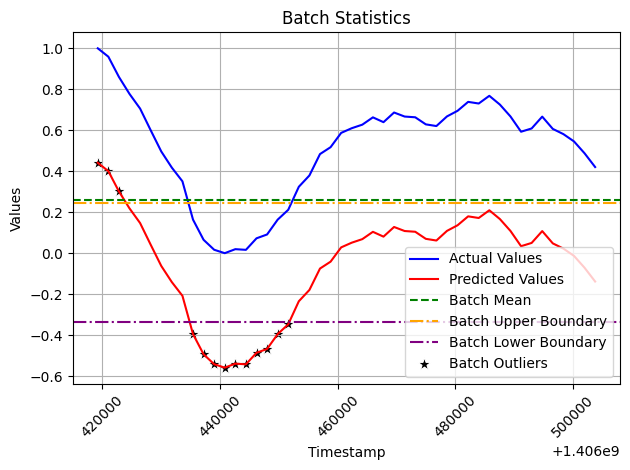


 Message Index: 28 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2996485818001857
Batch Mean Lower Bound w/ error rate: 0.4233219083344754
Batch Mean Upper Bound w/ error rate: 1.0975312173848932


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406505600          0.635278                  0.446318          10323   
1   1406507400          0.489107                  0.300147           7645   
2   1406509200          0.442493                  0.253534           6791   
3   1406511000          0.366242                  0.177283           5394   
4   1406512800          0.273452                  0.084493           3694   
5   1406514600          0.219907                  0.030948           2713   
6   1406516400          0.201513                  0.012554           2376   
7   1406518200          0.188959                  0.000000           2146   
8   1406520000          0.194636                  0.005677           2250   
9   1406

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


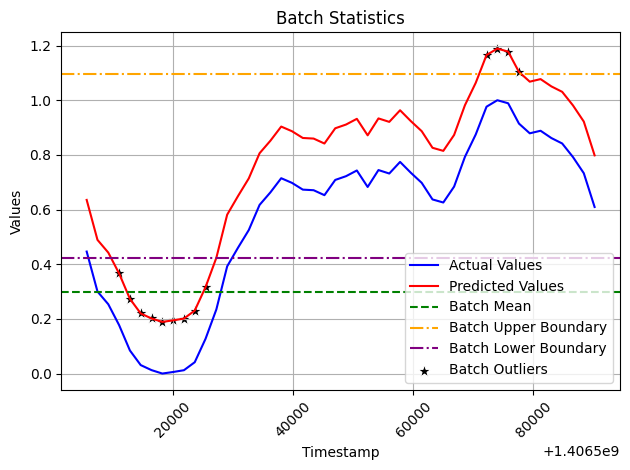


 Message Index: 29 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30813310017227363
Batch Mean Lower Bound w/ error rate: 0.27333999620845867
Batch Mean Upper Bound w/ error rate: 0.9666394715960744


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406592000          0.433036                  0.372695          10468   
1   1406593800          0.322207                  0.261865           7932   
2   1406595600          0.241270                  0.180928           6080   
3   1406597400          0.182490                  0.122148           4735   
4   1406599200          0.143114                  0.082772           3834   
5   1406601000          0.095566                  0.035224           2746   
6   1406602800          0.073627                  0.013286           2244   
7   1406604600          0.060341                  0.000000           1940   
8   1406606400          0.065848                  0.005507           2066   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


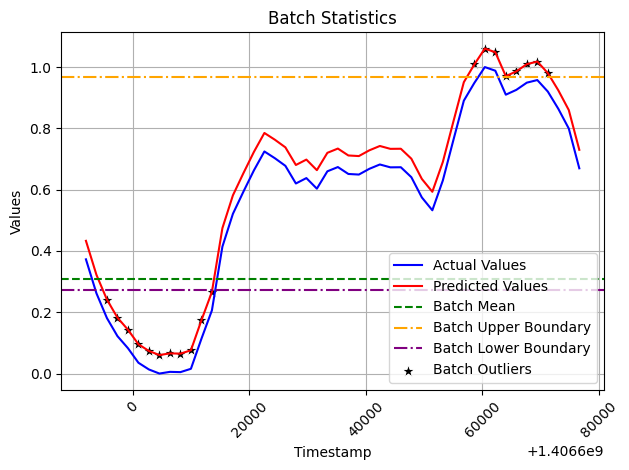


 Message Index: 30 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3122464351929058
Batch Mean Lower Bound w/ error rate: 0.30067255469533444
Batch Mean Upper Bound w/ error rate: 1.0032270338793725


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406678400          0.569388                  0.486326          13549   
1   1406680200          0.418376                  0.335313          10142   
2   1406682000          0.313815                  0.230752           7783   
3   1406683800          0.235272                  0.152210           6011   
4   1406685600          0.187579                  0.104517           4935   
5   1406687400          0.131420                  0.048358           3668   
6   1406689200          0.105889                  0.022827           3092   
7   1406691000          0.083062                  0.000000           2577   
8   1406692800          0.091706                  0.008643           2772   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


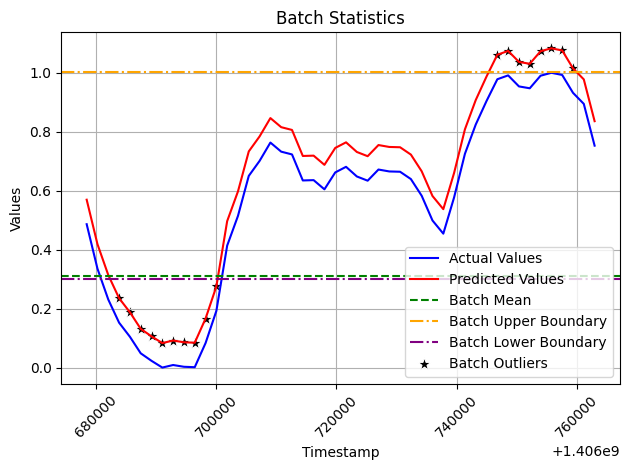


 Message Index: 31 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2999841367083347
Batch Mean Lower Bound w/ error rate: 0.35253485942471574
Batch Mean Upper Bound w/ error rate: 1.0274991670184688


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406764800          0.674677                  0.552143          15486   
1   1406766600          0.541213                  0.418678          12362   
2   1406768400          0.414712                  0.292178           9401   
3   1406770200          0.317733                  0.195198           7131   
4   1406772000          0.267235                  0.144700           5949   
5   1406773800          0.214815                  0.092280           4722   
6   1406775600          0.175083                  0.052548           3792   
7   1406777400          0.152611                  0.030076           3266   
8   1406779200          0.152654                  0.030119           3267   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


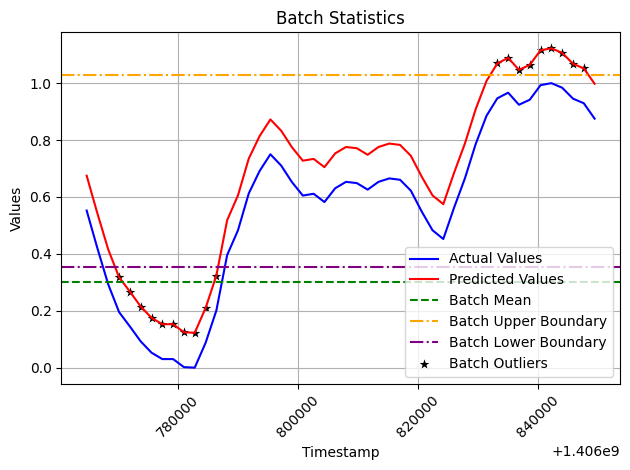


 Message Index: 32 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2738618075508839
Batch Mean Lower Bound w/ error rate: 0.3570760519209621
Batch Mean Upper Bound w/ error rate: 0.9732651189104509


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406851200          0.846965                  0.743117          20138   
1   1406853000          0.719430                  0.615582          17252   
2   1406854800          0.580272                  0.476424          14103   
3   1406856600          0.436916                  0.333068          10859   
4   1406858400          0.365459                  0.261611           9242   
5   1406860200          0.271774                  0.167926           7122   
6   1406862000          0.211719                  0.107870           5763   
7   1406863800          0.174112                  0.070264           4912   
8   1406865600          0.162445                  0.058597           4648   
9   1406

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


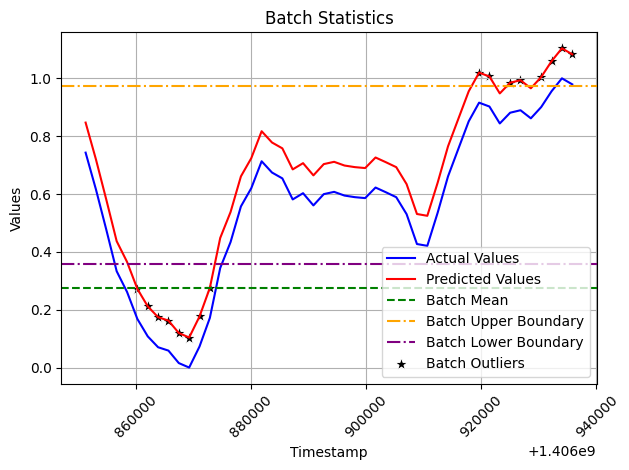


 Message Index: 33 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28492421833404313
Batch Mean Lower Bound w/ error rate: 0.274830153403319
Batch Mean Upper Bound w/ error rate: 0.915909644654916


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1406937600          1.009296                  1.000000          25234   
1   1406939400          0.923462                  0.914165          23378   
2   1406941200          0.868058                  0.858762          22180   
3   1406943000          0.790224                  0.780928          20497   
4   1406944800          0.717894                  0.708597          18933   
5   1406946600          0.630394                  0.621098          17041   
6   1406948400          0.535218                  0.525921          14983   
7   1406950200          0.419832                  0.410535          12488   
8   1406952000          0.330390                  0.321093          10554   
9   14069

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


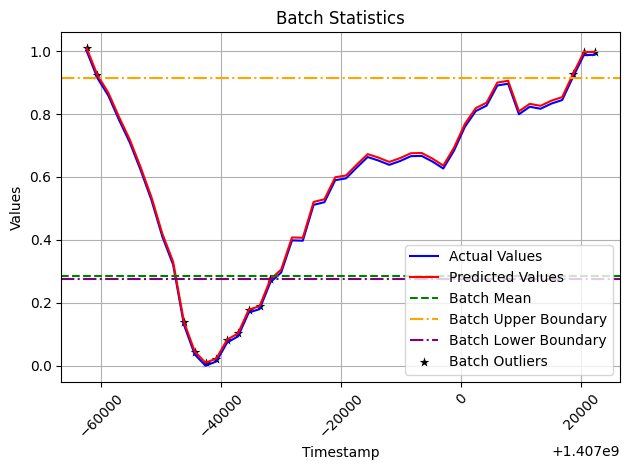


 Message Index: 34 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2583068378400851
Batch Mean Lower Bound w/ error rate: -0.4071517002643223
Batch Mean Upper Bound w/ error rate: 0.1740386848758692


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407024000          0.360412                  1.000000          24613   
1   1407025800          0.306023                  0.945611          23468   
2   1407027600          0.242229                  0.881816          22125   
3   1407029400          0.246741                  0.886329          22220   
4   1407031200          0.149411                  0.788999          20171   
5   1407033000          0.031560                  0.671148          17690   
6   1407034800         -0.100589                  0.538999          14908   
7   1407036600         -0.169134                  0.470454          13465   
8   1407038400         -0.254731                  0.384857          11663   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


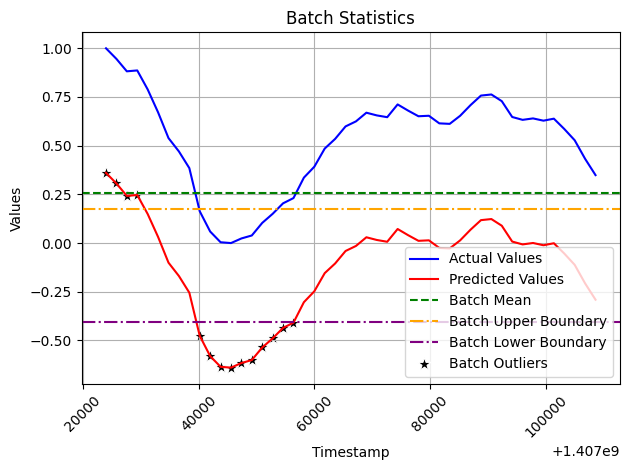


 Message Index: 35 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31565063875739774
Batch Mean Lower Bound w/ error rate: 0.39436787307711274
Batch Mean Upper Bound w/ error rate: 1.1045818102812577


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407110400          0.509221                  0.330889           8882   
1   1407112200          0.412125                  0.233793           6896   
2   1407114000          0.339817                  0.161484           5417   
3   1407115800          0.282517                  0.104185           4245   
4   1407117600          0.245019                  0.066686           3478   
5   1407119400          0.198426                  0.020094           2525   
6   1407121200          0.186839                  0.008507           2288   
7   1407123000          0.178332                  0.000000           2114   
8   1407124800          0.183124                  0.004791           2212   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


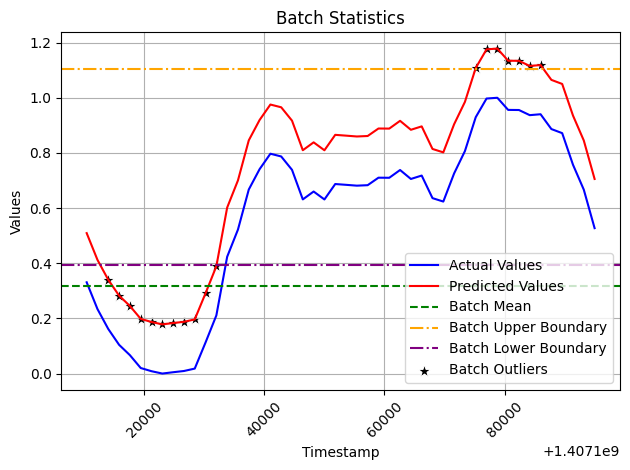


 Message Index: 36 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3169693816252979
Batch Mean Lower Bound w/ error rate: 0.35021031220062787
Batch Mean Upper Bound w/ error rate: 1.0633914208575481


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407196800          0.506128                  0.380032          10385   
1   1407198600          0.403564                  0.277468           8125   
2   1407200400          0.320469                  0.194373           6294   
3   1407202200          0.238372                  0.112276           4485   
4   1407204000          0.201340                  0.075244           3669   
5   1407205800          0.175381                  0.049285           3097   
6   1407207600          0.147562                  0.021466           2484   
7   1407209400          0.126096                  0.000000           2011   
8   1407211200          0.133539                  0.007443           2175   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


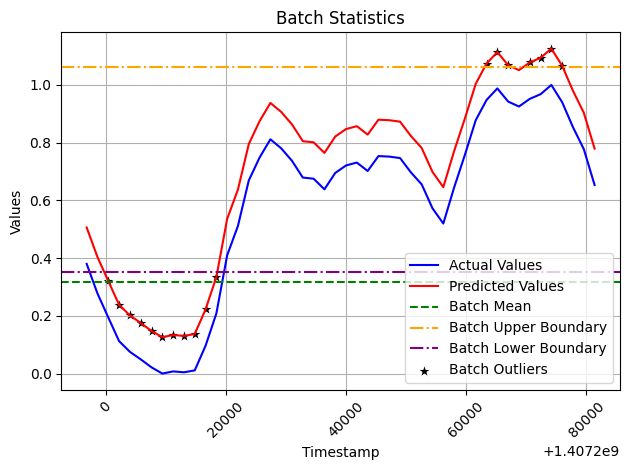


 Message Index: 37 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31012854045854055
Batch Mean Lower Bound w/ error rate: 0.2993665144814336
Batch Mean Upper Bound w/ error rate: 0.9971557305131499


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407283200          0.559974                  0.494068          13399   
1   1407285000          0.420014                  0.354108          10273   
2   1407286800          0.305844                  0.239937           7723   
3   1407288600          0.222432                  0.156526           5860   
4   1407290400          0.168884                  0.102977           4664   
5   1407292200          0.133558                  0.067652           3875   
6   1407294000          0.096934                  0.031028           3057   
7   1407295800          0.079831                  0.013924           2675   
8   1407297600          0.085562                  0.019655           2803   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


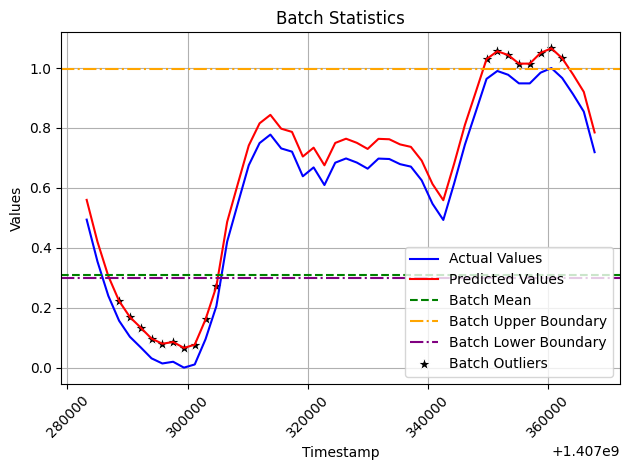


 Message Index: 38 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3075125190931955
Batch Mean Lower Bound w/ error rate: 0.3937730634349105
Batch Mean Upper Bound w/ error rate: 1.0856762313946002


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407369600          0.726170                  0.571704          15411   
1   1407371400          0.566779                  0.412313          11851   
2   1407373200          0.453324                  0.298858           9317   
3   1407375000          0.348377                  0.193911           6973   
4   1407376800          0.296172                  0.141706           5807   
5   1407378600          0.251623                  0.097157           4812   
6   1407380400          0.203537                  0.049071           3738   
7   1407382200          0.175330                  0.020864           3108   
8   1407384000          0.179405                  0.024938           3199   
9   1407

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


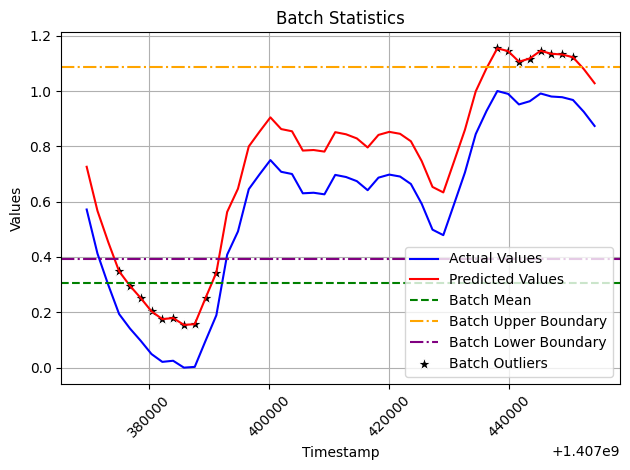


 Message Index: 39 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2862775237187812
Batch Mean Lower Bound w/ error rate: 0.357925686304243
Batch Mean Upper Bound w/ error rate: 1.0020501146715006


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407456000          0.846923                  0.745262          19329   
1   1407457800          0.686006                  0.584344          15933   
2   1407459600          0.566455                  0.464793          13410   
3   1407461400          0.433968                  0.332307          10614   
4   1407463200          0.354362                  0.252701           8934   
5   1407465000          0.266464                  0.164803           7079   
6   1407466800          0.206002                  0.104340           5803   
7   1407468600          0.167573                  0.065912           4992   
8   1407470400          0.146866                  0.045205           4555   
9   14074

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


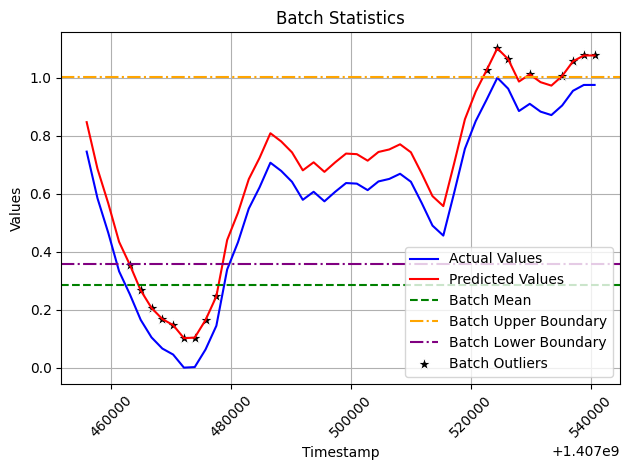


 Message Index: 40 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28662673589197685
Batch Mean Lower Bound w/ error rate: 0.28226699273450484
Batch Mean Upper Bound w/ error rate: 0.9271771484914527


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407542400          1.015007                  1.000000          23849   
1   1407544200          0.948471                  0.933464          22495   
2   1407546000          0.843901                  0.828894          20367   
3   1407547800          0.745670                  0.730663          18368   
4   1407549600          0.702967                  0.687961          17499   
5   1407551400          0.609994                  0.594988          15607   
6   1407553200          0.506555                  0.491548          13502   
7   1407555000          0.416530                  0.401523          11670   
8   1407556800          0.332304                  0.317297           9956   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


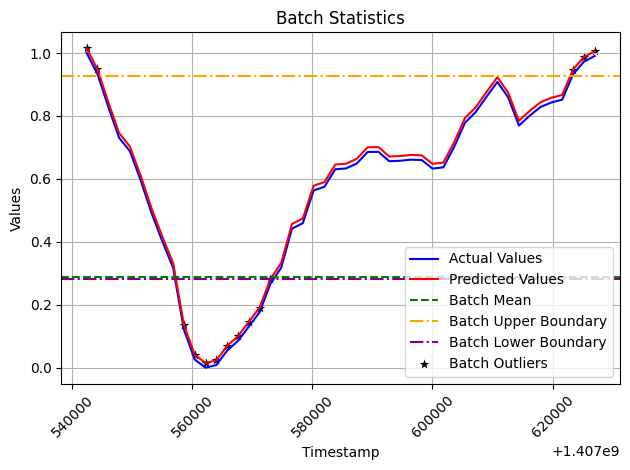


 Message Index: 41 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2499086489573031
Batch Mean Lower Bound w/ error rate: -0.3473408617709701
Batch Mean Upper Bound w/ error rate: 0.2149535983829619


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407628800          0.427546                  1.000000          23701   
1   1407630600          0.321441                  0.893895          21532   
2   1407632400          0.273745                  0.846199          20557   
3   1407634200          0.168961                  0.741415          18415   
4   1407636000          0.139511                  0.711966          17813   
5   1407637800          0.061730                  0.634185          16223   
6   1407639600         -0.057925                  0.514529          13777   
7   1407641400         -0.153757                  0.418697          11818   
8   1407643200         -0.218281                  0.354173          10499   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


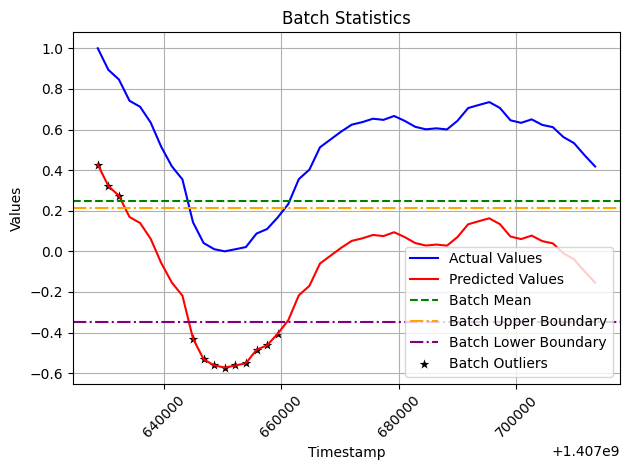


 Message Index: 42 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3109205309879142
Batch Mean Lower Bound w/ error rate: 0.31719009089712263
Batch Mean Upper Bound w/ error rate: 1.0167612856199297


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407715200          0.479532                  0.386289           9595   
1   1407717000          0.359804                  0.266560           7267   
2   1407718800          0.274894                  0.181650           5616   
3   1407720600          0.204795                  0.111551           4253   
4   1407722400          0.153776                  0.060533           3261   
5   1407724200          0.128524                  0.035281           2770   
6   1407726000          0.101267                  0.008023           2240   
7   1407727800          0.093244                  0.000000           2084   
8   1407729600          0.109855                  0.016612           2407   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


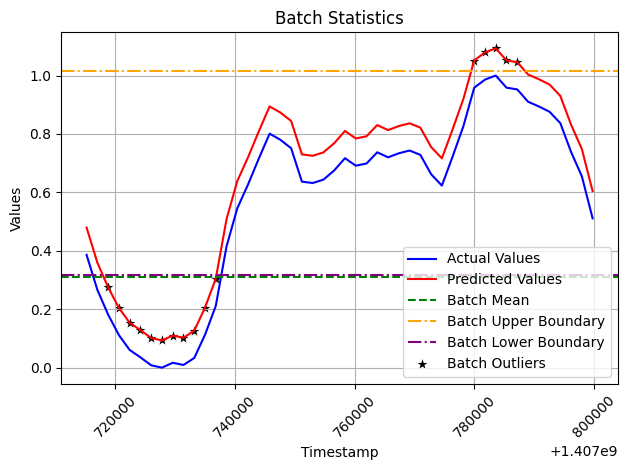


 Message Index: 43 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2871404710627781
Batch Mean Lower Bound w/ error rate: 0.20045091338223936
Batch Mean Upper Bound w/ error rate: 0.8465169732734901


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407801600          0.326416                  0.317695           9701   
1   1407803400          0.245345                  0.236624           7757   
2   1407805200          0.172197                  0.163476           6003   
3   1407807000          0.115690                  0.106969           4648   
4   1407808800          0.080534                  0.071813           3805   
5   1407810600          0.050841                  0.042120           3093   
6   1407812400          0.025569                  0.016848           2487   
7   1407814200          0.012099                  0.003378           2164   
8   1407816000          0.017270                  0.008549           2288   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


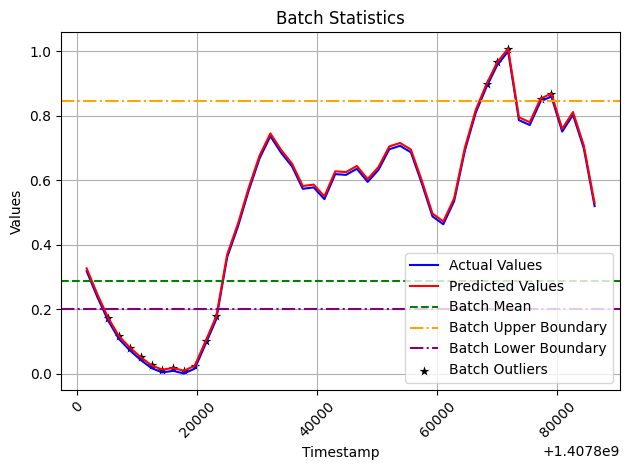


 Message Index: 44 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29957371319322085
Batch Mean Lower Bound w/ error rate: 0.41753898544045986
Batch Mean Upper Bound w/ error rate: 1.0915798401252068


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407888000          0.656115                  0.476637          12933   
1   1407889800          0.584580                  0.405102          11301   
2   1407891600          0.444052                  0.264574           8095   
3   1407893400          0.363882                  0.184404           6266   
4   1407895200          0.297519                  0.118042           4752   
5   1407897000          0.240274                  0.060796           3446   
6   1407898800          0.211651                  0.032173           2793   
7   1407900600          0.191488                  0.012010           2333   
8   1407902400          0.197405                  0.017928           2468   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


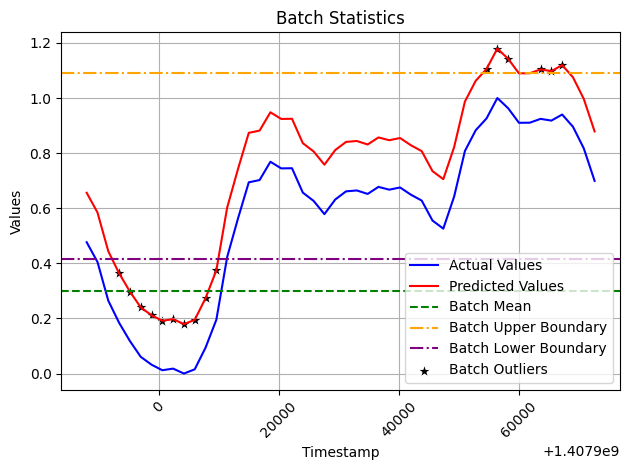


 Message Index: 45 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30901407915764434
Batch Mean Lower Bound w/ error rate: 0.38032713989439415
Batch Mean Upper Bound w/ error rate: 1.075608817999094


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1407974400          0.687671                  0.539849          14505   
1   1407976200          0.546490                  0.398668          11389   
2   1407978000          0.434805                  0.286983           8924   
3   1407979800          0.353749                  0.205926           7135   
4   1407981600          0.286420                  0.138598           5649   
5   1407983400          0.236355                  0.088532           4544   
6   1407985200          0.190956                  0.043134           3542   
7   1407987000          0.170295                  0.022473           3086   
8   1407988800          0.170522                  0.022699           3091   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


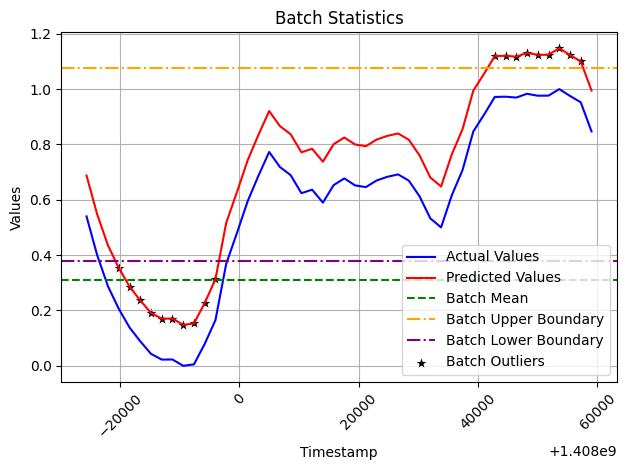


 Message Index: 46 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29112954870240887
Batch Mean Lower Bound w/ error rate: 0.4048334925241236
Batch Mean Upper Bound w/ error rate: 1.0598749771045437


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408060800          0.909441                  0.771791          19491   
1   1408062600          0.750479                  0.612829          16128   
2   1408064400          0.604704                  0.467054          13044   
3   1408066200          0.460064                  0.322414           9984   
4   1408068000          0.391148                  0.253498           8526   
5   1408069800          0.319442                  0.181792           7009   
6   1408071600          0.249297                  0.111647           5525   
7   1408073400          0.209734                  0.072084           4688   
8   1408075200          0.208646                  0.070996           4665   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


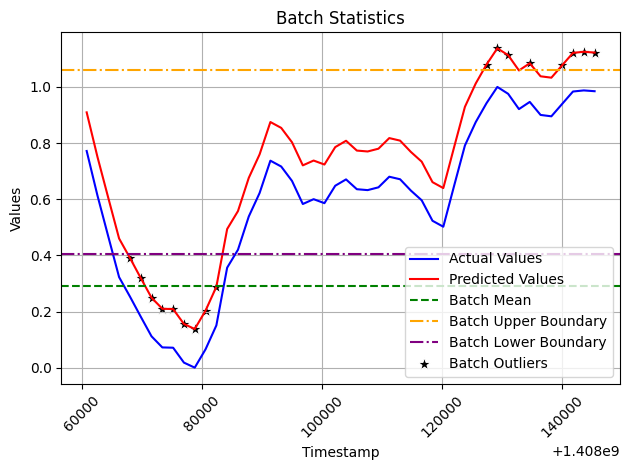


 Message Index: 47 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28982746711269386
Batch Mean Lower Bound w/ error rate: 0.29038217932149235
Batch Mean Upper Bound w/ error rate: 0.9424939803250535


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408147200          1.009505                  0.994285          23174   
1   1408149000          0.925823                  0.910603          21534   
2   1408150800          0.859796                  0.844576          20240   
3   1408152600          0.767644                  0.752424          18434   
4   1408154400          0.713965                  0.698745          17382   
5   1408156200          0.585789                  0.570568          14870   
6   1408158000          0.486340                  0.471120          12921   
7   1408159800          0.401484                  0.386264          11258   
8   1408161600          0.330610                  0.315389           9869   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


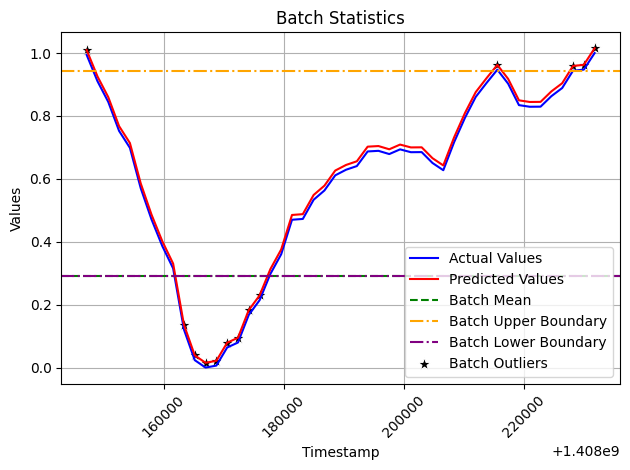


 Message Index: 48 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.25593796150054243
Batch Mean Lower Bound w/ error rate: -0.3267361643349676
Batch Mean Upper Bound w/ error rate: 0.24912424904125288


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408233600          0.430991                  1.000000          23263   
1   1408235400          0.385404                  0.954413          22356   
2   1408237200          0.279403                  0.848412          20247   
3   1408239000          0.229845                  0.798854          19261   
4   1408240800          0.183303                  0.752312          18335   
5   1408242600          0.059962                  0.628971          15881   
6   1408244400         -0.030760                  0.538249          14076   
7   1408246200         -0.124296                  0.444713          12215   
8   1408248000         -0.210897                  0.358112          10492   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


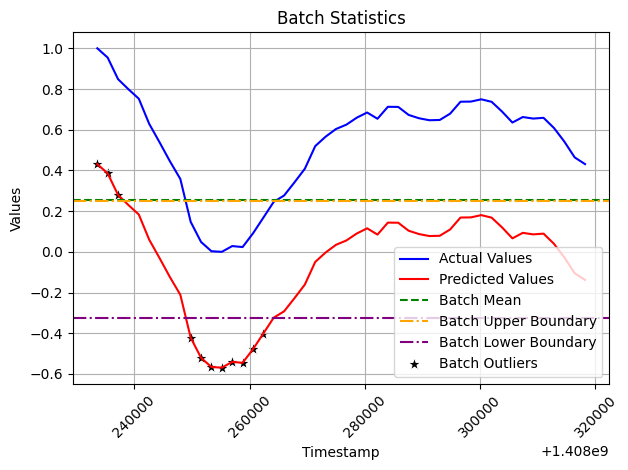


 Message Index: 49 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3052693988956453
Batch Mean Lower Bound w/ error rate: 0.3038963080449143
Batch Mean Upper Bound w/ error rate: 0.9907524555601163


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408320000          0.479749                  0.404864           9875   
1   1408321800          0.362540                  0.287656           7581   
2   1408323600          0.272309                  0.197425           5815   
3   1408325400          0.187954                  0.113070           4164   
4   1408327200          0.167159                  0.092275           3757   
5   1408329000          0.121482                  0.046597           2863   
6   1408330800          0.096395                  0.021510           2372   
7   1408332600          0.074885                  0.000000           1951   
8   1408334400          0.095424                  0.020540           2353   
9   1408

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


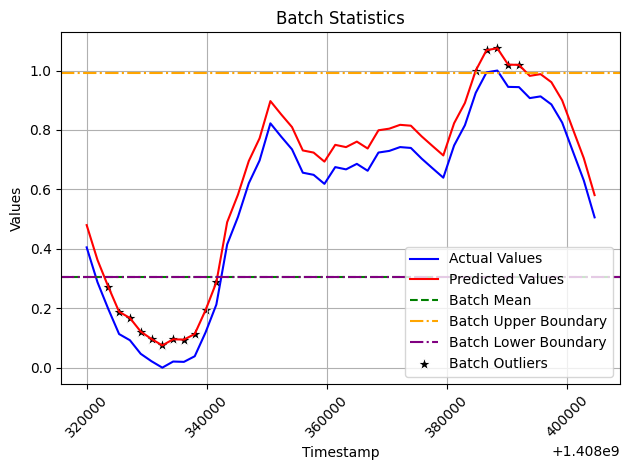


 Message Index: 50 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31073167400795837
Batch Mean Lower Bound w/ error rate: 0.3151586905726301
Batch Mean Upper Bound w/ error rate: 1.0143049570905365


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408406400          0.453222                  0.352452           9601   
1   1408408200          0.358135                  0.257365           7532   
2   1408410000          0.281569                  0.180799           5866   
3   1408411800          0.219479                  0.118709           4515   
4   1408413600          0.186022                  0.085252           3787   
5   1408415400          0.147417                  0.046647           2947   
6   1408417200          0.114787                  0.014017           2237   
7   1408419000          0.104906                  0.004136           2022   
8   1408420800          0.118280                  0.017510           2313   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


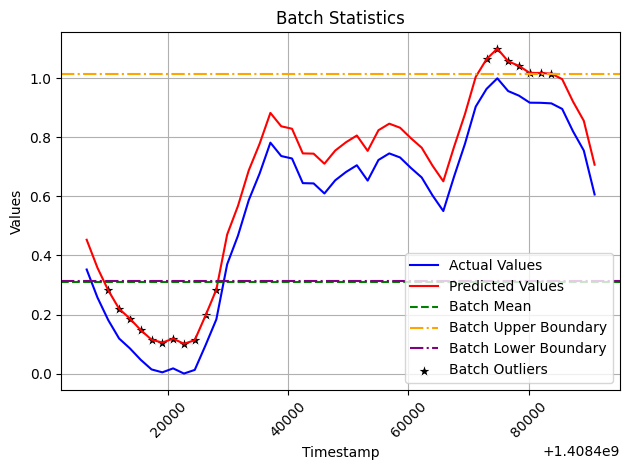


 Message Index: 51 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.308658611753457
Batch Mean Lower Bound w/ error rate: 0.2928960582449115
Batch Mean Upper Bound w/ error rate: 0.9873779346901898


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408492800          0.523125                  0.453787          12168   
1   1408494600          0.391804                  0.322466           9288   
2   1408496400          0.308680                  0.239342           7465   
3   1408498200          0.226194                  0.156856           5656   
4   1408500000          0.182283                  0.112945           4693   
5   1408501800          0.136731                  0.067393           3694   
6   1408503600          0.106318                  0.036980           3027   
7   1408505400          0.086255                  0.016917           2587   
8   1408507200          0.092912                  0.023574           2733   
9   14085

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


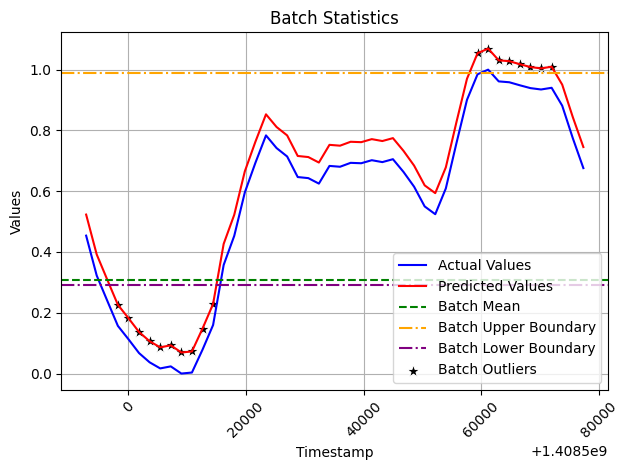


 Message Index: 52 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3025804205845352
Batch Mean Lower Bound w/ error rate: 0.4149264508962088
Batch Mean Upper Bound w/ error rate: 1.095732397211413


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408579200          0.717639                  0.508296          14569   
1   1408581000          0.580541                  0.371198          11396   
2   1408582800          0.464873                  0.255531           8719   
3   1408584600          0.378372                  0.169029           6717   
4   1408586400          0.321899                  0.112556           5410   
5   1408588200          0.280765                  0.071422           4458   
6   1408590000          0.248143                  0.038801           3703   
7   1408591800          0.224941                  0.015598           3166   
8   1408593600          0.228830                  0.019487           3256   
9   14085

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


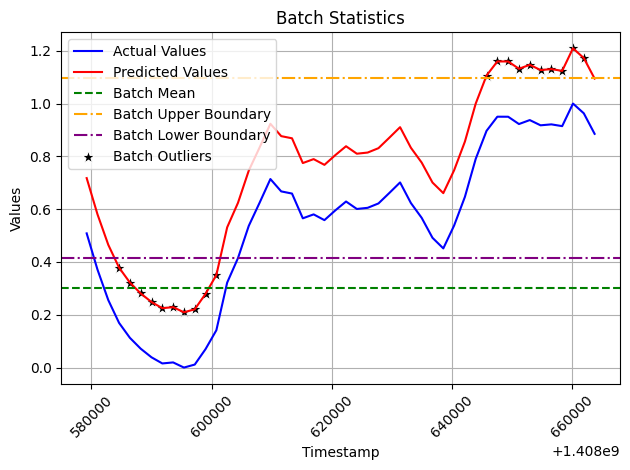


 Message Index: 53 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28855580003397224
Batch Mean Lower Bound w/ error rate: 0.387784506788076
Batch Mean Upper Bound w/ error rate: 1.0370350568645135


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408665600          0.999524                  0.884850          20552   
1   1408667400          0.784945                  0.670271          16266   
2   1408669200          0.639706                  0.525033          13365   
3   1408671000          0.485606                  0.370932          10287   
4   1408672800          0.366150                  0.251477           7901   
5   1408674600          0.282742                  0.168068           6235   
6   1408676400          0.214353                  0.099680           4869   
7   1408678200          0.170596                  0.055923           3995   
8   1408680000          0.157529                  0.042856           3734   
9   1408

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


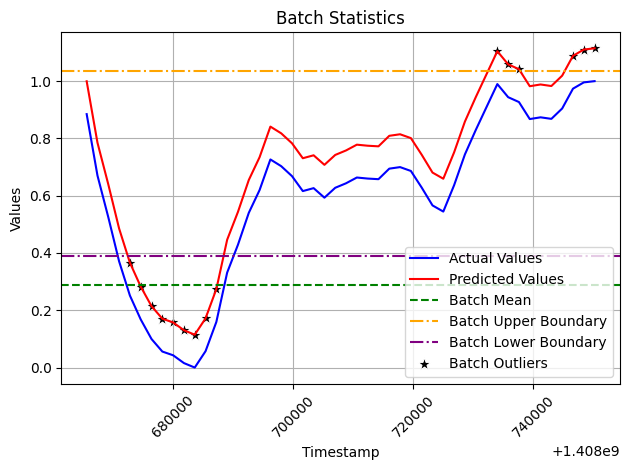


 Message Index: 54 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28436594902749274
Batch Mean Lower Bound w/ error rate: 0.20899781596031952
Batch Mean Upper Bound w/ error rate: 0.8488212012721782


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408752000          0.922828                  0.963558          22726   
1   1408753800          0.840720                  0.881450          21079   
2   1408755600          0.745351                  0.786081          19166   
3   1408757400          0.673214                  0.713944          17719   
4   1408759200          0.610998                  0.651727          16471   
5   1408761000          0.495688                  0.536418          14158   
6   1408762800          0.424498                  0.465228          12730   
7   1408764600          0.337455                  0.378184          10984   
8   1408766400          0.258936                  0.299666           9409   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


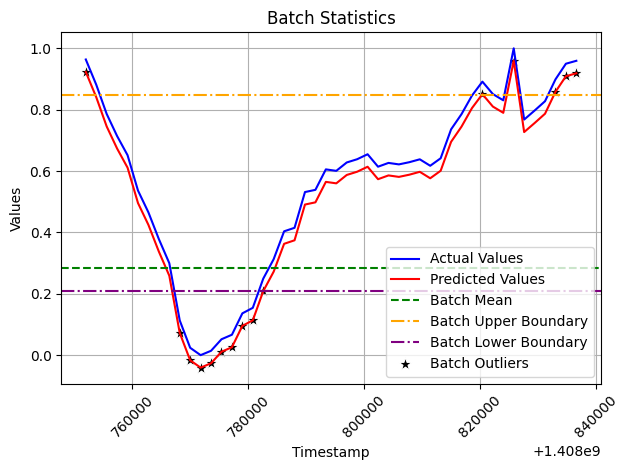


 Message Index: 55 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.25360020966903596
Batch Mean Lower Bound w/ error rate: -0.2654037222595058
Batch Mean Upper Bound w/ error rate: 0.3051967494958251


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408838400          0.494681                  1.000000          22666   
1   1408840200          0.431997                  0.937316          21430   
2   1408842000          0.360235                  0.865554          20015   
3   1408843800          0.298160                  0.803479          18791   
4   1408845600          0.241967                  0.747287          17683   
5   1408847400          0.147992                  0.653312          15830   
6   1408849200          0.048185                  0.553504          13862   
7   1408851000         -0.048224                  0.457095          11961   
8   1408852800         -0.139917                  0.365402          10153   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


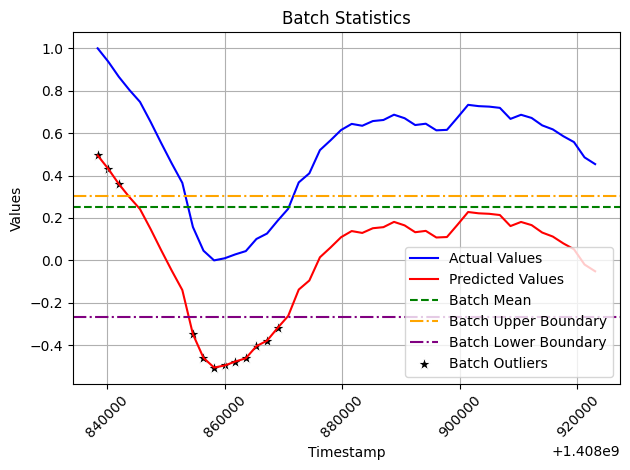


 Message Index: 56 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3067409051019291
Batch Mean Lower Bound w/ error rate: 0.24608429751180694
Batch Mean Upper Bound w/ error rate: 0.9362513339911473


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1408924800          0.412677                  0.383052           9192   
1   1408926600          0.289703                  0.260079           6886   
2   1408928400          0.183155                  0.153530           4888   
3   1408930200          0.143159                  0.113535           4138   
4   1408932000          0.101990                  0.072366           3366   
5   1408933800          0.066367                  0.036743           2698   
6   1408935600          0.044609                  0.014985           2290   
7   1408937400          0.029624                  0.000000           2009   
8   1408939200          0.043276                  0.013652           2265   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


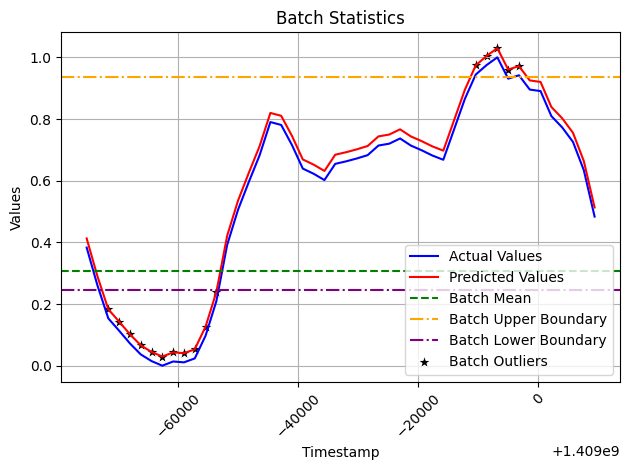


 Message Index: 57 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3128883142458002
Batch Mean Lower Bound w/ error rate: 0.3635054490936014
Batch Mean Upper Bound w/ error rate: 1.0675041561466518


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409011200          0.523139                  0.375628           9618   
1   1409013000          0.406011                  0.258501           7193   
2   1409014800          0.332209                  0.184699           5665   
3   1409016600          0.258987                  0.111476           4149   
4   1409018400          0.227737                  0.080226           3502   
5   1409020200          0.185812                  0.038302           2634   
6   1409022000          0.160020                  0.012510           2100   
7   1409023800          0.154466                  0.006955           1985   
8   1409025600          0.157750                  0.010240           2053   
9   1409

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


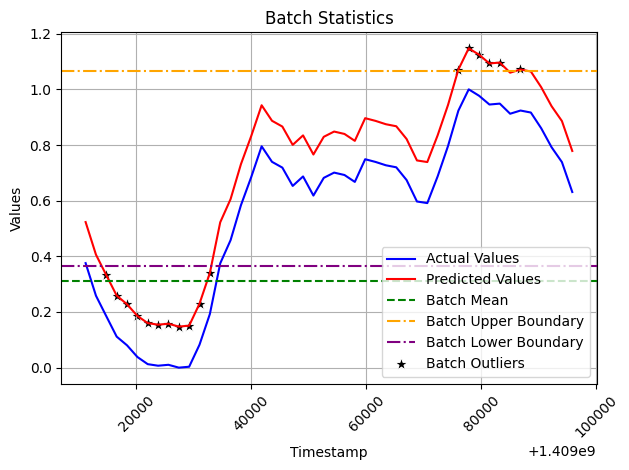


 Message Index: 58 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3048288414238764
Batch Mean Lower Bound w/ error rate: 0.20692830251219585
Batch Mean Upper Bound w/ error rate: 0.8927931957159178


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409097600          0.423740                  0.430608          11703   
1   1409099400          0.281559                  0.288427           8521   
2   1409101200          0.211899                  0.218767           6962   
3   1409103000          0.144383                  0.151251           5451   
4   1409104800          0.099164                  0.106032           4439   
5   1409106600          0.054348                  0.061215           3436   
6   1409108400          0.023293                  0.030161           2741   
7   1409110200          0.004080                  0.010947           2311   
8   1409112000          0.013954                  0.020822           2532   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


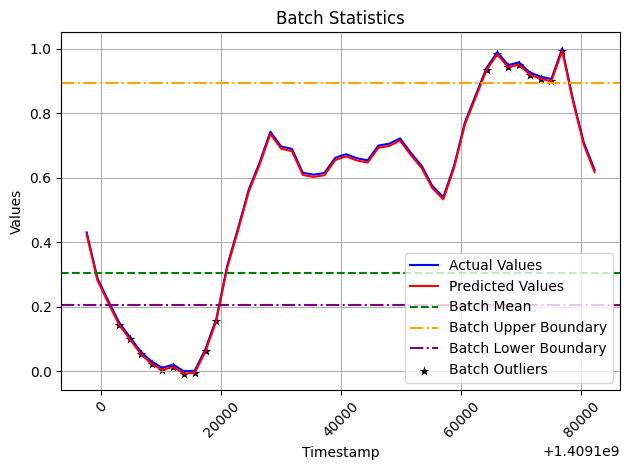


 Message Index: 59 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31371870656825046
Batch Mean Lower Bound w/ error rate: 0.4338934249447455
Batch Mean Upper Bound w/ error rate: 1.139760514723309


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409184000          0.740887                  0.548263          13547   
1   1409185800          0.586444                  0.393820          10363   
2   1409187600          0.498648                  0.306024           8553   
3   1409189400          0.396979                  0.204356           6457   
4   1409191200          0.338335                  0.145712           5248   
5   1409193000          0.271931                  0.079307           3879   
6   1409194800          0.237685                  0.045062           3173   
7   1409196600          0.212462                  0.019839           2653   
8   1409198400          0.222406                  0.029783           2858   
9   1409

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


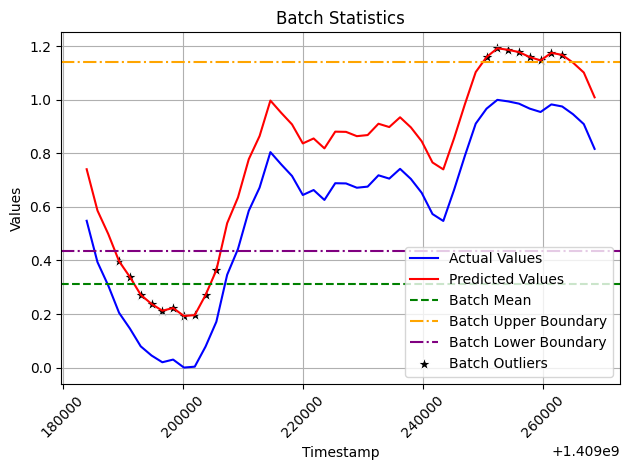


 Message Index: 60 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28917711618818365
Batch Mean Lower Bound w/ error rate: 0.4327167165650882
Batch Mean Upper Bound w/ error rate: 1.0833652279885013


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409270400          0.869187                  0.718734          16702   
1   1409272200          0.727010                  0.576557          13985   
2   1409274000          0.603881                  0.453428          11632   
3   1409275800          0.513248                  0.362794           9900   
4   1409277600          0.437005                  0.286552           8443   
5   1409279400          0.337737                  0.187284           6546   
6   1409281200          0.270966                  0.120513           5270   
7   1409283000          0.231772                  0.081319           4521   
8   1409284800          0.223818                  0.073365           4369   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


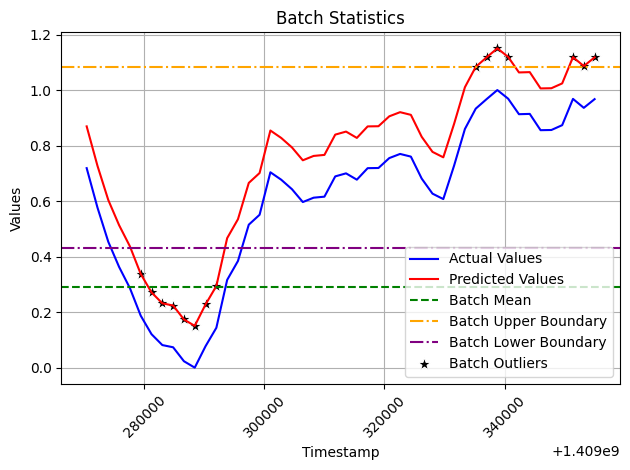


 Message Index: 61 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.295839343980598
Batch Mean Lower Bound w/ error rate: 0.2776461898193604
Batch Mean Upper Bound w/ error rate: 0.943284713775706


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409356800          0.991900                  1.000000          20564   
1   1409358600          0.917041                  0.925141          19267   
2   1409360400          0.811535                  0.819635          17439   
3   1409362200          0.661991                  0.670091          14848   
4   1409364000          0.607275                  0.615376          13900   
5   1409365800          0.539805                  0.547905          12731   
6   1409367600          0.426968                  0.435069          10776   
7   1409369400          0.356208                  0.364308           9550   
8   1409371200          0.301665                  0.309766           8605   
9   140937

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


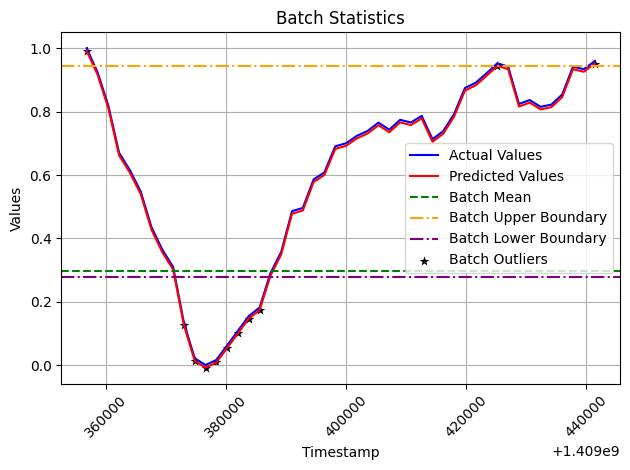


 Message Index: 62 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3069673005653253
Batch Mean Lower Bound w/ error rate: 0.09875887313671716
Batch Mean Upper Bound w/ error rate: 0.789435299408699


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409443200          0.819299                  1.000000          19205   
1   1409445000          0.755152                  0.935853          18139   
2   1409446800          0.667716                  0.848417          16686   
3   1409448600          0.556692                  0.737393          14841   
4   1409450400          0.507168                  0.687869          14018   
5   1409452200          0.396986                  0.577687          12187   
6   1409454000          0.297636                  0.478337          10536   
7   1409455800          0.240770                  0.421471           9591   
8   1409457600          0.185047                  0.365748           8665   
9   1409

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


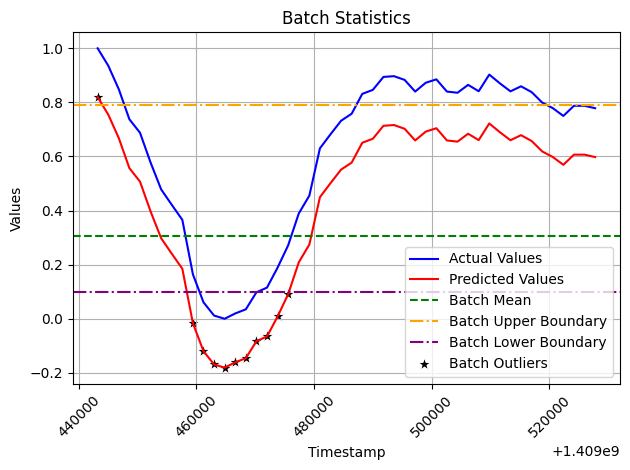


 Message Index: 63 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.33802473355871865
Batch Mean Lower Bound w/ error rate: -0.11544406490961906
Batch Mean Upper Bound w/ error rate: 0.6451115855974978


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409529600          0.467968                  0.787952          14618   
1   1409531400          0.353257                  0.673241          12908   
2   1409533200          0.214664                  0.534648          10842   
3   1409535000          0.107735                  0.427719           9248   
4   1409536800          0.063460                  0.383444           8588   
5   1409538600         -0.000738                  0.319246           7631   
6   1409540400         -0.075334                  0.244650           6519   
7   1409542200         -0.133159                  0.186825           5657   
8   1409544000         -0.162876                  0.157107           5214   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


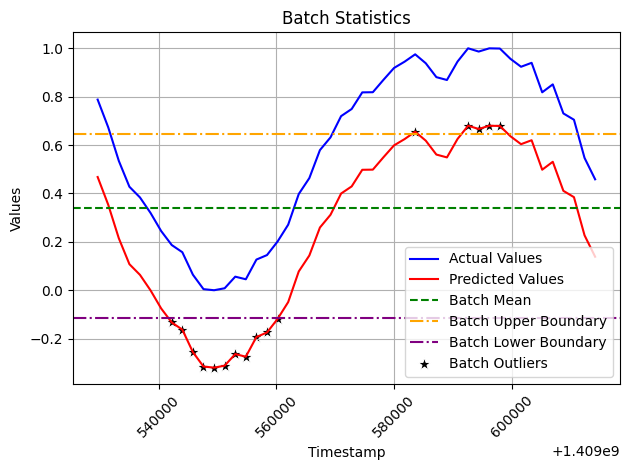


 Message Index: 64 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31671334773567605
Batch Mean Lower Bound w/ error rate: 0.3016432008426254
Batch Mean Upper Bound w/ error rate: 1.0142482332478964


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409616000          0.376606                  0.305984           8043   
1   1409617800          0.264939                  0.194317           5630   
2   1409619600          0.205566                  0.134944           4347   
3   1409621400          0.171274                  0.100653           3606   
4   1409623200          0.124164                  0.053543           2588   
5   1409625000          0.095519                  0.024897           1969   
6   1409626800          0.091215                  0.020593           1876   
7   1409628600          0.070622                  0.000000           1431   
8   1409630400          0.085477                  0.014855           1752   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


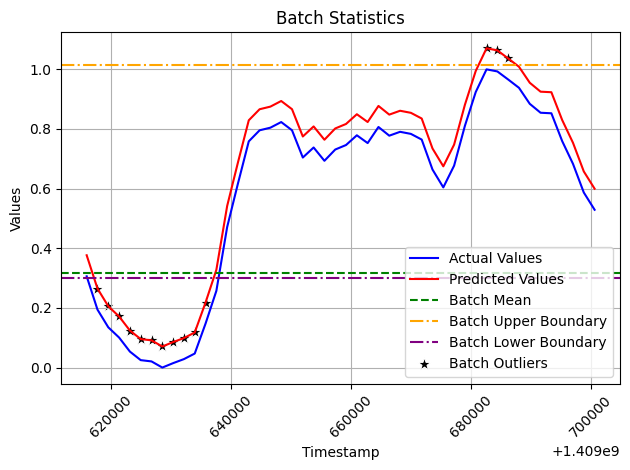


 Message Index: 65 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31949734830520093
Batch Mean Lower Bound w/ error rate: 0.3087278181972052
Batch Mean Upper Bound w/ error rate: 1.0275968518839074


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409702400          0.457269                  0.379286          10465   
1   1409704200          0.357597                  0.279614           8215   
2   1409706000          0.280783                  0.202800           6481   
3   1409707800          0.182617                  0.104634           4265   
4   1409709600          0.145804                  0.067821           3434   
5   1409711400          0.114441                  0.036458           2726   
6   1409713200          0.098139                  0.020156           2358   
7   1409715000          0.083122                  0.005139           2019   
8   1409716800          0.088349                  0.010366           2137   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


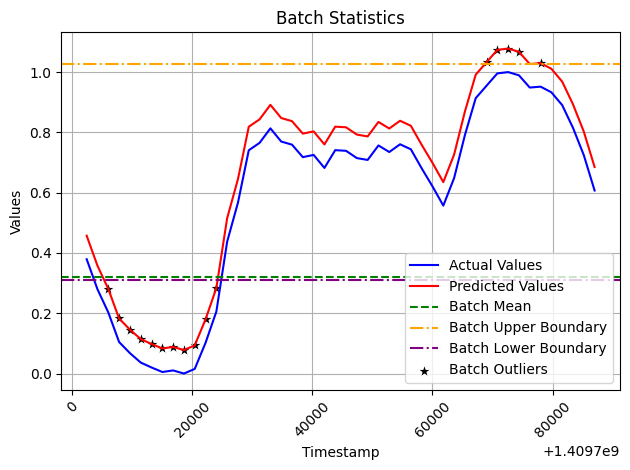


 Message Index: 66 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3100314930747507
Batch Mean Lower Bound w/ error rate: 0.44527159941657946
Batch Mean Upper Bound w/ error rate: 1.1428424588347685


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409788800          0.657080                  0.449737          12990   
1   1409790600          0.542559                  0.335216          10273   
2   1409792400          0.465046                  0.257703           8434   
3   1409794200          0.378386                  0.171043           6378   
4   1409796000          0.343444                  0.136101           5549   
5   1409797800          0.283676                  0.076333           4131   
6   1409799600          0.246163                  0.038820           3241   
7   1409801400          0.211136                  0.003793           2410   
8   1409803200          0.227743                  0.020400           2804   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


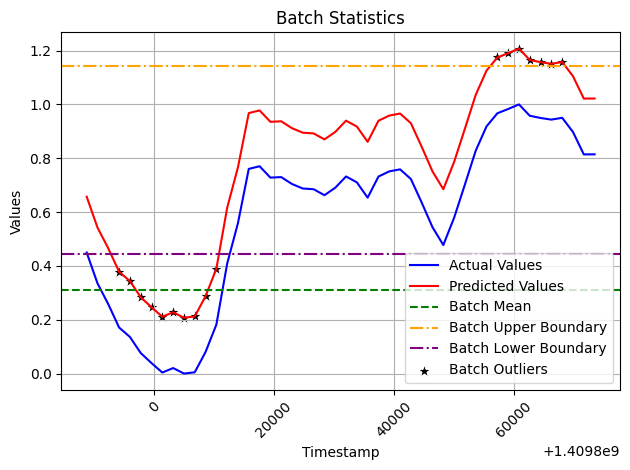


 Message Index: 67 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2963543558679571
Batch Mean Lower Bound w/ error rate: 0.42117962313556034
Batch Mean Upper Bound w/ error rate: 1.0879769238384638


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409875200          0.819665                  0.657590          18962   
1   1409877000          0.677100                  0.515025          15475   
2   1409878800          0.533186                  0.371111          11955   
3   1409880600          0.426231                  0.264156           9339   
4   1409882400          0.370137                  0.208062           7967   
5   1409884200          0.304926                  0.142851           6372   
6   1409886000          0.254229                  0.092154           5132   
7   1409887800          0.222543                  0.060469           4357   
8   1409889600          0.220417                  0.058343           4305   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


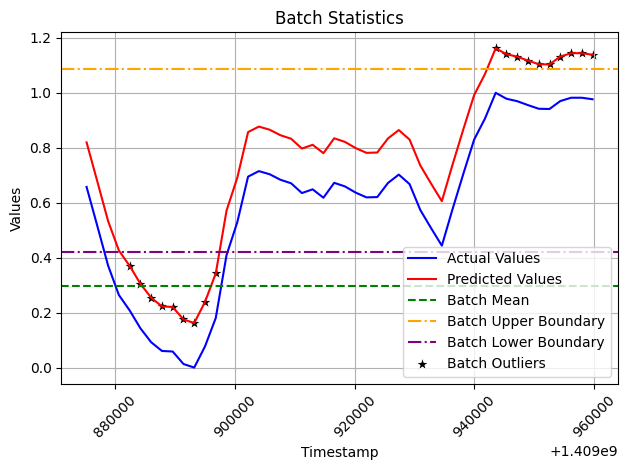


 Message Index: 68 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.26952252282718475
Batch Mean Lower Bound w/ error rate: 0.20053299127370128
Batch Mean Upper Bound w/ error rate: 0.806958667634867


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1409961600          0.778380                  0.826223          25721   
1   1409963400          0.736131                  0.783975          24590   
2   1409965200          0.643789                  0.691632          22118   
3   1409967000          0.578791                  0.626634          20378   
4   1409968800          0.530789                  0.578633          19093   
5   1409970600          0.442033                  0.489877          16717   
6   1409972400          0.342145                  0.389989          14043   
7   1409974200          0.268705                  0.316548          12077   
8   1409976000          0.199038                  0.246881          10212   
9   140

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


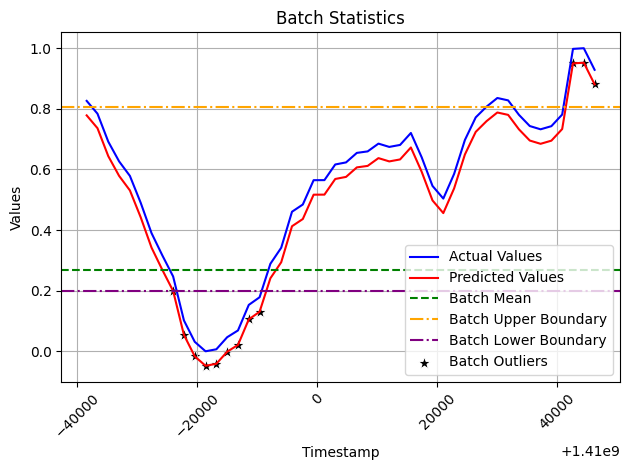


 Message Index: 69 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2699727740496756
Batch Mean Lower Bound w/ error rate: -0.26545684895953364
Batch Mean Upper Bound w/ error rate: 0.3419818926522365


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410048000          0.470727                  1.000000          25818   
1   1410049800          0.418377                  0.947650          24635   
2   1410051600          0.364169                  0.893442          23410   
3   1410053400          0.278807                  0.808080          21481   
4   1410055200          0.204420                  0.733693          19800   
5   1410057000          0.110341                  0.639614          17674   
6   1410058800          0.001526                  0.530799          15215   
7   1410060600         -0.074321                  0.454952          13501   
8   1410062400         -0.189597                  0.339676          10896   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


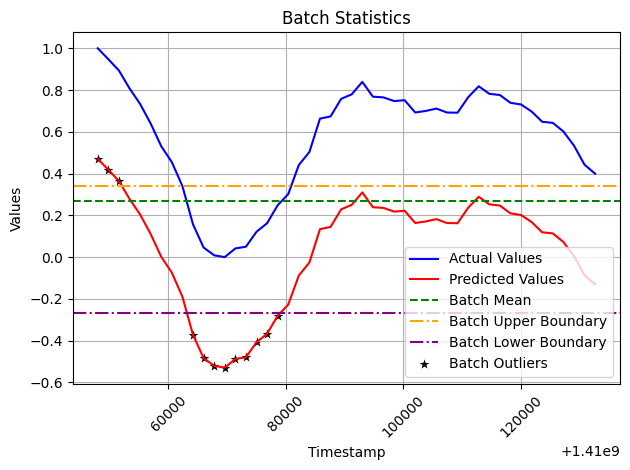


 Message Index: 70 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.311373906141447
Batch Mean Lower Bound w/ error rate: 0.28695053116206237
Batch Mean Upper Bound w/ error rate: 0.9875418199803181


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410134400          0.405913                  0.333303           9733   
1   1410136200          0.307295                  0.234685           7542   
2   1410138000          0.216194                  0.143584           5518   
3   1410139800          0.163531                  0.090921           4348   
4   1410141600          0.140126                  0.067516           3828   
5   1410143400          0.106593                  0.033983           3083   
6   1410145200          0.084088                  0.011478           2583   
7   1410147000          0.072610                  0.000000           2328   
8   1410148800          0.081387                  0.008777           2523   
9   1410

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


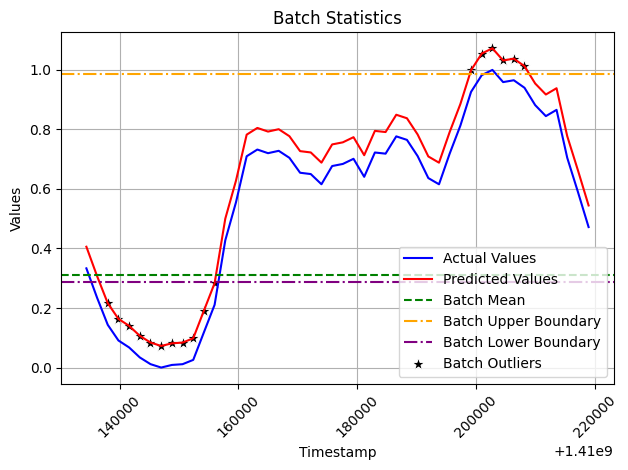


 Message Index: 71 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.321935725351559
Batch Mean Lower Bound w/ error rate: 0.36218316200900513
Batch Mean Upper Bound w/ error rate: 1.086538544050013


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410220800          0.501921                  0.359843          10436   
1   1410222600          0.398415                  0.256337           8092   
2   1410224400          0.308730                  0.166652           6061   
3   1410226200          0.264440                  0.122362           5058   
4   1410228000          0.220944                  0.078866           4073   
5   1410229800          0.187252                  0.045174           3310   
6   1410231600          0.156915                  0.014837           2623   
7   1410233400          0.145478                  0.003400           2364   
8   1410235200          0.144109                  0.002031           2333   
9   14102

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


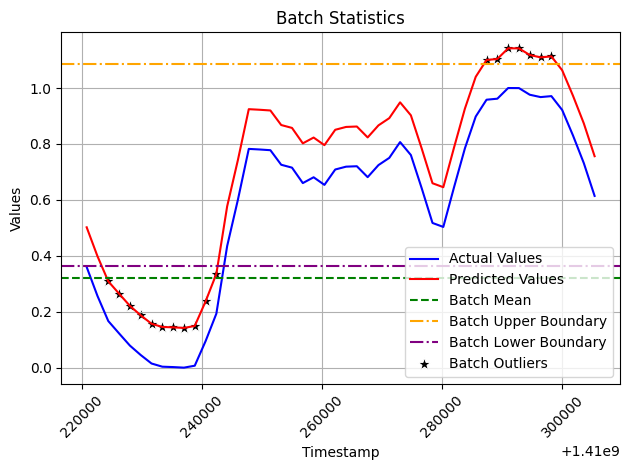


 Message Index: 72 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30410913444755794
Batch Mean Lower Bound w/ error rate: 0.288498482466276
Batch Mean Upper Bound w/ error rate: 0.9727440349732814


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410307200          0.511984                  0.456954          13226   
1   1410309000          0.370671                  0.315641           9866   
2   1410310800          0.295767                  0.240737           8085   
3   1410312600          0.215521                  0.160491           6177   
4   1410314400          0.179646                  0.124616           5324   
5   1410316200          0.131406                  0.076376           4177   
6   1410318000          0.101419                  0.046389           3464   
7   1410319800          0.075806                  0.020776           2855   
8   1410321600          0.075596                  0.020566           2850   
9   1410

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


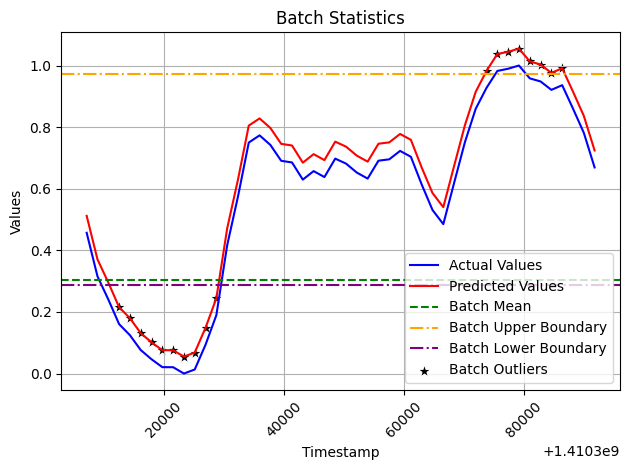


 Message Index: 73 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30484226377370777
Batch Mean Lower Bound w/ error rate: 0.3039396412251671
Batch Mean Upper Bound w/ error rate: 0.9898347347160095


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410393600          0.583222                  0.516898          14939   
1   1410395400          0.432168                  0.365844          11332   
2   1410397200          0.329903                  0.263579           8890   
3   1410399000          0.249916                  0.183592           6980   
4   1410400800          0.194596                  0.128272           5659   
5   1410402600          0.153555                  0.087231           4679   
6   1410404400          0.106275                  0.039951           3550   
7   1410406200          0.073234                  0.006910           2761   
8   1410408000          0.083619                  0.017296           3009   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


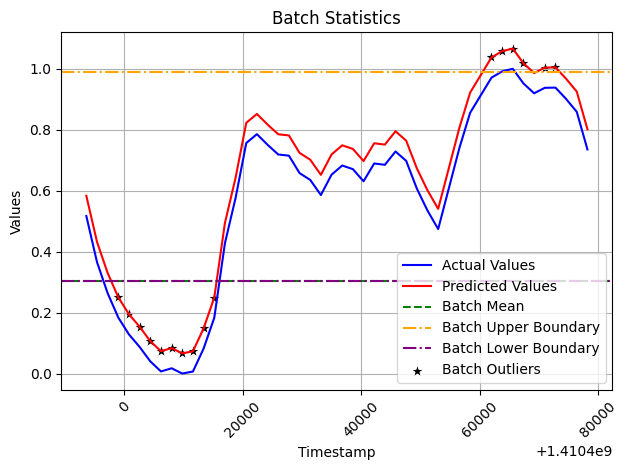


 Message Index: 74 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29735187074320363
Batch Mean Lower Bound w/ error rate: 0.496781109282543
Batch Mean Upper Bound w/ error rate: 1.1658228184547512


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410480000          0.871527                  0.610907          17954   
1   1410481800          0.727532                  0.466912          14466   
2   1410483600          0.610536                  0.349915          11632   
3   1410485400          0.518392                  0.257772           9400   
4   1410487200          0.452999                  0.192379           7816   
5   1410489000          0.406019                  0.145399           6678   
6   1410490800          0.357346                  0.096726           5499   
7   1410492600          0.299096                  0.038476           4088   
8   1410494400          0.308343                  0.047723           4312   
9   1410

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


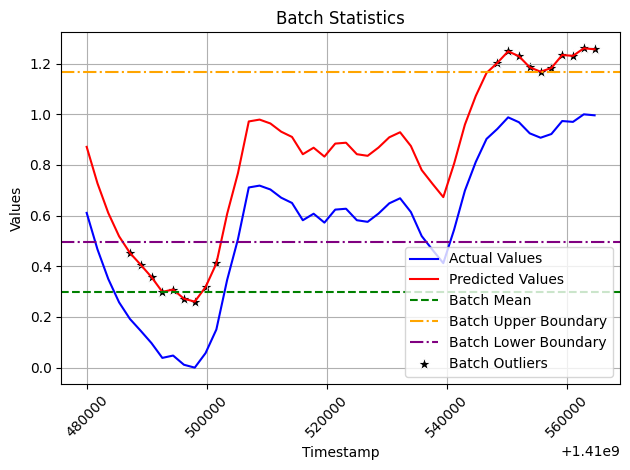


 Message Index: 75 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2991518277754076
Batch Mean Lower Bound w/ error rate: 0.2935063403234127
Batch Mean Upper Bound w/ error rate: 0.9665979528180798


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410566400          0.948832                  0.944910          26227   
1   1410568200          0.886704                  0.882782          24744   
2   1410570000          0.826377                  0.822455          23304   
3   1410571800          0.742129                  0.738207          21293   
4   1410573600          0.682514                  0.678592          19870   
5   1410575400          0.589804                  0.585882          17657   
6   1410577200          0.482682                  0.478760          15100   
7   1410579000          0.391857                  0.387935          12932   
8   1410580800          0.293071                  0.289150          10574   
9   1410

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


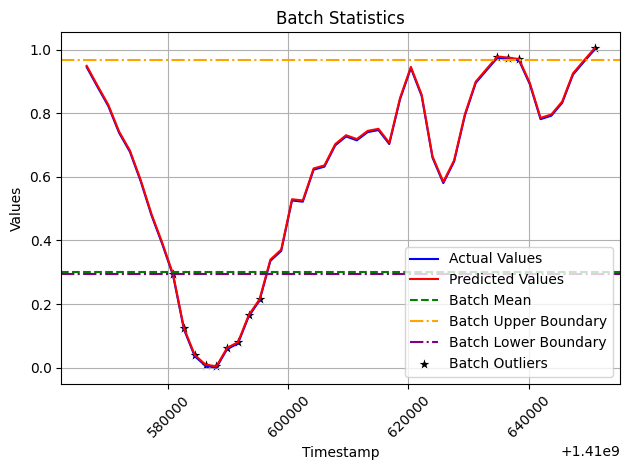


 Message Index: 76 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2554004655368547
Batch Mean Lower Bound w/ error rate: -0.4478365684129179
Batch Mean Upper Bound w/ error rate: 0.12681447904500515


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410652800      3.056164e-01                  1.000000          27320   
1   1410654600      2.343382e-01                  0.928722          25627   
2   1410656400      1.643230e-01                  0.858707          23964   
3   1410658200      9.561300e-02                  0.789997          22332   
4   1410660000      2.353486e-02                  0.717918          20620   
5   1410661800     -6.289997e-02                  0.631484          18567   
6   1410663600     -1.805743e-01                  0.513809          15772   
7   1410665400     -2.827130e-01                  0.411671          13346   
8   1410667200     -3.555490e-01                  0.338835          11616   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


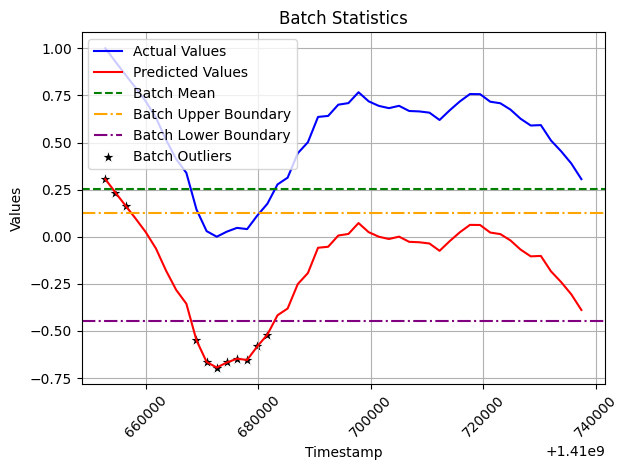


 Message Index: 77 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31151625485325
Batch Mean Lower Bound w/ error rate: 0.36595595036722983
Batch Mean Upper Bound w/ error rate: 1.0668675237870424


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410739200          0.434696                  0.273726           8077   
1   1410741000          0.354275                  0.193304           6261   
2   1410742800          0.286209                  0.125238           4724   
3   1410744600          0.247592                  0.086621           3852   
4   1410746400          0.215707                  0.054736           3132   
5   1410748200          0.192413                  0.031442           2606   
6   1410750000          0.164469                  0.003499           1975   
7   1410751800          0.160971                  0.000000           1896   
8   1410753600          0.179305                  0.018334           2310   
9   14107

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


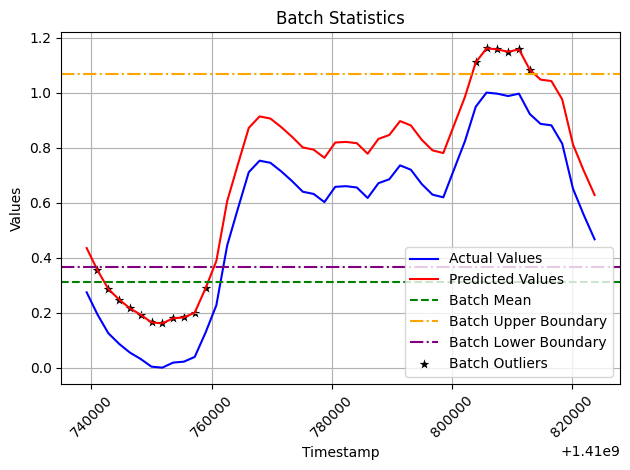


 Message Index: 78 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.32250826391047743
Batch Mean Lower Bound w/ error rate: 0.26613138415302634
Batch Mean Upper Bound w/ error rate: 0.9917749779516005


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410825600          0.374230                  0.320507           9359   
1   1410827400          0.283830                  0.230107           7247   
2   1410829200          0.215860                  0.162137           5659   
3   1410831000          0.151484                  0.097761           4155   
4   1410832800          0.117841                  0.064118           3369   
5   1410834600          0.085654                  0.031931           2617   
6   1410836400          0.068404                  0.014681           2214   
7   1410838200          0.053723                  0.000000           1871   
8   1410840000          0.063568                  0.009845           2101   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


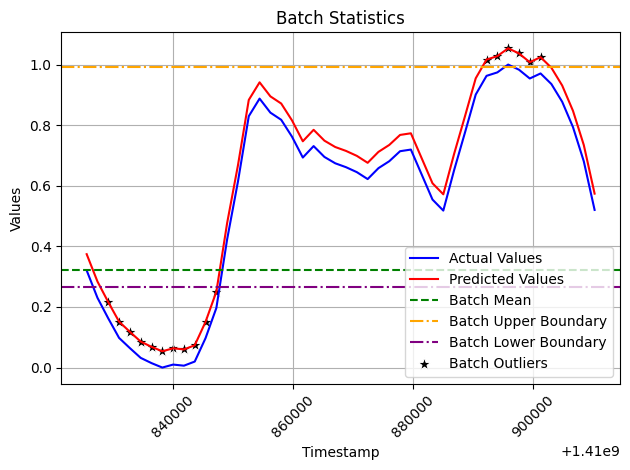


 Message Index: 79 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30799867783955376
Batch Mean Lower Bound w/ error rate: 0.349699131107393
Batch Mean Upper Bound w/ error rate: 1.042696156246389


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410912000          0.531754                  0.397395          11590   
1   1410913800          0.398528                  0.264168           8440   
2   1410915600          0.332591                  0.198232           6881   
3   1410917400          0.249653                  0.115294           4920   
4   1410919200          0.214845                  0.080486           4097   
5   1410921000          0.175173                  0.040814           3159   
6   1410922800          0.153772                  0.019413           2653   
7   1410924600          0.140830                  0.006471           2347   
8   1410926400          0.142522                  0.008163           2387   
9   14109

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


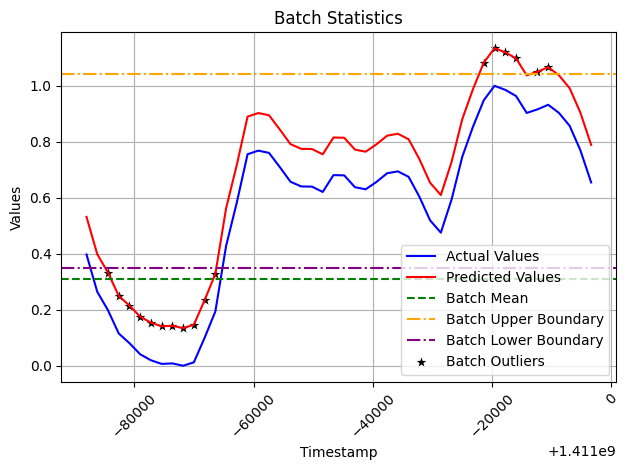


 Message Index: 80 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31117126679937157
Batch Mean Lower Bound w/ error rate: 0.4013784612995712
Batch Mean Upper Bound w/ error rate: 1.1015138115981573


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1410998400          0.650355                  0.474964          13651   
1   1411000200          0.527852                  0.352461          10769   
2   1411002000          0.414488                  0.239097           8102   
3   1411003800          0.333472                  0.158080           6196   
4   1411005600          0.293218                  0.117827           5249   
5   1411007400          0.233752                  0.058361           3850   
6   1411009200          0.203998                  0.028607           3150   
7   1411011000          0.179939                  0.004548           2584   
8   1411012800          0.187845                  0.012454           2770   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


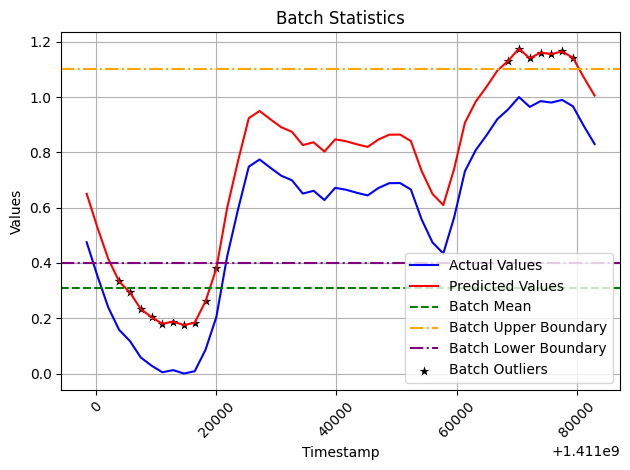


 Message Index: 81 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29354334207747634
Batch Mean Lower Bound w/ error rate: 0.3687208728084935
Batch Mean Upper Bound w/ error rate: 1.0291933924828154


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411084800          0.800122                  0.665615          19518   
1   1411086600          0.645976                  0.511470          15755   
2   1411088400          0.522758                  0.388252          12747   
3   1411090200          0.414983                  0.280477          10116   
4   1411092000          0.343830                  0.209323           8379   
5   1411093800          0.269563                  0.135057           6566   
6   1411095600          0.224995                  0.090488           5478   
7   1411097400          0.187062                  0.052556           4552   
8   1411099200          0.186817                  0.052310           4546   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


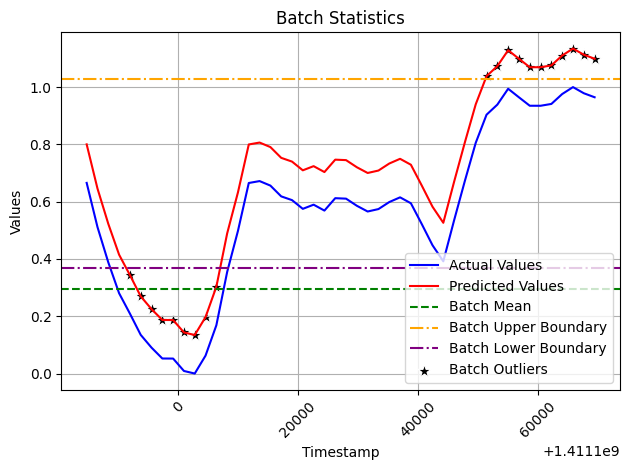


 Message Index: 82 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29507008720142847
Batch Mean Lower Bound w/ error rate: 0.3306237170465043
Batch Mean Upper Bound w/ error rate: 0.9945314132497183


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411171200          0.976468                  0.941034          25251   
1   1411173000          0.895546                  0.860113          23375   
2   1411174800          0.827868                  0.792434          21806   
3   1411176600          0.777356                  0.741923          20635   
4   1411178400          0.720720                  0.685287          19322   
5   1411180200          0.613702                  0.578269          16841   
6   1411182000          0.523248                  0.487814          14744   
7   1411183800          0.418214                  0.382780          12309   
8   1411185600          0.329054                  0.293620          10242   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


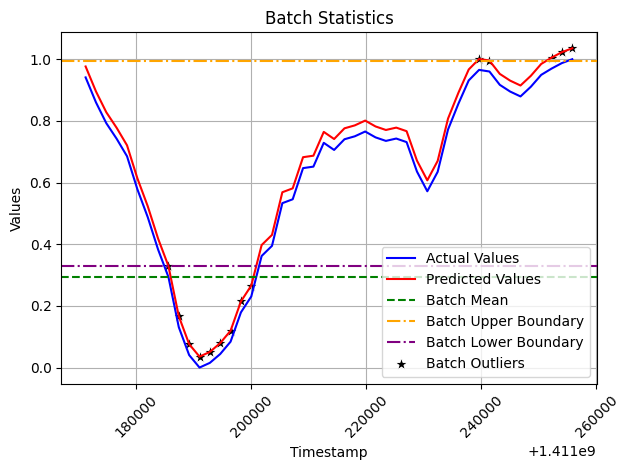


 Message Index: 83 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.23525192030791942
Batch Mean Lower Bound w/ error rate: -0.4670686032198027
Batch Mean Upper Bound w/ error rate: 0.06224821747301598


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411257600          0.319610                  1.000000          26477   
1   1411259400          0.275442                  0.955832          25461   
2   1411261200          0.271530                  0.951919          25371   
3   1411263000          0.113072                  0.793462          21726   
4   1411264800          0.070078                  0.750467          20737   
5   1411266600         -0.011868                  0.668521          18852   
6   1411268400         -0.115246                  0.565144          16474   
7   1411270200         -0.238143                  0.442247          13647   
8   1411272000         -0.318741                  0.361648          11793   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


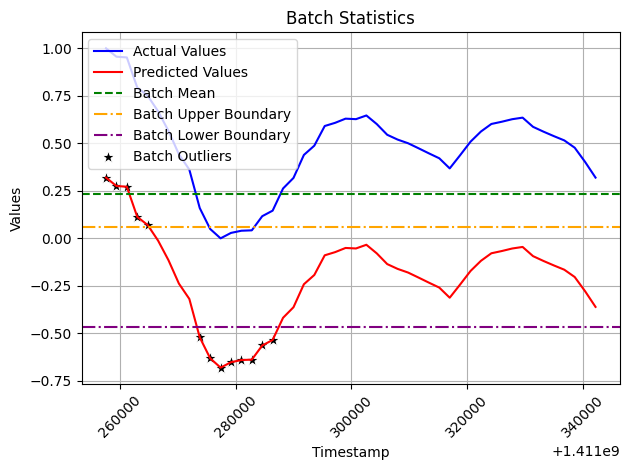


 Message Index: 84 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3071622035750483
Batch Mean Lower Bound w/ error rate: 0.4579100490637925
Batch Mean Upper Bound w/ error rate: 1.1490250071076513


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411344000          0.586888                  0.340650           9067   
1   1411345800          0.466070                  0.219831           6546   
2   1411347600          0.371849                  0.125611           4580   
3   1411349400          0.327471                  0.081233           3654   
4   1411351200          0.302694                  0.056455           3137   
5   1411353000          0.277437                  0.031199           2610   
6   1411354800          0.251127                  0.004888           2061   
7   1411356600          0.246238                  0.000000           1959   
8   1411358400          0.265264                  0.019026           2356   
9   1411

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


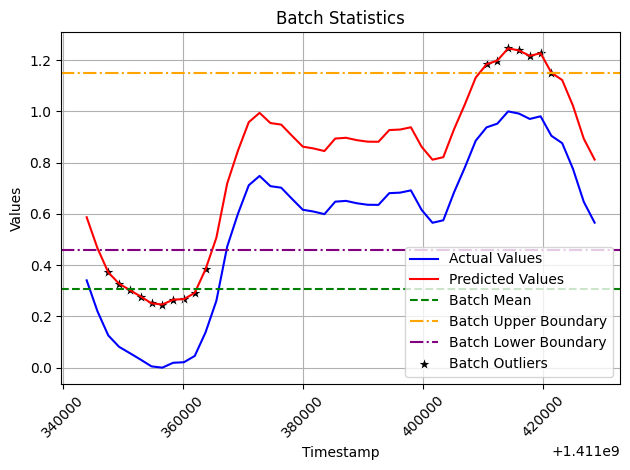


 Message Index: 85 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29771636387168504
Batch Mean Lower Bound w/ error rate: 0.2638606454279207
Batch Mean Upper Bound w/ error rate: 0.9337224641392121


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411430400          0.482532                  0.426194          11187   
1   1411432200          0.380648                  0.324309           8959   
2   1411434000          0.295684                  0.239345           7101   
3   1411435800          0.186346                  0.130007           4710   
4   1411437600          0.134261                  0.077922           3571   
5   1411439400          0.097403                  0.041065           2765   
6   1411441200          0.067039                  0.010701           2101   
7   1411443000          0.056339                  0.000000           1867   
8   1411444800          0.068183                  0.011844           2126   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


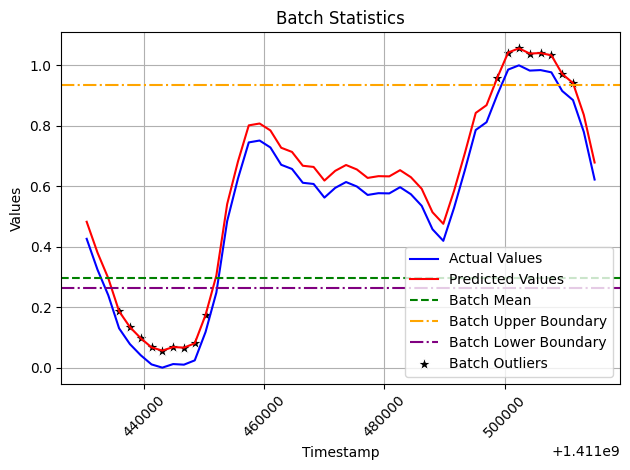


 Message Index: 86 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3066409662407581
Batch Mean Lower Bound w/ error rate: 0.2762470893641523
Batch Mean Upper Bound w/ error rate: 0.9661892634058581


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411516800          0.529767                  0.493163          12457   
1   1411518600          0.386751                  0.350147           9497   
2   1411520400          0.269632                  0.233029           7073   
3   1411522200          0.193438                  0.156834           5496   
4   1411524000          0.144204                  0.107600           4477   
5   1411525800          0.098303                  0.061700           3527   
6   1411527600          0.071439                  0.034836           2971   
7   1411529400          0.056413                  0.019810           2660   
8   1411531200          0.048538                  0.011934           2497   
9   1411

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


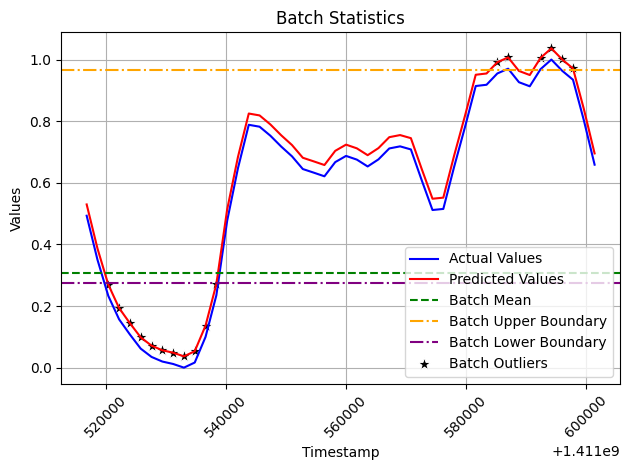


 Message Index: 87 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31192547171552065
Batch Mean Lower Bound w/ error rate: 0.41366052775405227
Batch Mean Upper Bound w/ error rate: 1.1154928391139736


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411603200          0.655819                  0.475555          12556   
1   1411605000          0.536860                  0.356596          10023   
2   1411606800          0.409917                  0.229653           7320   
3   1411608600          0.348253                  0.167989           6007   
4   1411610400          0.295607                  0.115343           4886   
5   1411612200          0.257191                  0.076927           4068   
6   1411614000          0.215017                  0.034753           3170   
7   1411615800          0.191582                  0.011318           2671   
8   1411617600          0.199707                  0.019443           2844   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


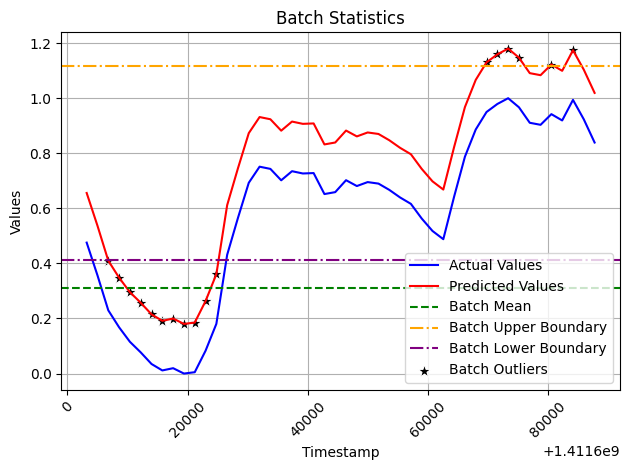


 Message Index: 88 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2930347887472563
Batch Mean Lower Bound w/ error rate: 0.3503989417904779
Batch Mean Upper Bound w/ error rate: 1.0097272164718047


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411689600          0.702491                  0.567077          16288   
1   1411691400          0.564896                  0.429482          13049   
2   1411693200          0.456782                  0.321368          10504   
3   1411695000          0.368379                  0.232965           8423   
4   1411696800          0.311752                  0.176338           7090   
5   1411698600          0.262049                  0.126636           5920   
6   1411700400          0.216552                  0.081138           4849   
7   1411702200          0.184819                  0.049405           4102   
8   1411704000          0.184437                  0.049023           4093   
9   1411

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


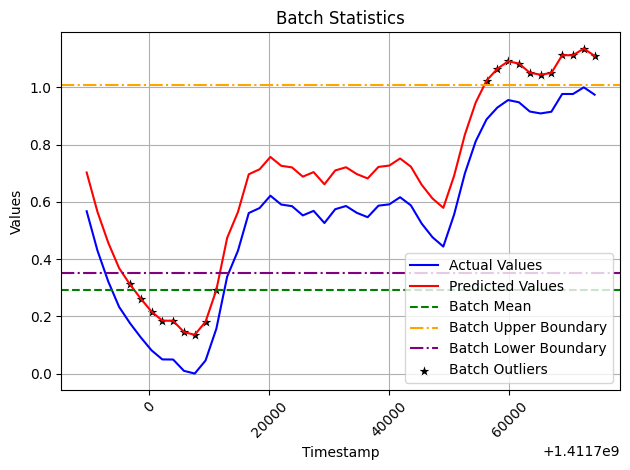


 Message Index: 89 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2742586626897021
Batch Mean Lower Bound w/ error rate: 0.2974088015482773
Batch Mean Upper Bound w/ error rate: 0.914490792600107


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411776000          0.902927                  0.877396          25100   
1   1411777800          0.853527                  0.827996          23886   
2   1411779600          0.816742                  0.791211          22982   
3   1411781400          0.717413                  0.691882          20541   
4   1411783200          0.653486                  0.627955          18970   
5   1411785000          0.590943                  0.565412          17433   
6   1411786800          0.473507                  0.447976          14547   
7   1411788600          0.398105                  0.372574          12694   
8   1411790400          0.303700                  0.278169          10374   
9   14117

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


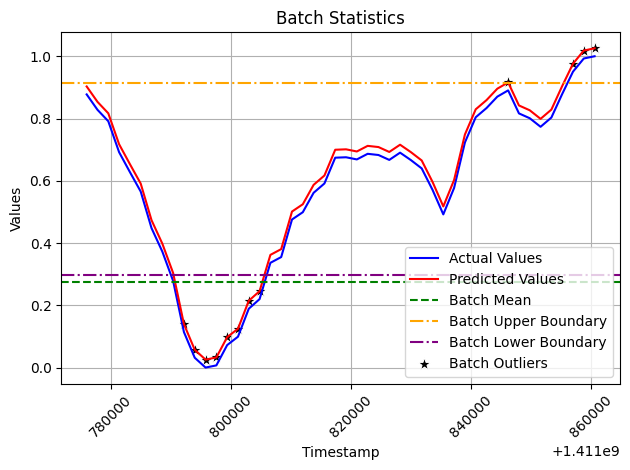


 Message Index: 90 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.25002415032022934
Batch Mean Lower Bound w/ error rate: -0.47470532466958204
Batch Mean Upper Bound w/ error rate: 0.087849013550934


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411862400          0.300916                  1.000000          27269   
1   1411864200          0.260683                  0.959768          26320   
2   1411866000          0.186536                  0.885620          24571   
3   1411867800          0.107131                  0.806215          22698   
4   1411869600          0.032940                  0.732025          20948   
5   1411871400         -0.068255                  0.630829          18561   
6   1411873200         -0.167585                  0.531499          16218   
7   1411875000         -0.267000                  0.432084          13873   
8   1411876800         -0.349542                  0.349542          11926   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


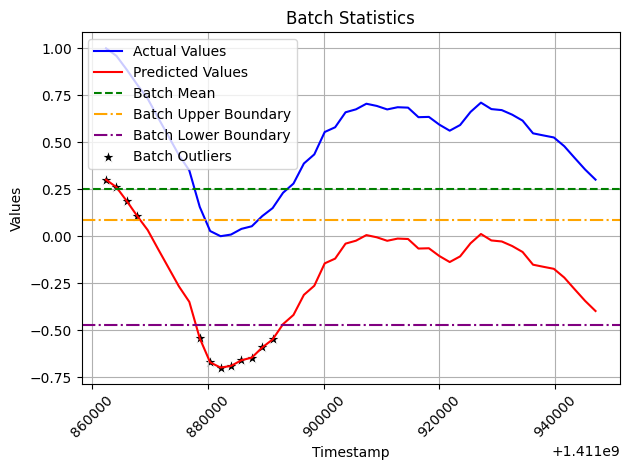


 Message Index: 91 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3069431973272239
Batch Mean Lower Bound w/ error rate: 0.36811304813060053
Batch Mean Upper Bound w/ error rate: 1.0587352421168543


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1411948800          0.460468                  0.305108           8332   
1   1411950600          0.367662                  0.212302           6357   
2   1411952400          0.301922                  0.146563           4958   
3   1411954200          0.231578                  0.076218           3461   
4   1411956000          0.221804                  0.066444           3253   
5   1411957800          0.186091                  0.030732           2493   
6   1411959600          0.162596                  0.007237           1993   
7   1411961400          0.155360                  0.000000           1839   
8   1411963200          0.175848                  0.020488           2275   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


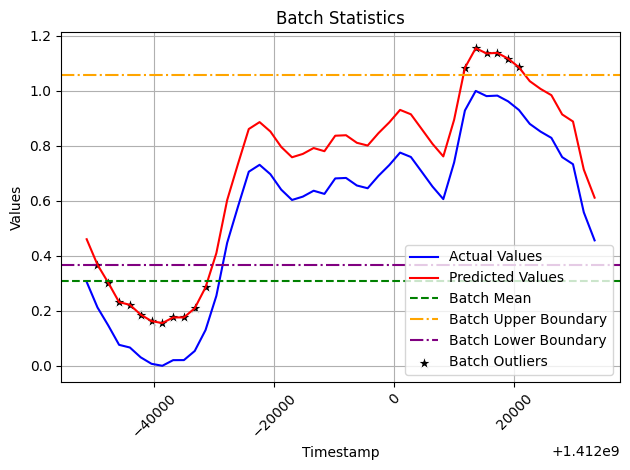


 Message Index: 92 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3219040665675105
Batch Mean Lower Bound w/ error rate: 0.3606648936315017
Batch Mean Upper Bound w/ error rate: 1.0849490434084004


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412035200          0.483625                  0.336117           9459   
1   1412037000          0.366120                  0.218613           6800   
2   1412038800          0.300850                  0.153343           5323   
3   1412040600          0.241325                  0.093818           3976   
4   1412042400          0.210524                  0.063016           3279   
5   1412044200          0.181269                  0.033762           2617   
6   1412046000          0.154445                  0.006938           2010   
7   1412047800          0.147507                  0.000000           1853   
8   1412049600          0.160632                  0.013125           2150   
9   1412

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


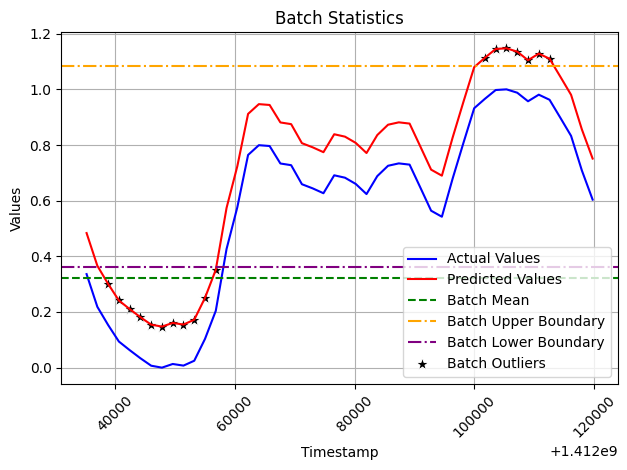


 Message Index: 93 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3114467233272945
Batch Mean Lower Bound w/ error rate: 0.28653383388306247
Batch Mean Upper Bound w/ error rate: 0.9872889613694751


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412121600          0.510872                  0.460069          12751   
1   1412123400          0.341000                  0.290197           8767   
2   1412125200          0.265871                  0.215068           7005   
3   1412127000          0.191339                  0.140536           5257   
4   1412128800          0.145802                  0.094999           4189   
5   1412130600          0.105167                  0.054364           3236   
6   1412132400          0.087302                  0.036499           2817   
7   1412134200          0.074936                  0.024133           2527   
8   1412136000          0.069777                  0.018974           2406   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


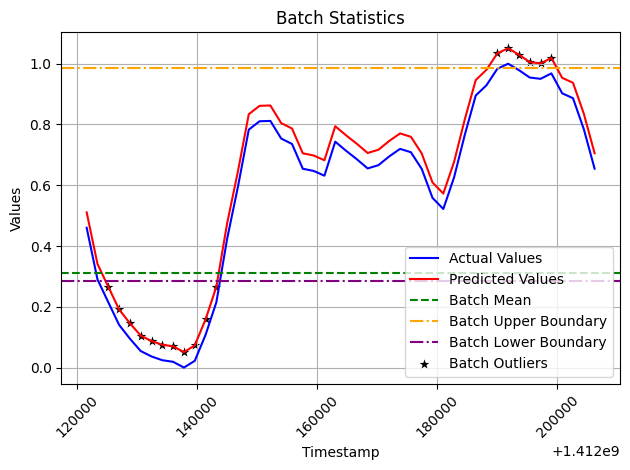


 Message Index: 94 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3156863495199457
Batch Mean Lower Bound w/ error rate: 0.41070339360739305
Batch Mean Upper Bound w/ error rate: 1.120997680027271


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412208000          0.657045                  0.484269          13534   
1   1412209800          0.526528                  0.353752          10485   
2   1412211600          0.417757                  0.244981           7944   
3   1412213400          0.335826                  0.163050           6030   
4   1412215200          0.286042                  0.113266           4867   
5   1412217000          0.240881                  0.068105           3812   
6   1412218800          0.216867                  0.044091           3251   
7   1412220600          0.194907                  0.022131           2738   
8   1412222400          0.195635                  0.022859           2755   
9   1412

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


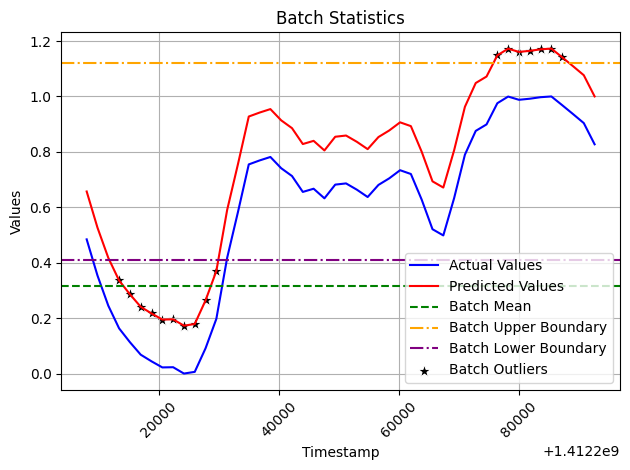


 Message Index: 95 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29141848054904324
Batch Mean Lower Bound w/ error rate: 0.3108155724324216
Batch Mean Upper Bound w/ error rate: 0.966507153667769


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412294400          0.682064                  0.619550          18003   
1   1412296200          0.568411                  0.505897          15266   
2   1412298000          0.438189                  0.375675          12130   
3   1412299800          0.343388                  0.280874           9847   
4   1412301600          0.267605                  0.205091           8022   
5   1412303400          0.204737                  0.142222           6508   
6   1412305200          0.154949                  0.092434           5309   
7   1412307000          0.114670                  0.052155           4339   
8   1412308800          0.108981                  0.046466           4202   
9   1412

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


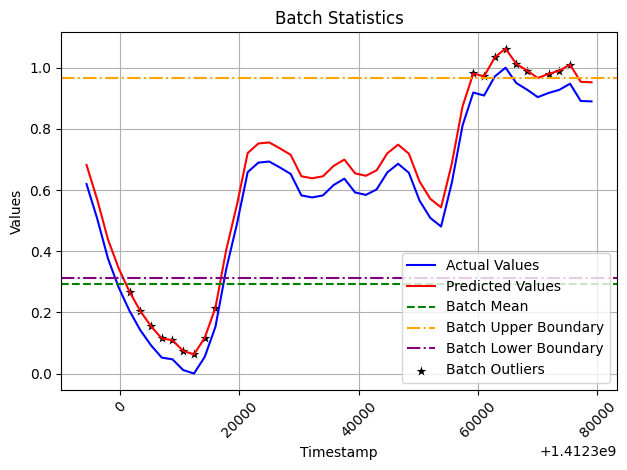


 Message Index: 96 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29408514774882866
Batch Mean Lower Bound w/ error rate: 0.3422007098946918
Batch Mean Upper Bound w/ error rate: 1.0038922923295563


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412380800          0.946022                  0.863543          23316   
1   1412382600          0.902815                  0.820335          22311   
2   1412384400          0.823666                  0.741187          20470   
3   1412386200          0.744518                  0.662038          18629   
4   1412388000          0.679642                  0.597163          17120   
5   1412389800          0.611886                  0.529407          15544   
6   1412391600          0.546022                  0.463543          14012   
7   1412393400          0.434801                  0.352322          11425   
8   1412395200          0.353804                  0.271324           9541   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


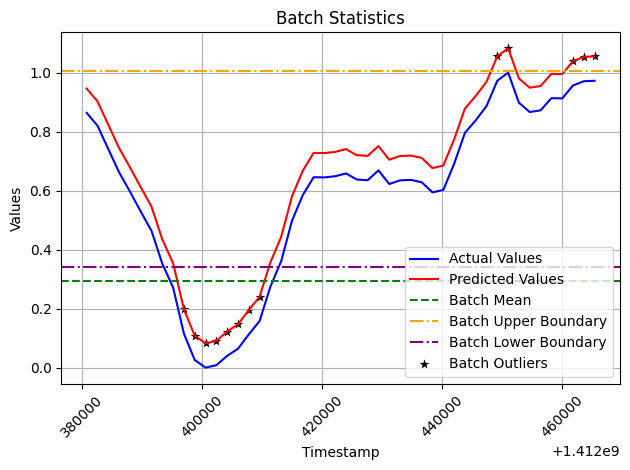


 Message Index: 97 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.25124402046046906
Batch Mean Lower Bound w/ error rate: -0.4156426868928888
Batch Mean Upper Bound w/ error rate: 0.1496563591431666


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412467200          0.336408                  1.000000          25224   
1   1412469000          0.246447                  0.910039          23248   
2   1412470800          0.224776                  0.888368          22772   
3   1412472600          0.129124                  0.792716          20671   
4   1412474400          0.062518                  0.726110          19208   
5   1412476200         -0.024348                  0.639244          17300   
6   1412478000         -0.117223                  0.546369          15260   
7   1412479800         -0.221480                  0.442112          12970   
8   1412481600         -0.303519                  0.360073          11168   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


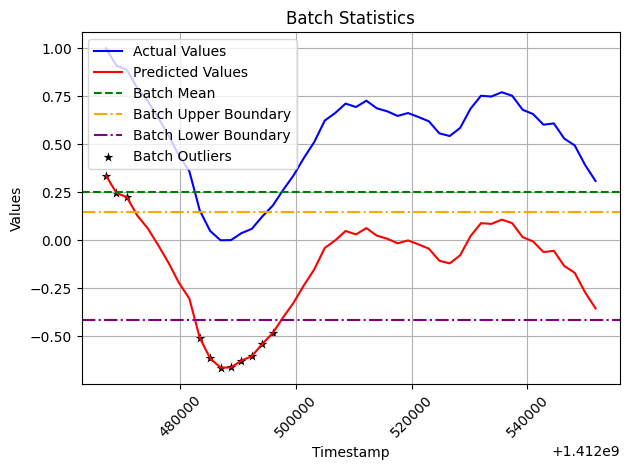


 Message Index: 98 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30440246267549126
Batch Mean Lower Bound w/ error rate: 0.32368399778573204
Batch Mean Upper Bound w/ error rate: 1.0085895388055874


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412553600          0.399754                  0.274981           7997   
1   1412555400          0.298468                  0.173696           5689   
2   1412557200          0.239751                  0.114978           4351   
3   1412559000          0.195734                  0.070962           3348   
4   1412560800          0.172080                  0.047308           2809   
5   1412562600          0.145047                  0.020275           2193   
6   1412564400          0.125694                  0.000922           1752   
7   1412566200          0.124773                  0.000000           1731   
8   1412568000          0.136314                  0.011542           1994   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


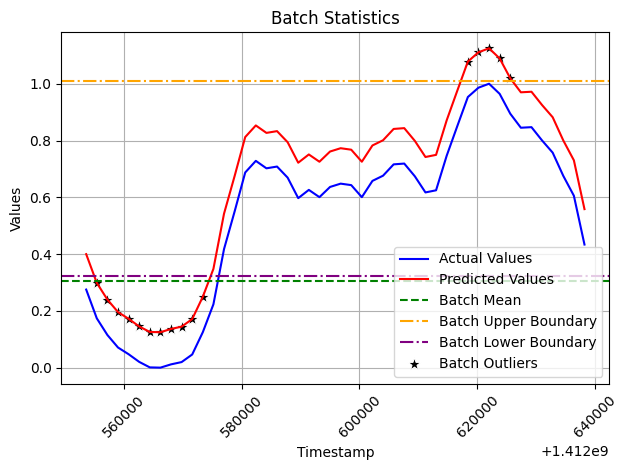


 Message Index: 99 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31793461224337427
Batch Mean Lower Bound w/ error rate: 0.39005776129467395
Batch Mean Upper Bound w/ error rate: 1.1054106388422662


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412640000          0.512112                  0.332412           9469   
1   1412641800          0.388472                  0.208772           6605   
2   1412643600          0.331400                  0.151701           5283   
3   1412645400          0.282575                  0.102875           4152   
4   1412647200          0.246614                  0.066914           3319   
5   1412649000          0.208321                  0.028622           2432   
6   1412650800          0.188290                  0.008591           1968   
7   1412652600          0.179699                  0.000000           1769   
8   1412654400          0.190449                  0.010749           2018   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


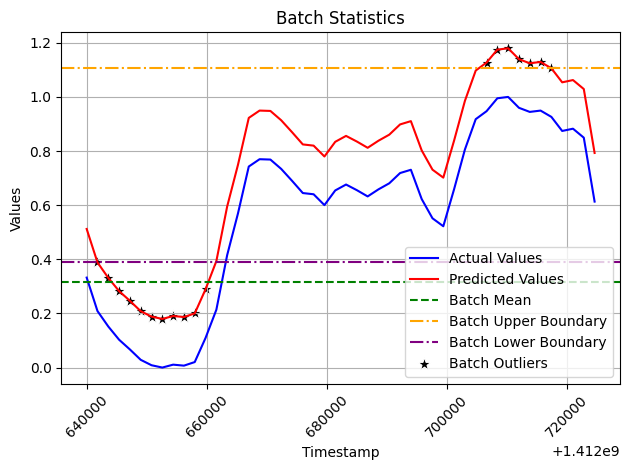


 Message Index: 100 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3150359410826384
Batch Mean Lower Bound w/ error rate: 0.24084231032468156
Batch Mean Upper Bound w/ error rate: 0.949673177760618


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412726400          0.460910                  0.438402          12484   
1   1412728200          0.318966                  0.296458           9130   
2   1412730000          0.215830                  0.193322           6693   
3   1412731800          0.158274                  0.135765           5333   
4   1412733600          0.094242                  0.071734           3820   
5   1412735400          0.062290                  0.039782           3065   
6   1412737200          0.038844                  0.016336           2511   
7   1412739000          0.029872                  0.007364           2299   
8   1412740800          0.030676                  0.008168           2318   
9   1412

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


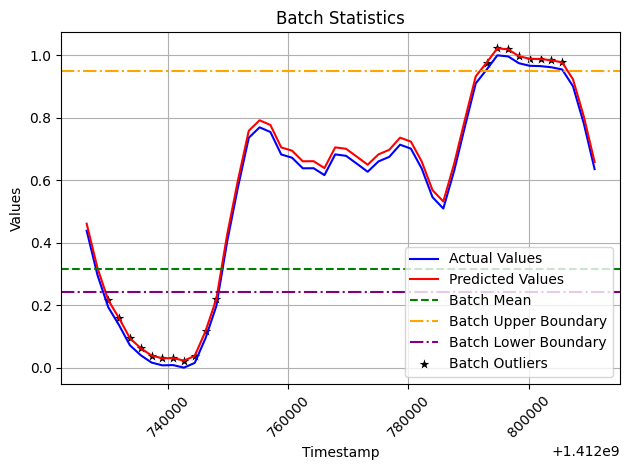


 Message Index: 101 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31772453771106257
Batch Mean Lower Bound w/ error rate: 0.3791690044921362
Batch Mean Upper Bound w/ error rate: 1.0940492143420268


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412812800          0.616436                  0.455635          13602   
1   1412814600          0.486254                  0.325454          10452   
2   1412816400          0.378142                  0.217341           7836   
3   1412818200          0.303918                  0.143117           6040   
4   1412820000          0.260152                  0.099351           4981   
5   1412821800          0.203616                  0.042815           3613   
6   1412823600          0.175100                  0.014299           2923   
7   1412825400          0.163074                  0.002273           2632   
8   1412827200          0.174646                  0.013845           2912   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


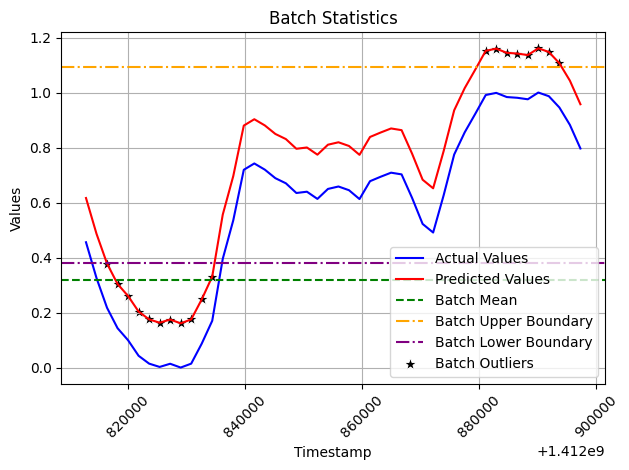


 Message Index: 102 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.298024822871782
Batch Mean Lower Bound w/ error rate: 0.44169333065535066
Batch Mean Upper Bound w/ error rate: 1.11224918211686


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412899200          0.844089                  0.653856          18756   
1   1412901000          0.683984                  0.493751          14990   
2   1412902800          0.636156                  0.445923          13865   
3   1412904600          0.483023                  0.292790          10263   
4   1412906400          0.381416                  0.191183           7873   
5   1412908200          0.322195                  0.131962           6480   
6   1412910000          0.263271                  0.073038           5094   
7   1412911800          0.225987                  0.035754           4217   
8   1412913600          0.229048                  0.038815           4289   
9   141291

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


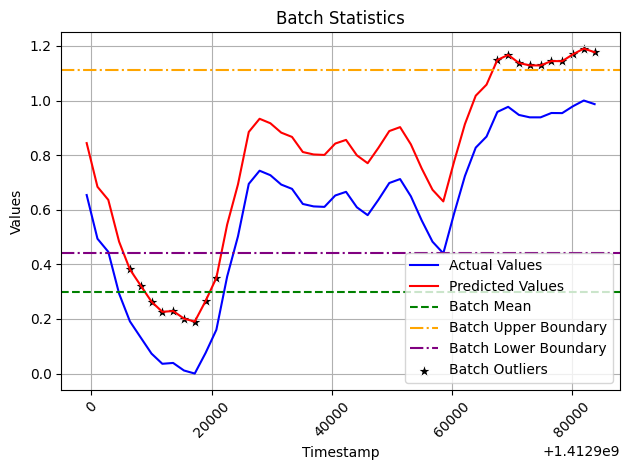


 Message Index: 103 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.28901554426533954
Batch Mean Lower Bound w/ error rate: 0.3301597806401239
Batch Mean Upper Bound w/ error rate: 0.9804447552371378


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1412985600          0.932224                  0.920566          25257   
1   1412987400          0.867121                  0.855464          23717   
2   1412989200          0.817407                  0.805749          22541   
3   1412991000          0.700391                  0.688734          19773   
4   1412992800          0.695276                  0.683619          19652   
5   1412994600          0.553319                  0.541661          16294   
6   1412996400          0.454989                  0.443331          13968   
7   1412998200          0.371793                  0.360135          12000   
8   1413000000          0.305507                  0.293849          10432   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


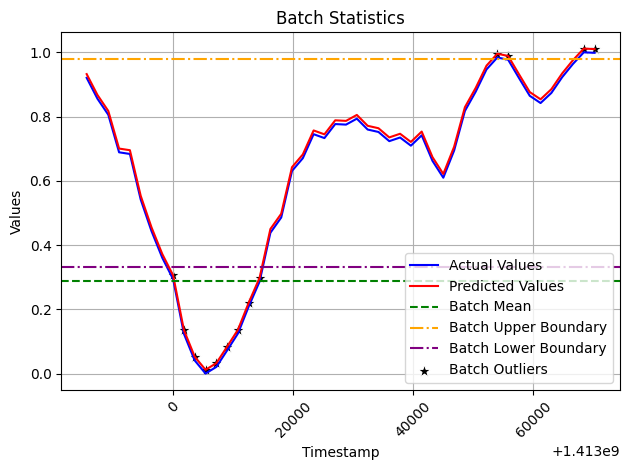


 Message Index: 104 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.25515229162480724
Batch Mean Lower Bound w/ error rate: -0.31051158119494743
Batch Mean Upper Bound w/ error rate: 0.26358107496086886


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413072000          0.443004                  1.000000          26610   
1   1413073800          0.389966                  0.946962          25400   
2   1413075600          0.328250                  0.885246          23992   
3   1413077400          0.256671                  0.813667          22359   
4   1413079200          0.199469                  0.756465          21054   
5   1413081000          0.101196                  0.658192          18812   
6   1413082800          0.003537                  0.560533          16584   
7   1413084600         -0.100785                  0.456211          14204   
8   1413086400         -0.197831                  0.359165          11990   
9   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


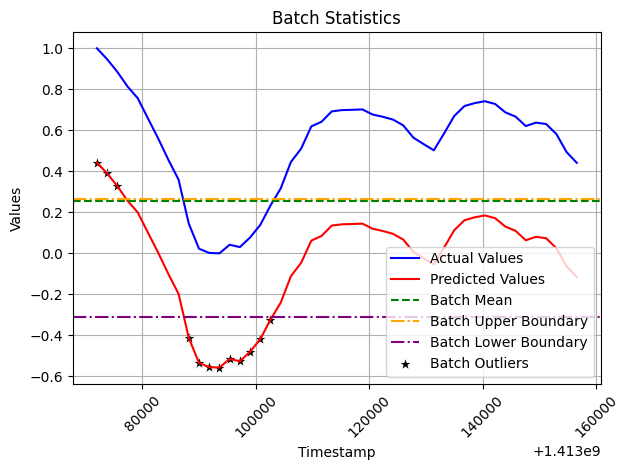


 Message Index: 105 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2855897576641119
Batch Mean Lower Bound w/ error rate: 0.09220751799758115
Batch Mean Upper Bound w/ error rate: 0.7347844727418329


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413158400          0.320337                  0.399002          11544   
1   1413160200          0.206709                  0.285374           9016   
2   1413162000          0.104362                  0.183028           6739   
3   1413163800          0.045076                  0.123741           5420   
4   1413165600          0.007500                  0.086165           4584   
5   1413167400         -0.028324                  0.050342           3787   
6   1413169200         -0.062889                  0.015777           3018   
7   1413171000         -0.078665                  0.000000           2667   
8   1413172800         -0.064552                  0.014114           2981   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


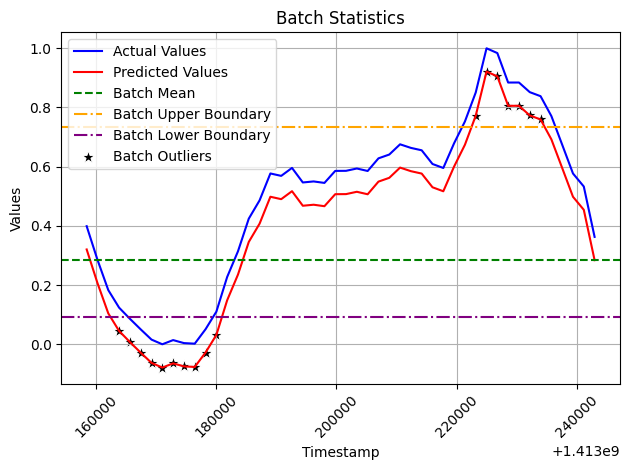


 Message Index: 106 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.32710287025575174
Batch Mean Lower Bound w/ error rate: 0.4178986430982257
Batch Mean Upper Bound w/ error rate: 1.1538801011736672


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413244800          0.519371                  0.327138           8908   
1   1413246600          0.414434                  0.222202           6593   
2   1413248400          0.367610                  0.175377           5560   
3   1413250200          0.297531                  0.105299           4014   
4   1413252000          0.253653                  0.061421           3046   
5   1413253800          0.222059                  0.029826           2349   
6   1413255600          0.200618                  0.008386           1876   
7   1413257400          0.192232                  0.000000           1691   
8   1413259200          0.203565                  0.011332           1941   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


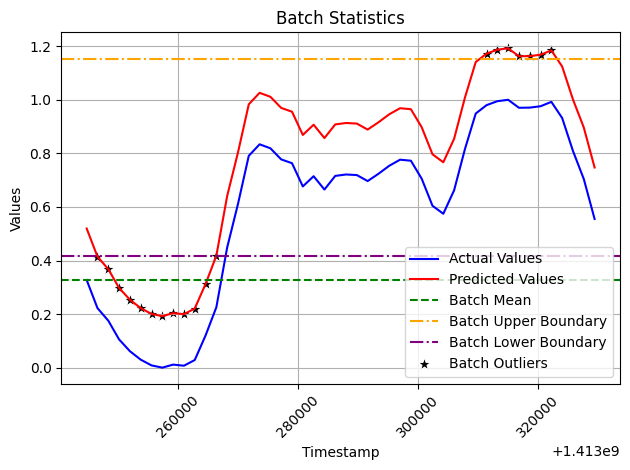


 Message Index: 107 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30750953505976303
Batch Mean Lower Bound w/ error rate: 0.24191111053253772
Batch Mean Upper Bound w/ error rate: 0.9338075644170045


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413331200          0.410349                  0.384118          11429   
1   1413333000          0.288243                  0.262011           8486   
2   1413334800          0.205179                  0.178948           6484   
3   1413336600          0.147466                  0.121235           5093   
4   1413338400          0.102864                  0.076633           4018   
5   1413340200          0.069672                  0.043440           3218   
6   1413342000          0.041375                  0.015144           2536   
7   1413343800          0.028223                  0.001992           2219   
8   1413345600          0.026231                  0.000000           2171   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


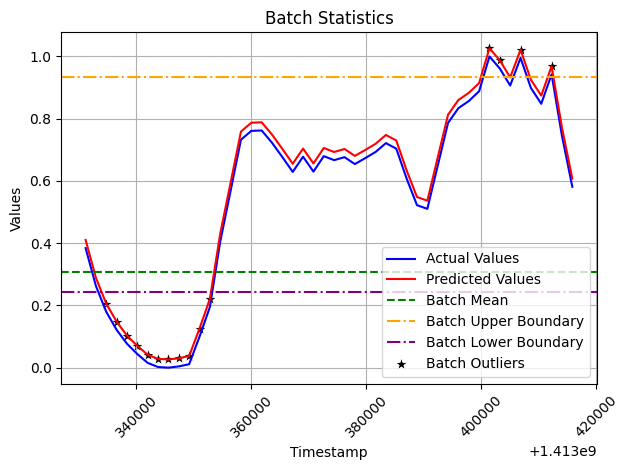


 Message Index: 108 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3166091914797005
Batch Mean Lower Bound w/ error rate: 0.5015312973173699
Batch Mean Upper Bound w/ error rate: 1.213901978146696


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413417600          0.721436                  0.438587          13302   
1   1413419400          0.607918                  0.325069          10509   
2   1413421200          0.515738                  0.232889           8241   
3   1413423000          0.405797                  0.122947           5536   
4   1413424800          0.370355                  0.087506           4664   
5   1413426600          0.321420                  0.038571           3460   
6   1413428400          0.294554                  0.011705           2799   
7   1413430200          0.291750                  0.008901           2730   
8   1413432000          0.294636                  0.011787           2801   
9   14134

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


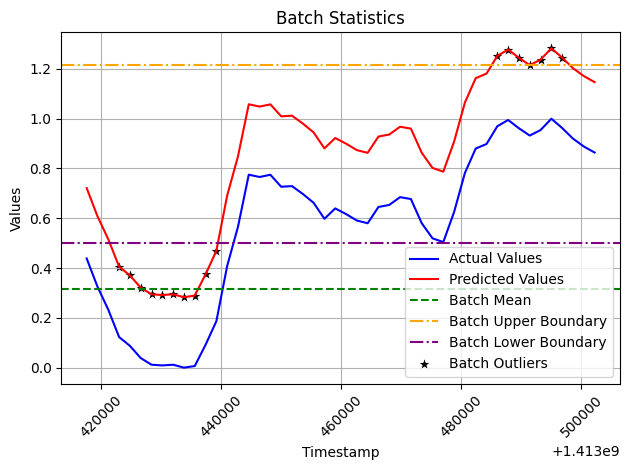


 Message Index: 109 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30323517475481326
Batch Mean Lower Bound w/ error rate: 0.3630673195681094
Batch Mean Upper Bound w/ error rate: 1.0453464627664393


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413504000          0.787986                  0.680134          19268   
1   1413505800          0.633948                  0.526096          15623   
2   1413507600          0.505984                  0.398132          12595   
3   1413509400          0.405786                  0.297933          10224   
4   1413511200          0.309306                  0.201454           7941   
5   1413513000          0.255931                  0.148079           6678   
6   1413514800          0.192710                  0.084858           5182   
7   1413516600          0.163974                  0.056121           4502   
8   1413518400          0.156113                  0.048261           4316   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


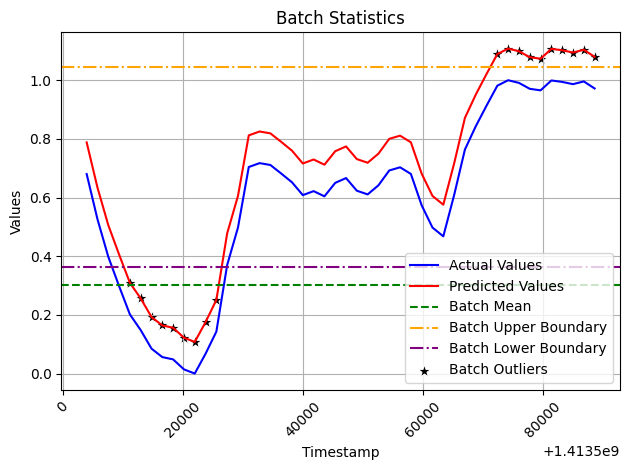


 Message Index: 110 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2830231142460248
Batch Mean Lower Bound w/ error rate: 0.31328880616505245
Batch Mean Upper Bound w/ error rate: 0.9500908132186081


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413590400          0.884479                  0.856418          25059   
1   1413592200          0.859442                  0.831381          24437   
2   1413594000          0.790247                  0.762187          22718   
3   1413595800          0.709017                  0.680956          20700   
4   1413597600          0.665665                  0.637604          19623   
5   1413599400          0.547000                  0.518939          16675   
6   1413601200          0.457316                  0.429256          14447   
7   1413603000          0.373993                  0.345932          12377   
8   1413604800          0.302826                  0.274766          10609   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


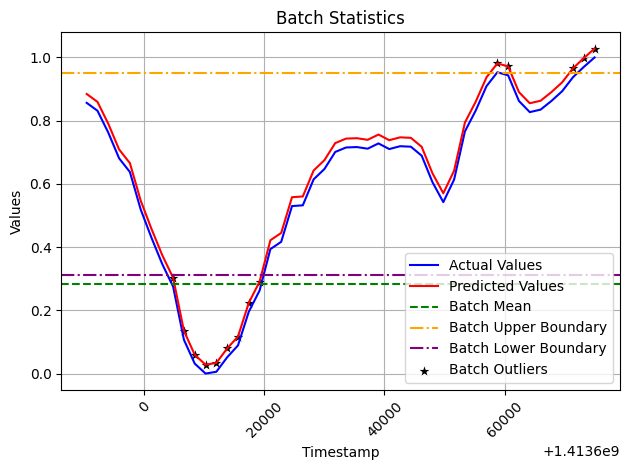


 Message Index: 111 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.25939392967843883
Batch Mean Lower Bound w/ error rate: -0.48013867636055496
Batch Mean Upper Bound w/ error rate: 0.10349766541593239


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413676800          0.277614                  1.000000          28093   
1   1413678600          0.200115                  0.922501          26200   
2   1413680400          0.175960                  0.898346          25610   
3   1413682200          0.088881                  0.811267          23483   
4   1413684000          0.022026                  0.744412          21850   
5   1413685800         -0.082494                  0.639892          19297   
6   1413687600         -0.193974                  0.528412          16574   
7   1413689400         -0.284819                  0.437567          14355   
8   1413691200         -0.376648                  0.345738          12112   
9   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


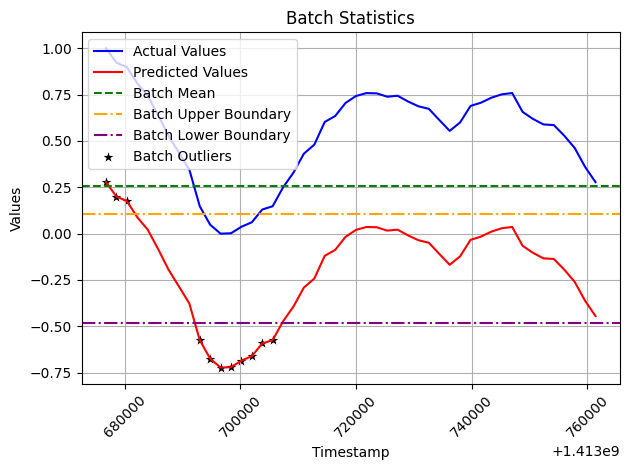


 Message Index: 112 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30310454408517906
Batch Mean Lower Bound w/ error rate: 0.36228157397179517
Batch Mean Upper Bound w/ error rate: 1.0442667981634481


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413763200          0.440469                  0.284715           8295   
1   1413765000          0.376723                  0.220969           6837   
2   1413766800          0.285345                  0.129591           4747   
3   1413768600          0.221337                  0.065582           3283   
4   1413770400          0.204766                  0.049012           2904   
5   1413772200          0.180326                  0.024572           2345   
6   1413774000          0.161613                  0.005859           1917   
7   1413775800          0.155754                  0.000000           1783   
8   1413777600          0.172849                  0.017095           2174   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


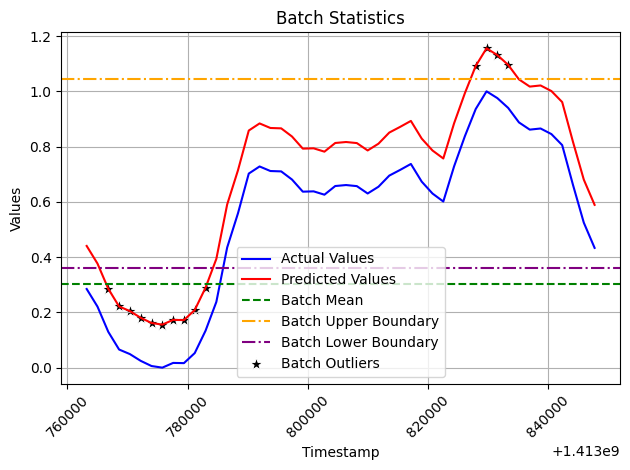


 Message Index: 113 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3145110586302942
Batch Mean Lower Bound w/ error rate: 0.34840628586687283
Batch Mean Upper Bound w/ error rate: 1.0560561677850349


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413849600          0.449636                  0.305008           9214   
1   1413851400          0.354209                  0.209580           6931   
2   1413853200          0.290758                  0.146129           5413   
3   1413855000          0.237130                  0.092501           4130   
4   1413856800          0.201434                  0.056805           3276   
5   1413858600          0.167953                  0.023324           2475   
6   1413860400          0.151442                  0.006813           2080   
7   1413862200          0.144629                  0.000000           1917   
8   1413864000          0.153239                  0.008611           2123   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


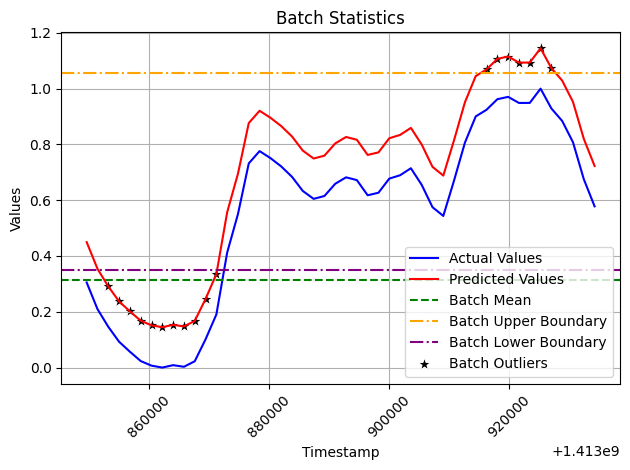


 Message Index: 114 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30806694921237193
Batch Mean Lower Bound w/ error rate: 0.29952404342308164
Batch Mean Upper Bound w/ error rate: 0.9926746791509184


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1413936000          0.488757                  0.411332          12115   
1   1413937800          0.359203                  0.281778           9035   
2   1413939600          0.274237                  0.196812           7015   
3   1413941400          0.194233                  0.116808           5113   
4   1413943200          0.156671                  0.079246           4220   
5   1413945000          0.119277                  0.041852           3331   
6   1413946800          0.099886                  0.022462           2870   
7   1413948600          0.084996                  0.007571           2516   
8   1413950400          0.090885                  0.013460           2656   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


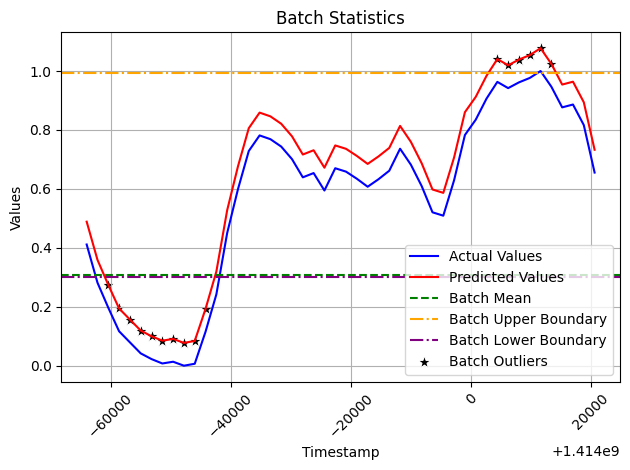


 Message Index: 115 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31860647599777675
Batch Mean Lower Bound w/ error rate: 0.4248528182464274
Batch Mean Upper Bound w/ error rate: 1.1417173892414252


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414022400          0.663897                  0.471137          13496   
1   1414024200          0.534404                  0.341644          10416   
2   1414026000          0.436611                  0.243851           8090   
3   1414027800          0.346470                  0.153710           5946   
4   1414029600          0.278528                  0.085768           4330   
5   1414031400          0.234467                  0.041707           3282   
6   1414033200          0.211343                  0.018583           2732   
7   1414035000          0.202598                  0.009838           2524   
8   1414036800          0.209997                  0.017238           2700   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


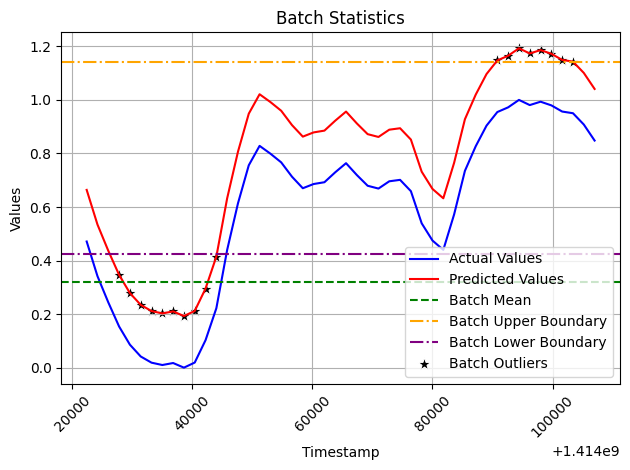


 Message Index: 116 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2988596910513731
Batch Mean Lower Bound w/ error rate: 0.40086568762931124
Batch Mean Upper Bound w/ error rate: 1.0732999924949007


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414108800          0.811884                  0.660065          19061   
1   1414110600          0.713814                  0.561996          16689   
2   1414112400          0.561543                  0.409724          13006   
3   1414114200          0.417085                  0.265266           9512   
4   1414116000          0.344029                  0.192211           7745   
5   1414117800          0.273413                  0.121594           6037   
6   1414119600          0.238559                  0.086741           5194   
7   1414121400          0.206517                  0.054699           4419   
8   1414123200          0.200233                  0.048414           4267   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


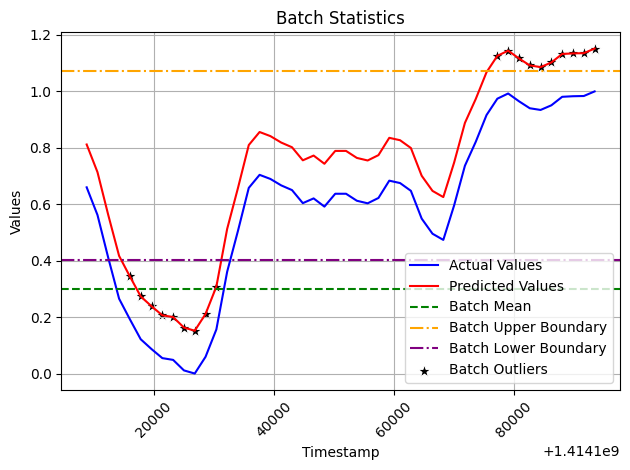


 Message Index: 117 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2881386731523989
Batch Mean Lower Bound w/ error rate: 0.2882306549674167
Batch Mean Upper Bound w/ error rate: 0.9365426695603141


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414195200      9.193875e-01                  0.919387          25739   
1   1414197000      8.430264e-01                  0.843026          23889   
2   1414198800      7.765303e-01                  0.776530          22278   
3   1414200600      6.964131e-01                  0.696413          20337   
4   1414202400      6.486152e-01                  0.648615          19179   
5   1414204200      5.407603e-01                  0.540760          16566   
6   1414206000      4.408718e-01                  0.440872          14146   
7   1414207800      3.529120e-01                  0.352912          12015   
8   1414209600      2.815041e-01                  0.281504          10285   
9   1414

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


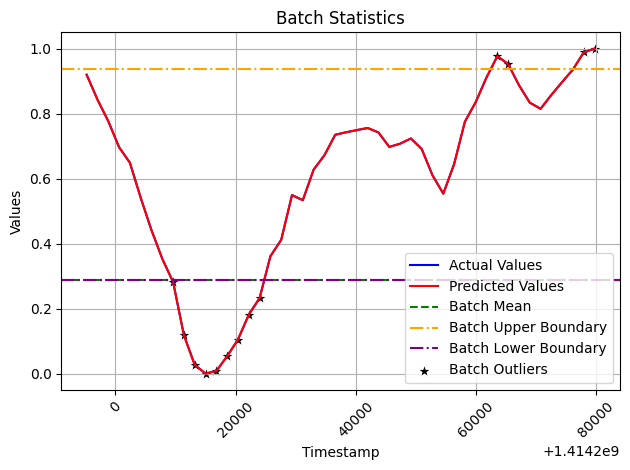


 Message Index: 118 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2605628595088862
Batch Mean Lower Bound w/ error rate: -0.4887008602047137
Batch Mean Upper Bound w/ error rate: 0.09756557369028016


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414281600          0.277165                  1.000000          26866   
1   1414283400          0.250797                  0.973632          26254   
2   1414285200          0.174451                  0.897286          24482   
3   1414287000          0.085825                  0.808660          22425   
4   1414288800          0.018613                  0.741448          20865   
5   1414290600         -0.070315                  0.652520          18801   
6   1414292400         -0.188152                  0.534683          16066   
7   1414294200         -0.273158                  0.449677          14093   
8   1414296000         -0.369237                  0.353598          11863   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


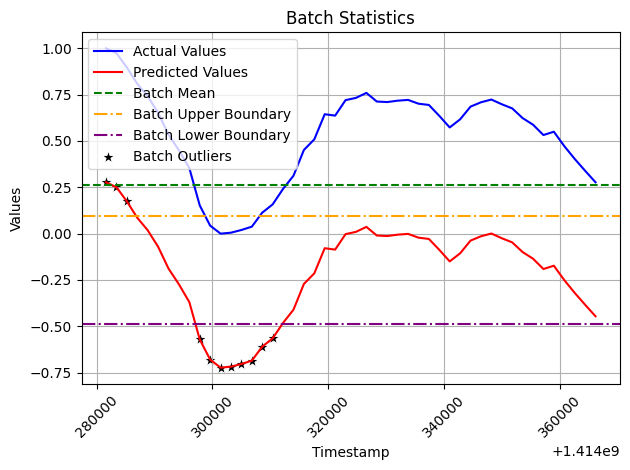


 Message Index: 119 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30240758243875066
Batch Mean Lower Bound w/ error rate: 0.44833774604498294
Batch Mean Upper Bound w/ error rate: 1.128754806532172


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414368000          0.531031                  0.292591           8326   
1   1414369800          0.453805                  0.215366           6579   
2   1414371600          0.356820                  0.118380           4385   
3   1414373400          0.316372                  0.077933           3470   
4   1414375200          0.289142                  0.050703           2854   
5   1414377000          0.257049                  0.018610           2128   
6   1414378800          0.241887                  0.003448           1785   
7   1414380600          0.238439                  0.000000           1707   
8   1414382400          0.257492                  0.019052           2138   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


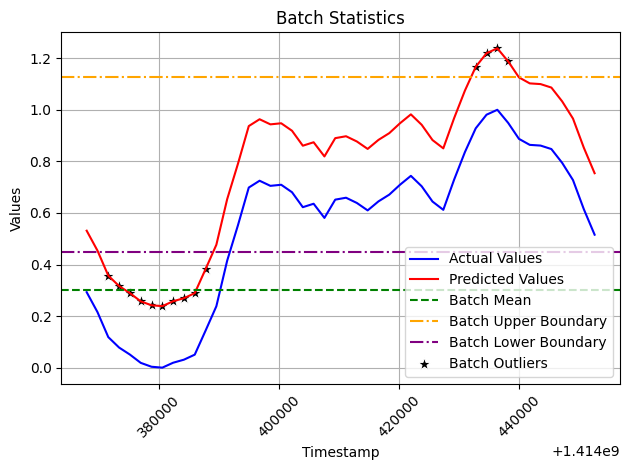


 Message Index: 120 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3227176234050265
Batch Mean Lower Bound w/ error rate: 0.355187743838637
Batch Mean Upper Bound w/ error rate: 1.0813023964999466


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414454400          0.536066                  0.410717          10910   
1   1414456200          0.386979                  0.261630           7638   
2   1414458000          0.293618                  0.168269           5589   
3   1414459800          0.231013                  0.105664           4215   
4   1414461600          0.193240                  0.067891           3386   
5   1414463400          0.164398                  0.039049           2753   
6   1414465200          0.138335                  0.012986           2181   
7   1414467000          0.131637                  0.006288           2034   
8   1414468800          0.134371                  0.009022           2094   
9   14144

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


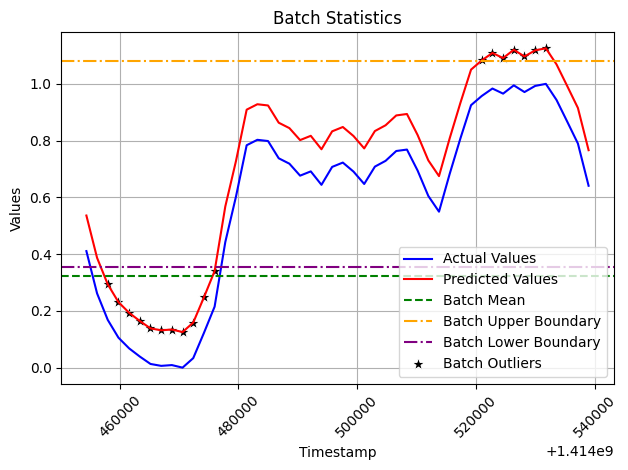


 Message Index: 121 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31335749984347583
Batch Mean Lower Bound w/ error rate: 0.2813667430343644
Batch Mean Upper Bound w/ error rate: 0.986421117682185


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414540800          0.493009                  0.430980          12292   
1   1414542600          0.359905                  0.297876           9190   
2   1414544400          0.260098                  0.198069           6864   
3   1414546200          0.209851                  0.147822           5693   
4   1414548000          0.158618                  0.096589           4499   
5   1414549800          0.107341                  0.045312           3304   
6   1414551600          0.075417                  0.013388           2560   
7   1414553400          0.072198                  0.010169           2485   
8   1414555200          0.075417                  0.013388           2560   
9   1414

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


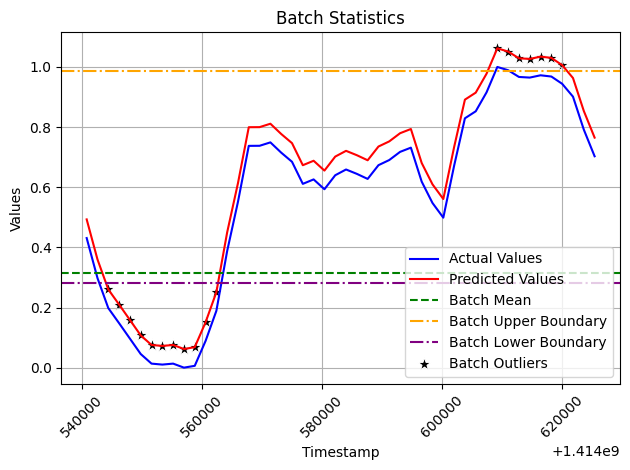


 Message Index: 122 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3129908271251472
Batch Mean Lower Bound w/ error rate: 0.37718118305553666
Batch Mean Upper Bound w/ error rate: 1.0814105440871178


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414627200          0.636906                  0.494452          14048   
1   1414629000          0.493094                  0.350640          10691   
2   1414630800          0.393364                  0.250910           8363   
3   1414632600          0.309484                  0.167031           6405   
4   1414634400          0.260047                  0.117594           5251   
5   1414636200          0.194203                  0.051750           3714   
6   1414638000          0.173555                  0.031101           3232   
7   1414639800          0.166058                  0.023605           3057   
8   1414641600          0.163830                  0.021377           3005   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


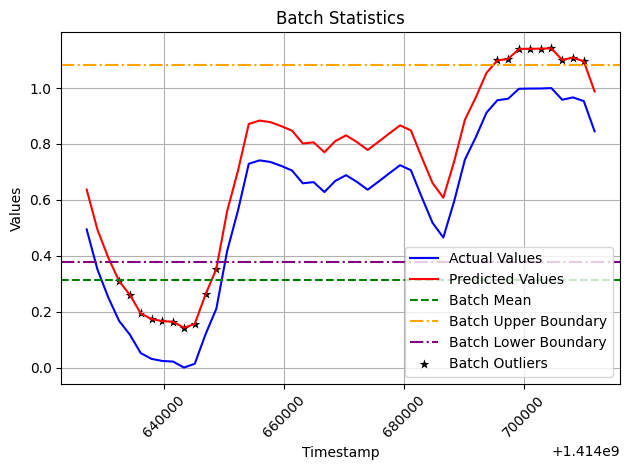


 Message Index: 123 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2908815118025767
Batch Mean Lower Bound w/ error rate: 0.38720724211486357
Batch Mean Upper Bound w/ error rate: 1.0416906436706612


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414713600          0.818250                  0.694613          19957   
1   1414715400          0.689692                  0.566055          16881   
2   1414717200          0.552065                  0.428428          13588   
3   1414719000          0.442148                  0.318510          10958   
4   1414720800          0.365289                  0.241652           9119   
5   1414722600          0.301344                  0.177707           7589   
6   1414724400          0.244170                  0.120533           6221   
7   1414726200          0.190465                  0.066828           4936   
8   1414728000          0.184614                  0.060977           4796   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


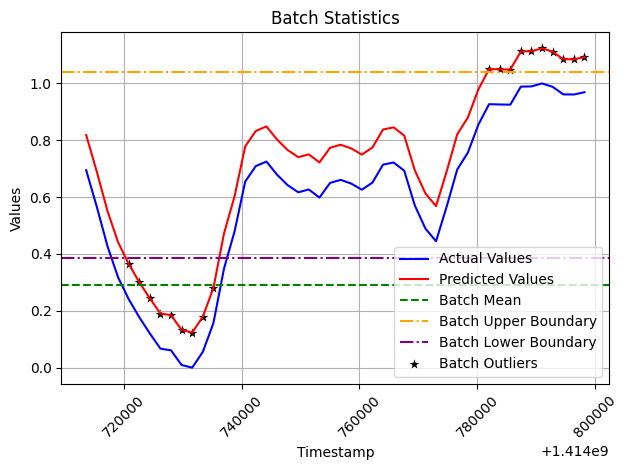


 Message Index: 124 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2957716419583471
Batch Mean Lower Bound w/ error rate: 0.25159415028629667
Batch Mean Upper Bound w/ error rate: 0.9170803446925777


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414800000          0.799367                  0.868771          25425   
1   1414801800          0.777827                  0.847230          24937   
2   1414803600          0.778224                  0.847627          24946   
3   1414805400          0.724814                  0.794218          23736   
4   1414807200          0.703141                  0.772545          23245   
5   1414809000          0.624306                  0.693710          21459   
6   1414810800          0.553240                  0.622644          19849   
7   1414812600          0.457456                  0.526859          17679   
8   1414814400          0.339998                  0.409402          15018   
9   141

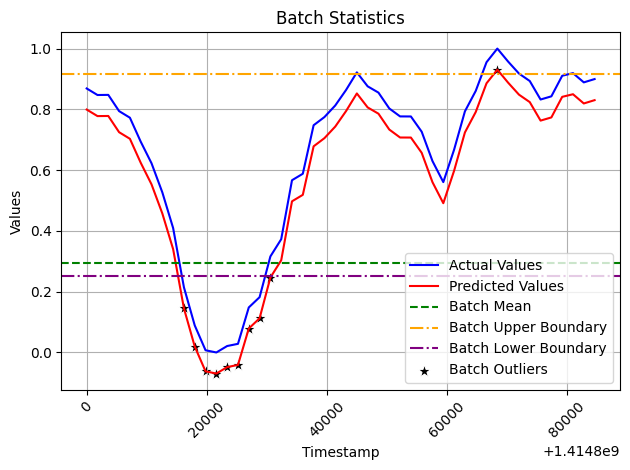


 Message Index: 125 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2122309014202196
Batch Mean Lower Bound w/ error rate: -0.6519960703576537
Batch Mean Upper Bound w/ error rate: -0.17447654216215963


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414886400         -0.141844                  0.593625          25110   
1   1414888200         -0.199568                  0.535901          23109   
2   1414890000          0.264531                  1.000000          39197   
3   1414891800          0.149574                  0.885043          35212   
4   1414893600         -0.483716                  0.251752          13259   
5   1414895400         -0.512823                  0.222645          12250   
6   1414897200         -0.577355                  0.158113          10013   
7   1414899000         -0.638368                  0.097101           7898   
8   1414900800         -0.682303                  0.053166           6375   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


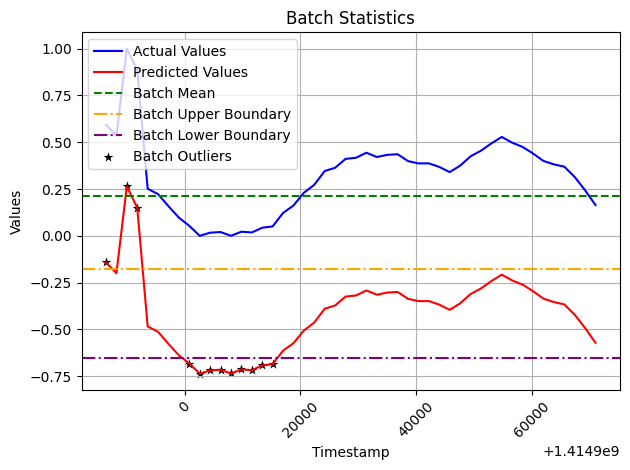


 Message Index: 126 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3166640771482538
Batch Mean Lower Bound w/ error rate: 0.5757357410986018
Batch Mean Upper Bound w/ error rate: 1.288229914682173


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1414972800          0.678797                  0.330120           8771   
1   1414974600          0.551835                  0.203158           6045   
2   1414976400          0.475826                  0.127148           4413   
3   1414978200          0.420961                  0.072284           3235   
4   1414980000          0.395485                  0.046807           2688   
5   1414981800          0.362650                  0.013972           1983   
6   1414983600          0.352078                  0.003400           1756   
7   1414985400          0.348678                  0.000000           1683   
8   1414987200          0.369962                  0.021285           2140   
9   14149

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


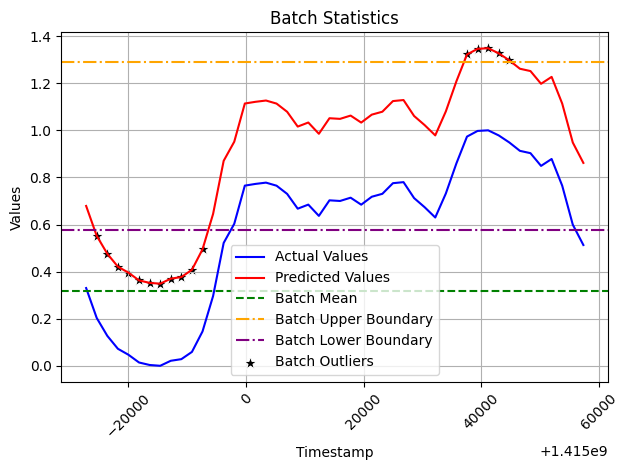


 Message Index: 127 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.32183466453840964
Batch Mean Lower Bound w/ error rate: 0.33950010935268415
Batch Mean Upper Bound w/ error rate: 1.0636281045641058


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415059200          0.517637                  0.414187          10667   
1   1415061000          0.414444                  0.310994           8479   
2   1415062800          0.297762                  0.194312           6005   
3   1415064600          0.198437                  0.094987           3899   
4   1415066400          0.161272                  0.057822           3111   
5   1415068200          0.133682                  0.030232           2526   
6   1415070000          0.114156                  0.010706           2112   
7   1415071800          0.103450                  0.000000           1885   
8   1415073600          0.105148                  0.001698           1921   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


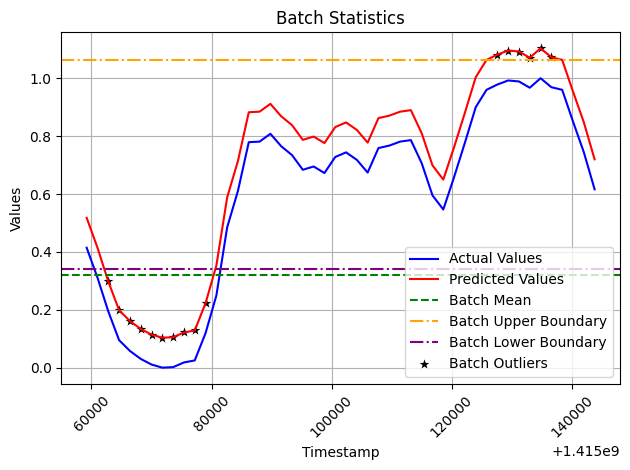


 Message Index: 128 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3233118375389605
Batch Mean Lower Bound w/ error rate: 0.31059460463973493
Batch Mean Upper Bound w/ error rate: 1.038046239102396


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415145600          0.522162                  0.447360          12025   
1   1415147400          0.373741                  0.298939           8767   
2   1415149200          0.278210                  0.203408           6670   
3   1415151000          0.211106                  0.136304           5197   
4   1415152800          0.169741                  0.094939           4289   
5   1415154600          0.119493                  0.044690           3186   
6   1415156400          0.099494                  0.024691           2747   
7   1415158200          0.077171                  0.002369           2257   
8   1415160000          0.083549                  0.008747           2397   
9   1415

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


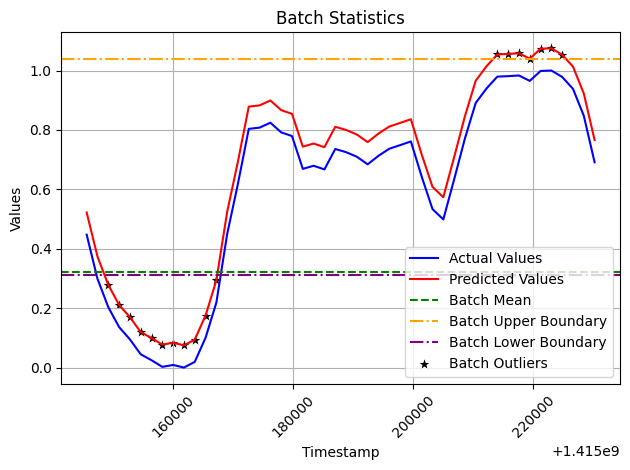


 Message Index: 129 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31094557407967605
Batch Mean Lower Bound w/ error rate: 0.3348425001802456
Batch Mean Upper Bound w/ error rate: 1.0344700418595167


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415232000          0.583633                  0.478671          13846   
1   1415233800          0.436077                  0.331115          10387   
2   1415235600          0.350632                  0.245670           8384   
3   1415237400          0.268344                  0.163382           6455   
4   1415239200          0.208110                  0.103148           5043   
5   1415241000          0.152441                  0.047479           3738   
6   1415242800          0.127571                  0.022609           3155   
7   1415244600          0.110636                  0.005674           2758   
8   1415246400          0.126164                  0.021201           3122   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


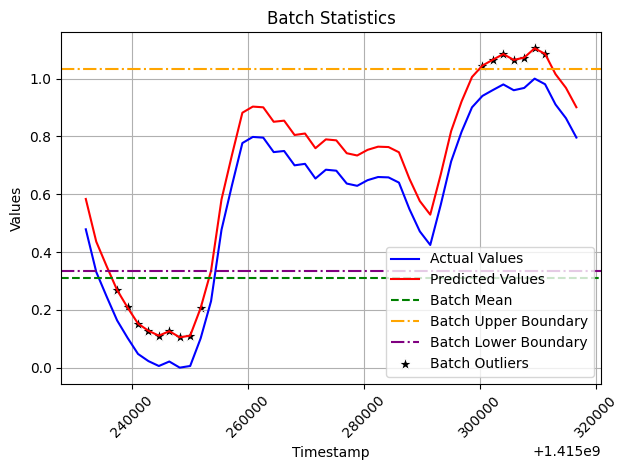


 Message Index: 130 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2993214708212715
Batch Mean Lower Bound w/ error rate: 0.3947751555624779
Batch Mean Upper Bound w/ error rate: 1.0682484649103388


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415318400          0.782514                  0.615388          18308   
1   1415320200          0.621557                  0.454431          14352   
2   1415322000          0.515528                  0.348401          11746   
3   1415323800          0.405511                  0.238384           9042   
4   1415325600          0.335367                  0.168240           7318   
5   1415327400          0.282108                  0.114981           6009   
6   1415329200          0.255865                  0.088738           5364   
7   1415331000          0.214039                  0.046912           4336   
8   1415332800          0.200693                  0.033567           4008   
9   1415

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


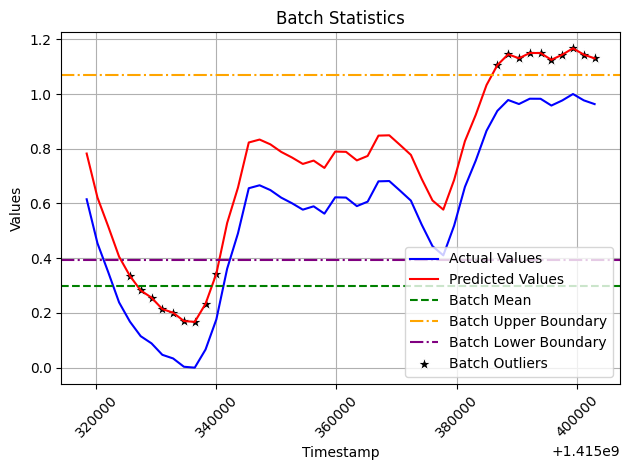


 Message Index: 131 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29670831839817563
Batch Mean Lower Bound w/ error rate: 0.324018016340036
Batch Mean Upper Bound w/ error rate: 0.9916117327359312


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415404800          0.936781                  0.905878          25692   
1   1415406600          0.874332                  0.843429          24162   
2   1415408400          0.795026                  0.764122          22219   
3   1415410200          0.734985                  0.704082          20748   
4   1415412000          0.682862                  0.651959          19471   
5   1415413800          0.579556                  0.548653          16940   
6   1415415600          0.477148                  0.446245          14431   
7   1415417400          0.373760                  0.342857          11898   
8   1415419200          0.307067                  0.276163          10264   
9   1415

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


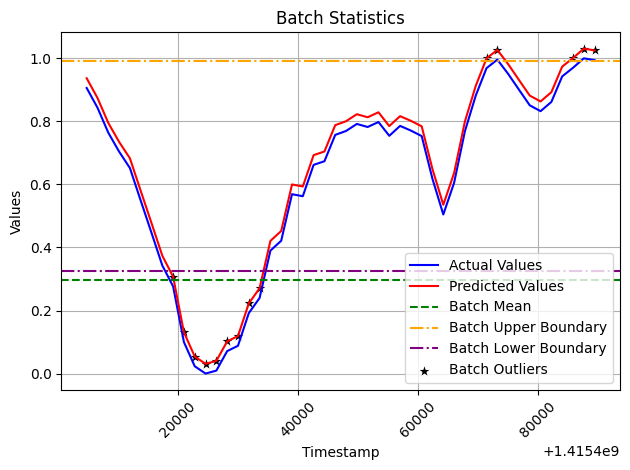


 Message Index: 132 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2599608051681357
Batch Mean Lower Bound w/ error rate: -0.48910630630162655
Batch Mean Upper Bound w/ error rate: 0.09580550532667872


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415491200          0.272798                  1.000000          26931   
1   1415493000          0.198989                  0.926191          25208   
2   1415494800          0.137903                  0.865105          23782   
3   1415496600          0.081786                  0.808987          22472   
4   1415498400          0.026568                  0.753770          21183   
5   1415500200         -0.090807                  0.636395          18443   
6   1415502000         -0.190961                  0.536241          16105   
7   1415503800         -0.289659                  0.437543          13801   
8   1415505600         -0.366938                  0.360264          11997   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


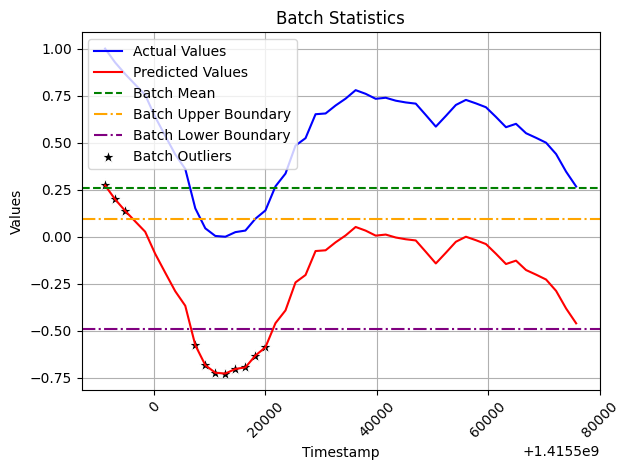


 Message Index: 133 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31454325763033103
Batch Mean Lower Bound w/ error rate: 0.47143114579483886
Batch Mean Upper Bound w/ error rate: 1.1791534754630837


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415577600          0.538928                  0.285359           7870   
1   1415579400          0.454855                  0.201286           6079   
2   1415581200          0.387494                  0.133925           4644   
3   1415583000          0.333840                  0.080270           3501   
4   1415584800          0.309805                  0.056236           2989   
5   1415586600          0.274975                  0.021405           2247   
6   1415588400          0.256480                  0.002910           1853   
7   1415590200          0.253569                  0.000000           1791   
8   1415592000          0.272252                  0.018683           2189   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


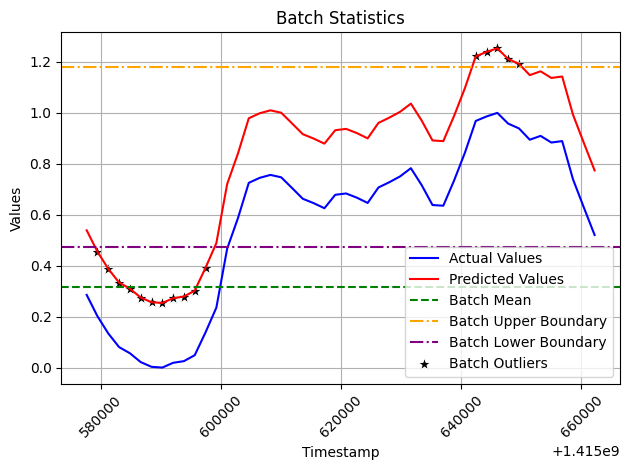


 Message Index: 134 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31414159591617863
Batch Mean Lower Bound w/ error rate: 0.2408631936808494
Batch Mean Upper Bound w/ error rate: 0.9476817844922514


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415664000          0.437957                  0.405991          10511   
1   1415665800          0.294080                  0.262114           7509   
2   1415667600          0.235034                  0.203067           6277   
3   1415669400          0.155714                  0.123748           4622   
4   1415671200          0.115599                  0.083633           3785   
5   1415673000          0.076538                  0.044572           2970   
6   1415674800          0.045961                  0.013995           2332   
7   1415676600          0.038005                  0.006039           2166   
8   1415678400          0.038628                  0.006662           2179   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


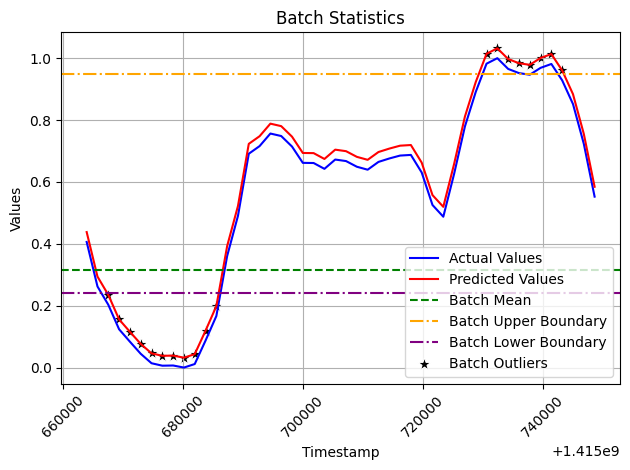


 Message Index: 135 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31817188645917965
Batch Mean Lower Bound w/ error rate: 0.3424986154865063
Batch Mean Upper Bound w/ error rate: 1.0583853600196607


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415750400          0.509560                  0.384262          10829   
1   1415752200          0.377787                  0.252488           7850   
2   1415754000          0.321255                  0.195957           6572   
3   1415755800          0.240572                  0.115274           4748   
4   1415757600          0.197621                  0.072323           3777   
5   1415759400          0.174531                  0.049233           3255   
6   1415761200          0.137374                  0.012076           2415   
7   1415763000          0.131358                  0.006060           2279   
8   1415764800          0.134632                  0.009333           2353   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


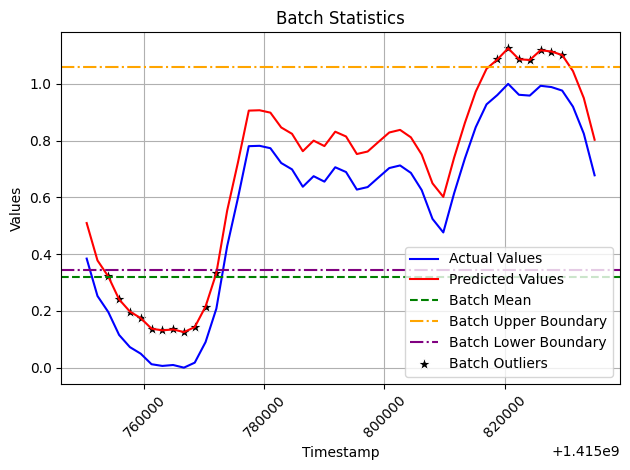


 Message Index: 136 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30248631717432206
Batch Mean Lower Bound w/ error rate: 0.3104713375287766
Batch Mean Upper Bound w/ error rate: 0.9910655511710011


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415836800          0.543126                  0.457272          13303   
1   1415838600          0.420980                  0.335126          10350   
2   1415840400          0.317571                  0.231717           7850   
3   1415842200          0.239436                  0.153582           5961   
4   1415844000          0.201795                  0.115941           5051   
5   1415845800          0.151415                  0.065561           3833   
6   1415847600          0.117207                  0.031353           3006   
7   1415849400          0.096898                  0.011044           2515   
8   1415851200          0.109348                  0.023494           2816   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


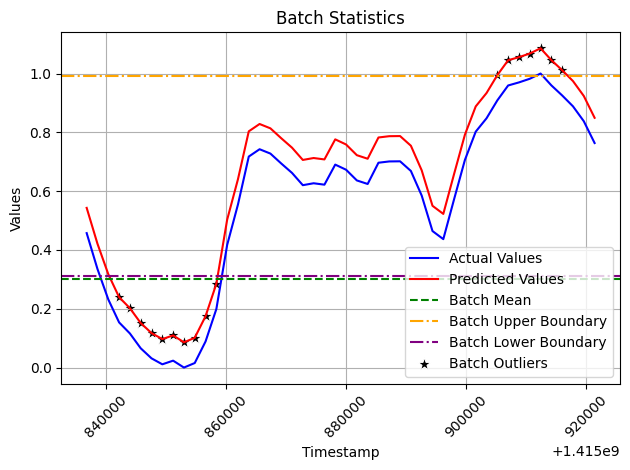


 Message Index: 137 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30365671825909973
Batch Mean Lower Bound w/ error rate: 0.43299605130556185
Batch Mean Upper Bound w/ error rate: 1.1162236673885362


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1415923200          0.808741                  0.617332          17932   
1   1415925000          0.673915                  0.482507          14668   
2   1415926800          0.563129                  0.371721          11986   
3   1415928600          0.448585                  0.257177           9213   
4   1415930400          0.365517                  0.174109           7202   
5   1415932200          0.297361                  0.105952           5552   
6   1415934000          0.275509                  0.084101           5023   
7   1415935800          0.229121                  0.037713           3900   
8   1415937600          0.234863                  0.043455           4039   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


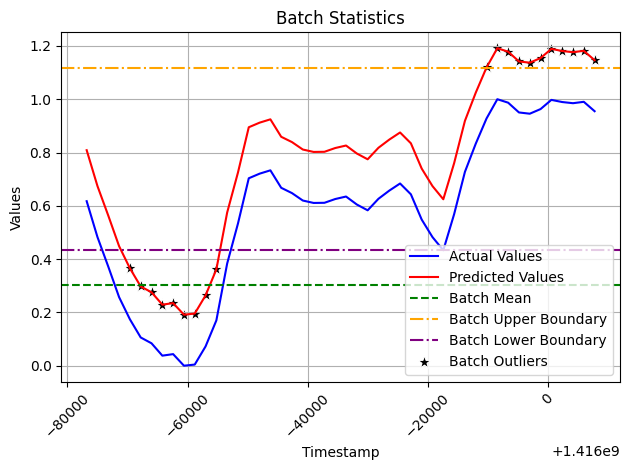


 Message Index: 138 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29055992991973295
Batch Mean Lower Bound w/ error rate: 0.32445930465998685
Batch Mean Upper Bound w/ error rate: 0.978219146979386


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416009600          0.919968                  0.874985          25034   
1   1416011400          0.882179                  0.837196          24103   
2   1416013200          0.824502                  0.779519          22682   
3   1416015000          0.741213                  0.696229          20630   
4   1416016800          0.684225                  0.639242          19226   
5   1416018600          0.575811                  0.530828          16555   
6   1416020400          0.475677                  0.430694          14088   
7   1416022200          0.410856                  0.365872          12491   
8   1416024000          0.318190                  0.273207          10208   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


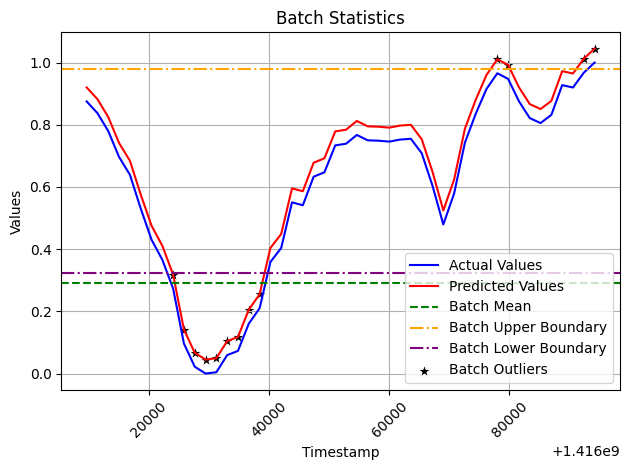


 Message Index: 139 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2625098039359045
Batch Mean Lower Bound w/ error rate: -0.42774505264929985
Batch Mean Upper Bound w/ error rate: 0.16290200620648534


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416096000          0.333762                  1.000000          26651   
1   1416097800          0.272053                  0.938291          25212   
2   1416099600          0.231785                  0.898023          24273   
3   1416101400          0.162829                  0.829066          22665   
4   1416103200          0.094387                  0.760624          21069   
5   1416105000         -0.002787                  0.663450          18803   
6   1416106800         -0.097689                  0.568549          16590   
7   1416108600         -0.191003                  0.475235          14414   
8   1416110400         -0.284746                  0.381491          12228   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


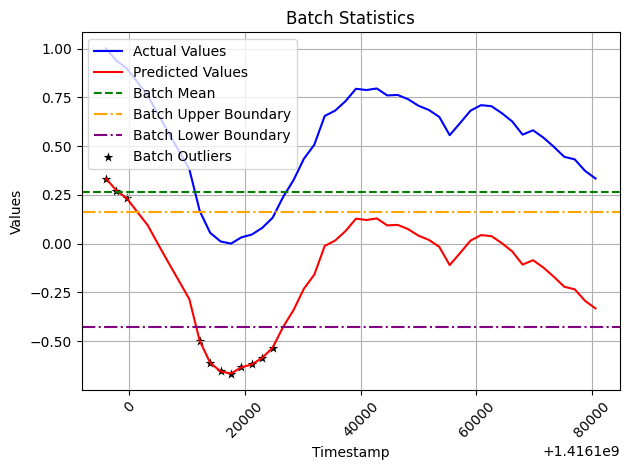


 Message Index: 140 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3256534727447826
Batch Mean Lower Bound w/ error rate: 0.40856605092848397
Batch Mean Upper Bound w/ error rate: 1.141286364604245


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416182400          0.500088                  0.333164           8317   
1   1416184200          0.376543                  0.209619           5887   
2   1416186000          0.304196                  0.137272           4464   
3   1416187800          0.251372                  0.084448           3425   
4   1416189600          0.227781                  0.060857           2961   
5   1416191400          0.195599                  0.028675           2328   
6   1416193200          0.179940                  0.013015           2020   
7   1416195000          0.166924                  0.000000           1764   
8   1416196800          0.185990                  0.019066           2139   
9   1416

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


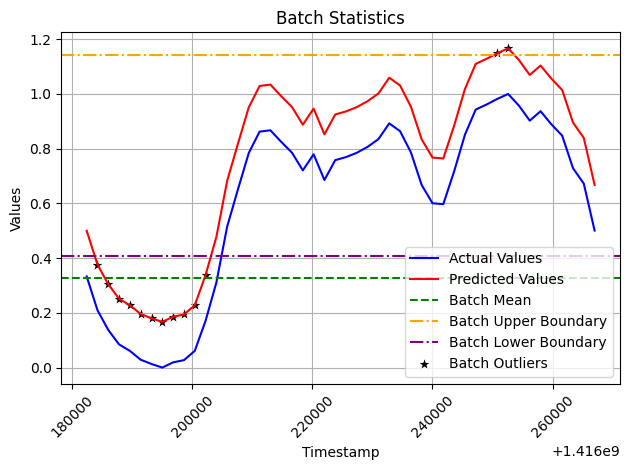


 Message Index: 141 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.32045940935733036
Batch Mean Lower Bound w/ error rate: 0.2909662528320913
Batch Mean Upper Bound w/ error rate: 1.0119999238860846


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416268800          0.412515                  0.336957           9828   
1   1416270600          0.315645                  0.240088           7529   
2   1416272400          0.258046                  0.182489           6162   
3   1416274200          0.179422                  0.103864           4296   
4   1416276000          0.128606                  0.053048           3090   
5   1416277800          0.098100                  0.022542           2366   
6   1416279600          0.086639                  0.011082           2094   
7   1416281400          0.075558                  0.000000           1831   
8   1416283200          0.082131                  0.006573           1987   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


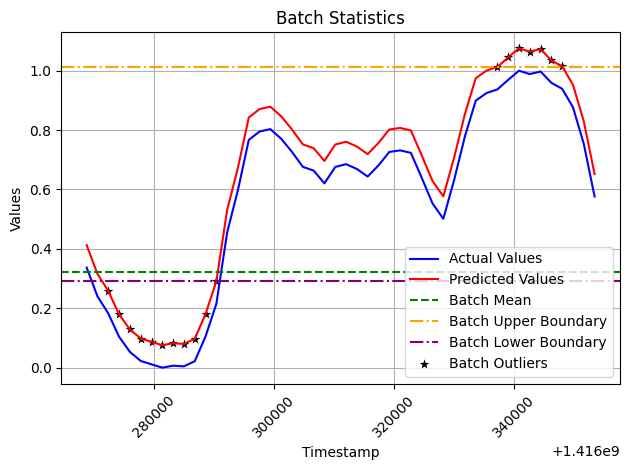


 Message Index: 142 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.32251717941372665
Batch Mean Lower Bound w/ error rate: 0.3790040837606211
Batch Mean Upper Bound w/ error rate: 1.1046677374415061


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416355200          0.586216                  0.446040          12079   
1   1416357000          0.429330                  0.289154           8561   
2   1416358800          0.343306                  0.203131           6632   
3   1416360600          0.263660                  0.123484           4846   
4   1416362400          0.225754                  0.085578           3996   
5   1416364200          0.196455                  0.056279           3339   
6   1416366000          0.163232                  0.023056           2594   
7   1416367800          0.150789                  0.010614           2315   
8   1416369600          0.157345                  0.017169           2462   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


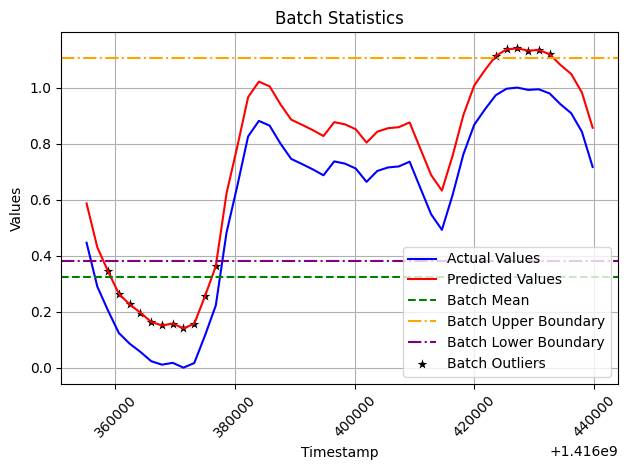


 Message Index: 143 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3118525468529139
Batch Mean Lower Bound w/ error rate: 0.34963542685120136
Batch Mean Upper Bound w/ error rate: 1.0513036572702577


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416441600          0.645603                  0.528747          14466   
1   1416443400          0.485632                  0.368777          10771   
2   1416445200          0.369995                  0.253139           8100   
3   1416447000          0.278038                  0.161183           5976   
4   1416448800          0.235784                  0.118928           5000   
5   1416450600          0.180671                  0.063815           3727   
6   1416452400          0.148503                  0.031648           2984   
7   1416454200          0.131186                  0.014330           2584   
8   1416456000          0.131489                  0.014633           2591   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


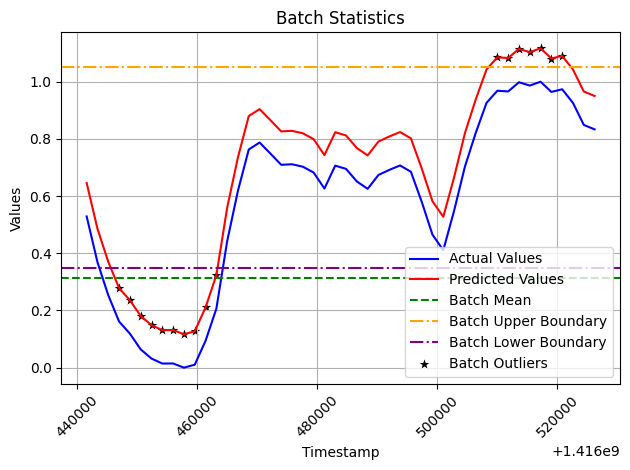


 Message Index: 144 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2941923037860195
Batch Mean Lower Bound w/ error rate: 0.3953874315666457
Batch Mean Upper Bound w/ error rate: 1.0573201150851896


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416528000          0.832458                  0.686229          19838   
1   1416529800          0.689148                  0.542920          16307   
2   1416531600          0.527494                  0.381265          12324   
3   1416533400          0.433415                  0.287187          10006   
4   1416535200          0.355125                  0.208896           8077   
5   1416537000          0.285236                  0.139007           6355   
6   1416538800          0.233935                  0.087706           5091   
7   1416540600          0.199680                  0.053452           4247   
8   1416542400          0.207513                  0.061285           4440   
9   1416

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


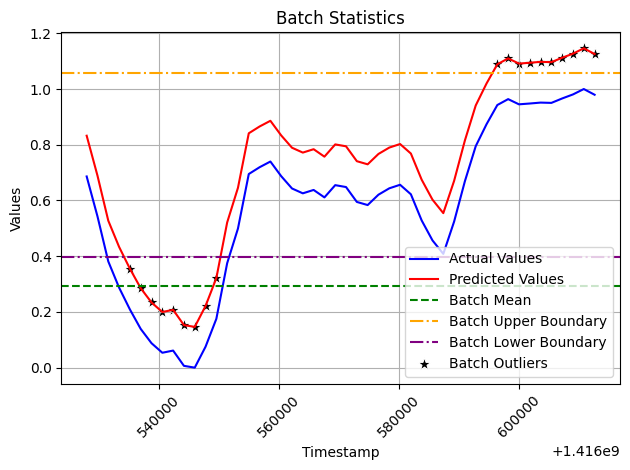


 Message Index: 145 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29095144018888464
Batch Mean Lower Bound w/ error rate: 0.3004986971091949
Batch Mean Upper Bound w/ error rate: 0.9551394375341853


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416614400          0.930112                  0.909616          26220   
1   1416616200          0.852612                  0.832116          24289   
2   1416618000          0.794818                  0.774322          22849   
3   1416619800          0.709812                  0.689316          20731   
4   1416621600          0.643590                  0.623094          19081   
5   1416623400          0.542931                  0.522435          16573   
6   1416625200          0.447210                  0.426714          14188   
7   1416627000          0.367943                  0.347447          12213   
8   1416628800          0.284945                  0.264449          10145   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


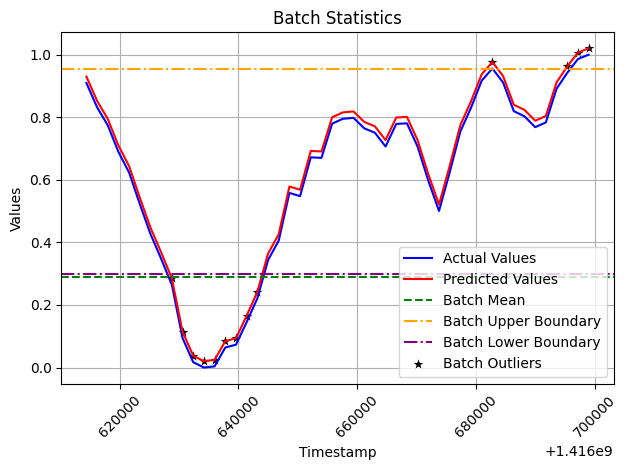


 Message Index: 146 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2540854593171347
Batch Mean Lower Bound w/ error rate: -0.5547331745152384
Batch Mean Upper Bound w/ error rate: 0.016959108948314705


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416700800          0.236250                  1.000000          27424   
1   1416702600          0.155607                  0.919357          25493   
2   1416704400          0.129839                  0.893589          24876   
3   1416706200          0.036417                  0.800167          22639   
4   1416708000         -0.031489                  0.732261          21013   
5   1416709800         -0.111380                  0.652370          19100   
6   1416711600         -0.213197                  0.550553          16662   
7   1416713400         -0.303947                  0.459804          14489   
8   1416715200         -0.406933                  0.356818          12023   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


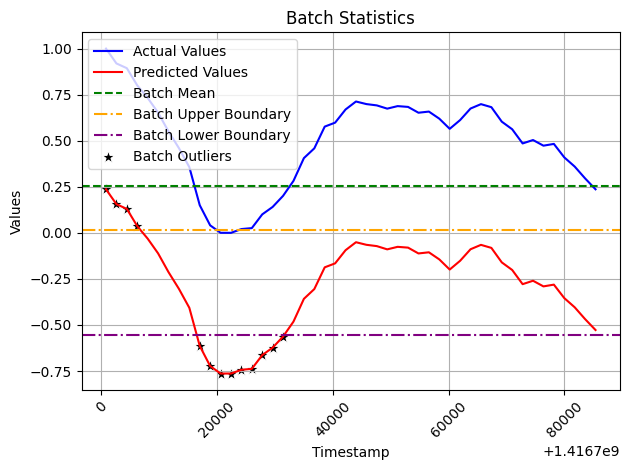


 Message Index: 147 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31303924043149106
Batch Mean Lower Bound w/ error rate: 0.48064825738963124
Batch Mean Upper Bound w/ error rate: 1.1849865483604862


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416787200          0.556343                  0.309341           8106   
1   1416789000          0.502211                  0.255209           7020   
2   1416790800          0.429536                  0.182534           5562   
3   1416792600          0.347541                  0.100538           3917   
4   1416794400          0.331341                  0.084339           3592   
5   1416796200          0.283738                  0.036736           2637   
6   1416798000          0.253532                  0.006530           2031   
7   1416799800          0.247002                  0.000000           1900   
8   1416801600          0.260560                  0.013558           2172   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


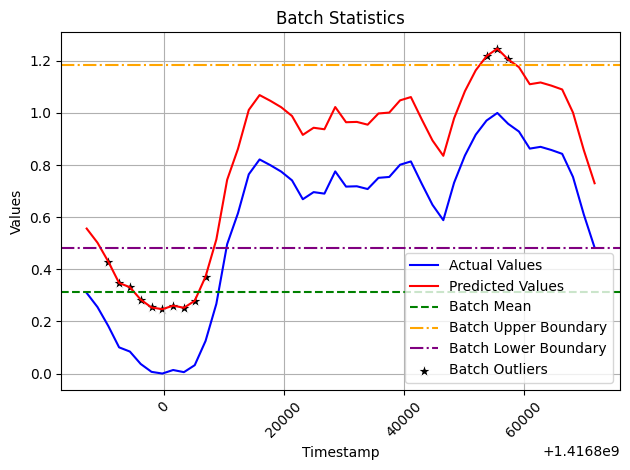


 Message Index: 148 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.33421282862849633
Batch Mean Lower Bound w/ error rate: 0.5130817214428744
Batch Mean Upper Bound w/ error rate: 1.2650605858569912


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416873600          0.678068                  0.423669          10091   
1   1416875400          0.544423                  0.290024           7575   
2   1416877200          0.459540                  0.205142           5977   
3   1416879000          0.391974                  0.137576           4705   
4   1416880800          0.343690                  0.089291           3796   
5   1416882600          0.295777                  0.041379           2894   
6   1416884400          0.273308                  0.018910           2471   
7   1416886200          0.254398                  0.000000           2115   
8   1416888000          0.273468                  0.019069           2474   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


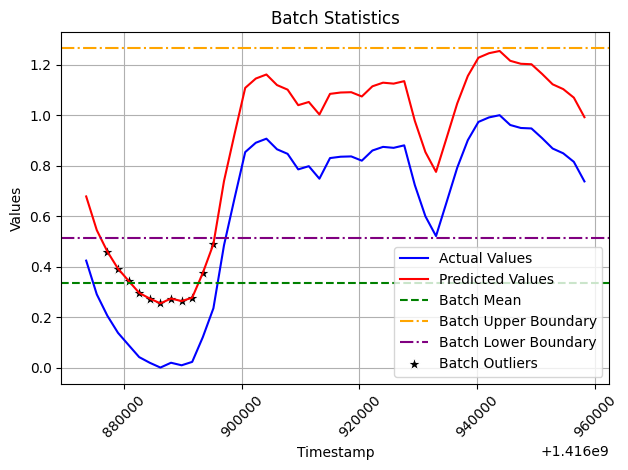


 Message Index: 149 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31334236230703033
Batch Mean Lower Bound w/ error rate: 0.06262261173291472
Batch Mean Upper Bound w/ error rate: 0.7676429269237329


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1416960000          0.333407                  0.527270          13400   
1   1416961800          0.207602                  0.401465          10978   
2   1416963600          0.084758                  0.278620           8613   
3   1416965400         -0.027802                  0.166061           6446   
4   1416967200         -0.092263                  0.101600           5205   
5   1416969000         -0.148724                  0.045138           4118   
6   1416970800         -0.180305                  0.013557           3510   
7   1416972600         -0.193862                  0.000000           3249   
8   1416974400         -0.170540                  0.023322           3698   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


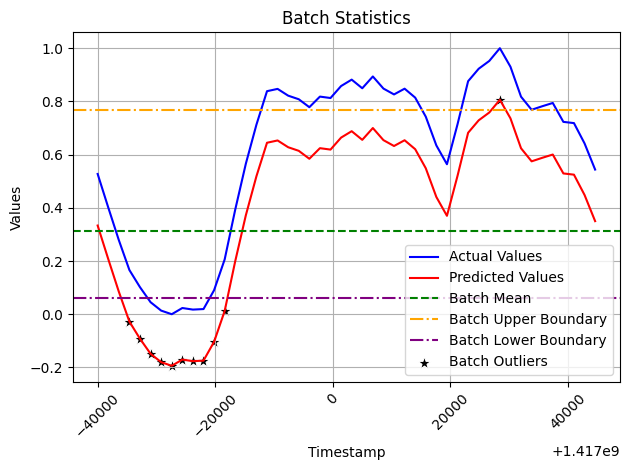


 Message Index: 150 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3052417928104256
Batch Mean Lower Bound w/ error rate: 0.40311305181082535
Batch Mean Upper Bound w/ error rate: 1.089907085634283


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417046400          0.962981                  0.824005          13522   
1   1417048200          0.781456                  0.642480          11323   
2   1417050000          0.698246                  0.559270          10315   
3   1417051800          0.578963                  0.439987           8870   
4   1417053600          0.519528                  0.380551           8150   
5   1417055400          0.441849                  0.302873           7209   
6   1417057200          0.343533                  0.204557           6018   
7   1417059000          0.327106                  0.188129           5819   
8   1417060800          0.283520                  0.144544           5291   
9   1417

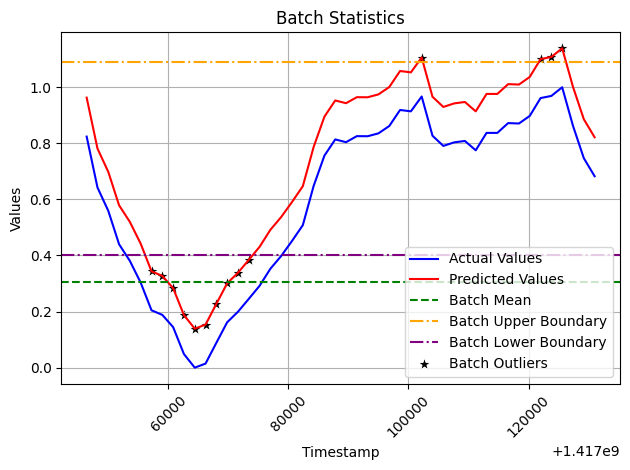


 Message Index: 151 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3255383297273913
Batch Mean Lower Bound w/ error rate: 0.237248267792326
Batch Mean Upper Bound w/ error rate: 0.9697095096789563


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417132800          0.449839                  0.372394           9653   
1   1417134600          0.360380                  0.282935           7791   
2   1417136400          0.315747                  0.238301           6862   
3   1417138200          0.257229                  0.179783           5644   
4   1417140000          0.208944                  0.131498           4639   
5   1417141800          0.162533                  0.085087           3673   
6   1417143600          0.127556                  0.050111           2945   
7   1417145400          0.124193                  0.046747           2875   
8   1417147200          0.124577                  0.047132           2883   
9   14171

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


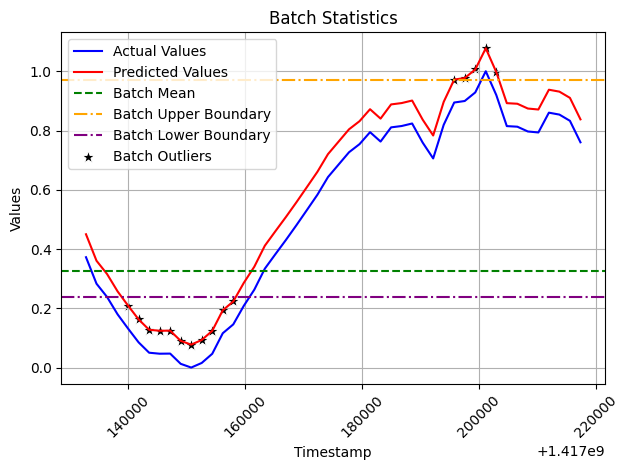


 Message Index: 152 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30441212321399364
Batch Mean Lower Bound w/ error rate: 0.3339503789388641
Batch Mean Upper Bound w/ error rate: 1.0188776561703499


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417219200          0.741398                  0.634117          16089   
1   1417221000          0.671216                  0.563935          14561   
2   1417222800          0.612930                  0.505649          13292   
3   1417224600          0.553588                  0.446307          12000   
4   1417226400          0.506142                  0.398861          10967   
5   1417228200          0.450107                  0.342826           9747   
6   1417230000          0.395403                  0.288122           8556   
7   1417231800          0.385574                  0.278293           8342   
8   1417233600          0.332111                  0.224830           7178   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


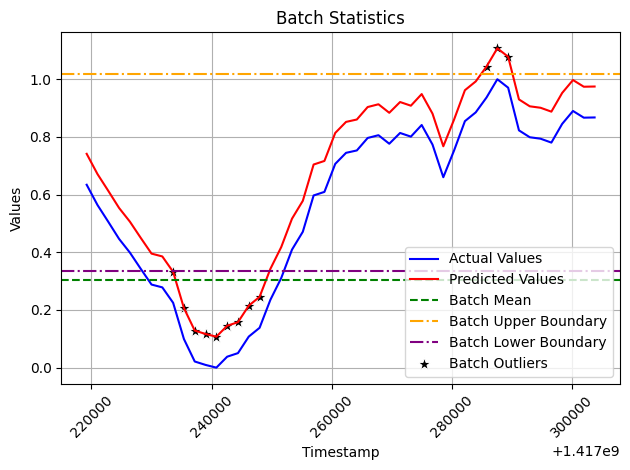


 Message Index: 153 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.29910950182464907
Batch Mean Lower Bound w/ error rate: -0.2616988085192502
Batch Mean Upper Bound w/ error rate: 0.4112975705862102


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417305600          0.476696                  1.000000          20149   
1   1417307400          0.383184                  0.906488          18555   
2   1417309200          0.337015                  0.860319          17768   
3   1417311000          0.210299                  0.733603          15608   
4   1417312800          0.172636                  0.695940          14966   
5   1417314600          0.061643                  0.584947          13074   
6   1417316400         -0.040551                  0.482753          11332   
7   1417318200         -0.120746                  0.402558           9965   
8   1417320000         -0.167561                  0.355743           9167   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


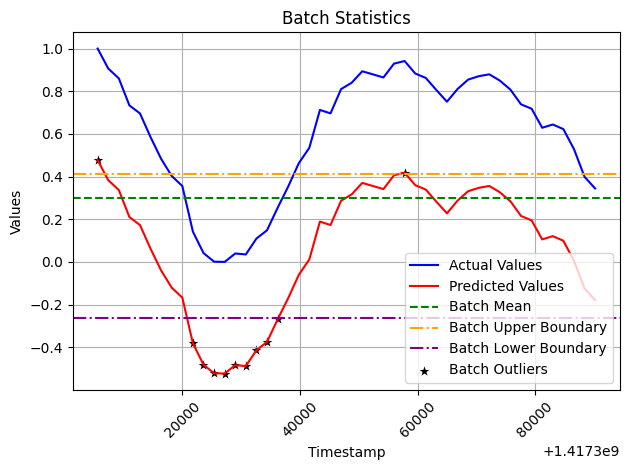


 Message Index: 154 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3181086470547486
Batch Mean Lower Bound w/ error rate: 0.37471042216889944
Batch Mean Upper Bound w/ error rate: 1.0904548780420837


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417392000          0.446599                  0.290259           7706   
1   1417393800          0.340772                  0.184432           5494   
2   1417395600          0.281208                  0.124868           4249   
3   1417397400          0.216239                  0.059899           2891   
4   1417399200          0.203847                  0.047507           2632   
5   1417401000          0.182797                  0.026457           2192   
6   1417402800          0.156771                  0.000431           1648   
7   1417404600          0.156340                  0.000000           1639   
8   1417406400          0.169449                  0.013109           1913   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


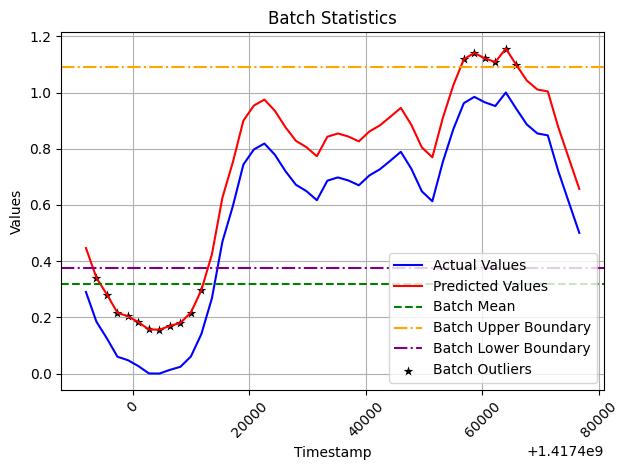


 Message Index: 155 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.33085081295776747
Batch Mean Lower Bound w/ error rate: 0.3319941340959302
Batch Mean Upper Bound w/ error rate: 1.076408463250907


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417478400          0.468877                  0.367476           9805   
1   1417480200          0.346855                  0.245454           7121   
2   1417482000          0.251292                  0.149891           5019   
3   1417483800          0.196873                  0.095472           3822   
4   1417485600          0.171687                  0.070286           3268   
5   1417487400          0.125906                  0.024504           2261   
6   1417489200          0.107357                  0.005956           1853   
7   1417491000          0.101401                  0.000000           1722   
8   1417492800          0.117541                  0.016139           2077   
9   1417

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


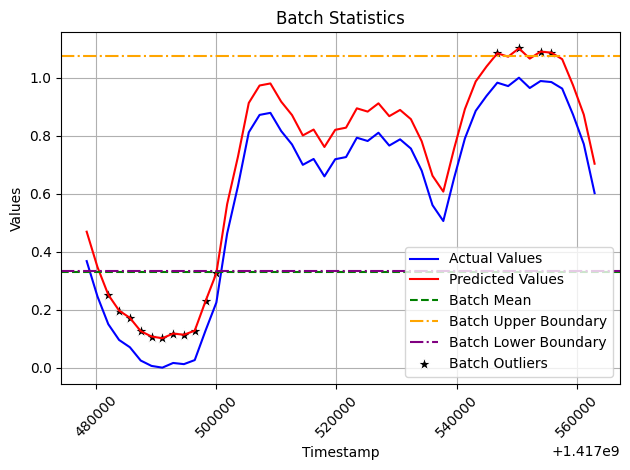


 Message Index: 156 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.34098090448259893
Batch Mean Lower Bound w/ error rate: 0.46201792786560675
Batch Mean Upper Bound w/ error rate: 1.2292249629514544


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417564800          0.723475                  0.522293          12558   
1   1417566600          0.539430                  0.338249           8876   
2   1417568400          0.426964                  0.225782           6626   
3   1417570200          0.341989                  0.140808           4926   
4   1417572000          0.298002                  0.096821           4046   
5   1417573800          0.254116                  0.052934           3168   
6   1417575600          0.230323                  0.029141           2692   
7   1417577400          0.207580                  0.006398           2237   
8   1417579200          0.214927                  0.013746           2384   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


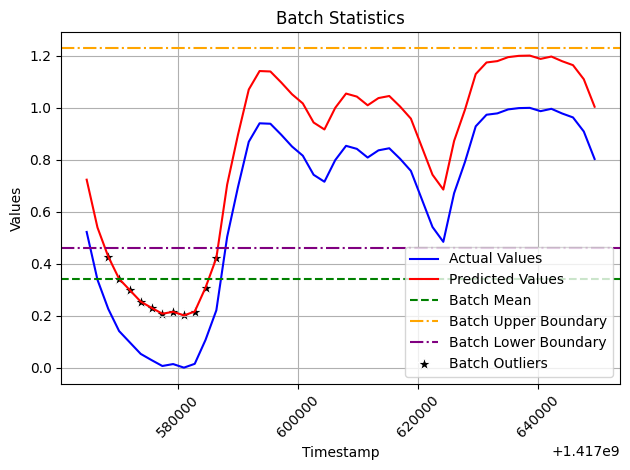


 Message Index: 157 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.32431220895135876
Batch Mean Lower Bound w/ error rate: 0.34994423565828503
Batch Mean Upper Bound w/ error rate: 1.0796467057988424


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417651200          0.669909                  0.584538          14846   
1   1417653000          0.510850                  0.425480          11480   
2   1417654800          0.390776                  0.305406           8939   
3   1417656600          0.283981                  0.198611           6679   
4   1417658400          0.212910                  0.127540           5175   
5   1417660200          0.147935                  0.062565           3800   
6   1417662000          0.116511                  0.031141           3135   
7   1417663800          0.094585                  0.009215           2671   
8   1417665600          0.102713                  0.017342           2843   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


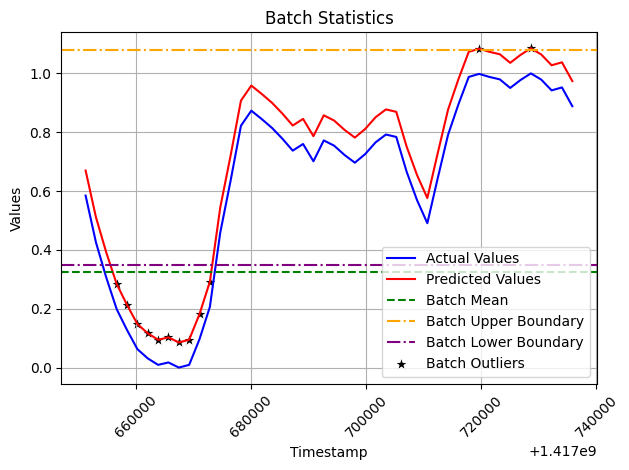


 Message Index: 158 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2988613526189222
Batch Mean Lower Bound w/ error rate: 0.24821206266111961
Batch Mean Upper Bound w/ error rate: 0.9206501060536946


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417737600          0.669057                  0.676274          19300   
1   1417739400          0.540164                  0.547381          16241   
2   1417741200          0.402171                  0.409388          12966   
3   1417743000          0.290765                  0.297982          10322   
4   1417744800          0.199668                  0.206885           8160   
5   1417746600          0.134400                  0.141617           6611   
6   1417748400          0.083796                  0.091013           5410   
7   1417750200          0.043472                  0.050689           4453   
8   1417752000          0.036477                  0.043694           4287   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


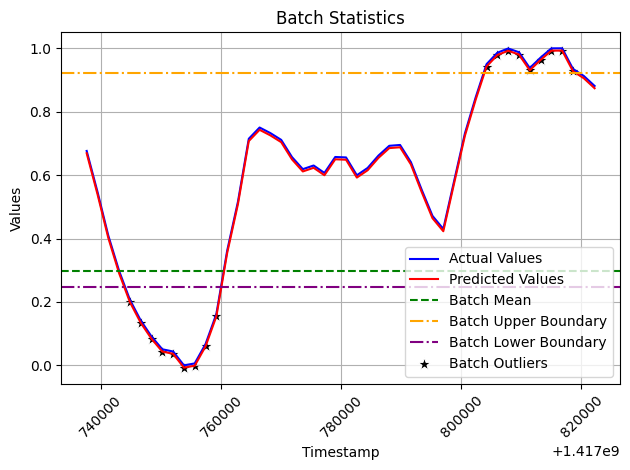


 Message Index: 159 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30491534158590655
Batch Mean Lower Bound w/ error rate: 0.4042791458224065
Batch Mean Upper Bound w/ error rate: 1.0903386643906963


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417824000          0.925909                  0.807171          22925   
1   1417825800          0.895701                  0.776964          22187   
2   1417827600          0.867295                  0.748557          21493   
3   1417829400          0.766112                  0.647374          19021   
4   1417831200          0.724689                  0.605951          18009   
5   1417833000          0.633698                  0.514961          15786   
6   1417834800          0.524329                  0.405591          13114   
7   1417836600          0.419012                  0.300274          10541   
8   1417838400          0.368052                  0.249314           9296   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


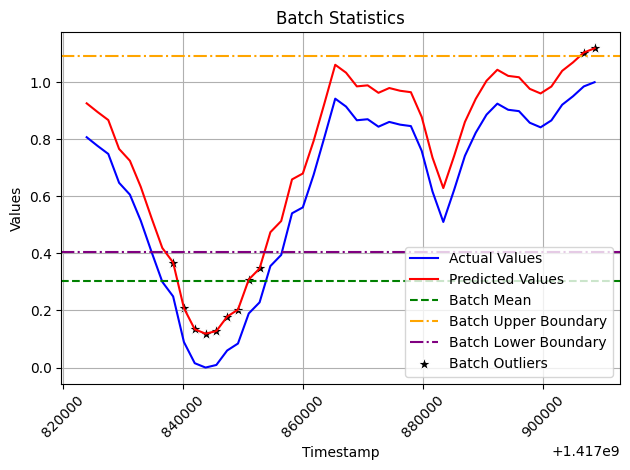


 Message Index: 160 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.27960905653011886
Batch Mean Lower Bound w/ error rate: -0.4181492834740662
Batch Mean Upper Bound w/ error rate: 0.21097109371870126


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417910400          0.328004                  1.000000          26695   
1   1417912200          0.282550                  0.954545          25626   
2   1417914000          0.225529                  0.897525          24285   
3   1417915800          0.138957                  0.810953          22249   
4   1417917600          0.074836                  0.746832          20741   
5   1417919400         -0.018156                  0.653840          18554   
6   1417921200         -0.136534                  0.535462          15770   
7   1417923000         -0.212816                  0.459180          13976   
8   1417924800         -0.323709                  0.348286          11368   
9   1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


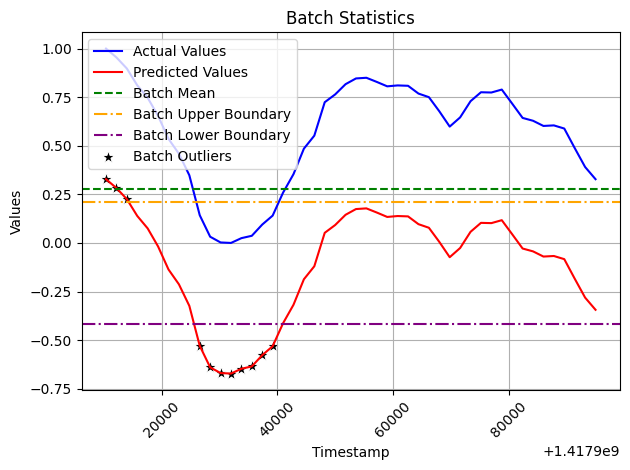


 Message Index: 161 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3293402339095559
Batch Mean Lower Bound w/ error rate: 0.4565050277194467
Batch Mean Upper Bound w/ error rate: 1.1975205540159475


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1417996800          0.520349                  0.294352           8141   
1   1417998600          0.440193                  0.214196           6411   
2   1418000400          0.363790                  0.137794           4762   
3   1418002200          0.310693                  0.084696           3616   
4   1418004000          0.288175                  0.062179           3130   
5   1418005800          0.248468                  0.022471           2273   
6   1418007600          0.237256                  0.011259           2031   
7   1418009400          0.225997                  0.000000           1788   
8   1418011200          0.245225                  0.019228           2203   
9   1418

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


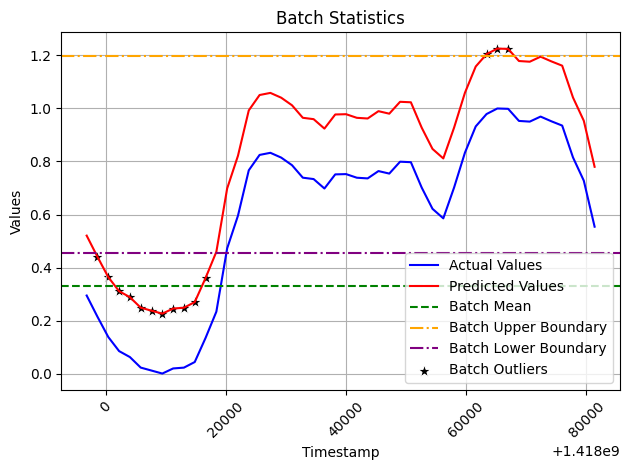


 Message Index: 162 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3220927361507252
Batch Mean Lower Bound w/ error rate: 0.3835956018877969
Batch Mean Upper Bound w/ error rate: 1.1083042582269287


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1418083200          0.578213                  0.436788          11339   
1   1418085000          0.452928                  0.311503           8699   
2   1418086800          0.362618                  0.221194           6796   
3   1418088600          0.288586                  0.147162           5236   
4   1418090400          0.220439                  0.079015           3800   
5   1418092200          0.184467                  0.043043           3042   
6   1418094000          0.160265                  0.018840           2532   
7   1418095800          0.147262                  0.005837           2258   
8   1418097600          0.145079                  0.003654           2212   
9   1418

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


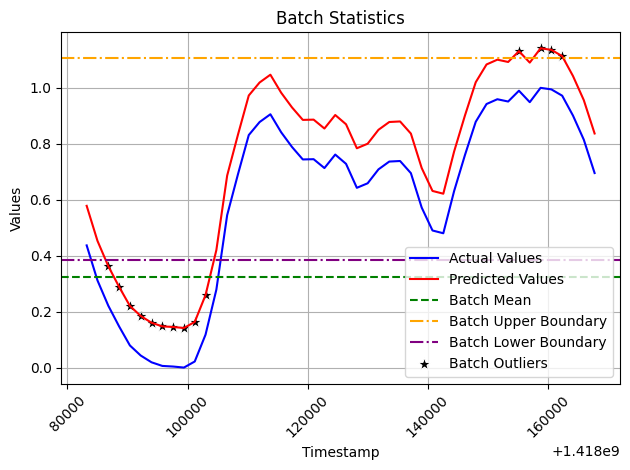


 Message Index: 163 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31280011781915934
Batch Mean Lower Bound w/ error rate: 0.3244628373272268
Batch Mean Upper Bound w/ error rate: 1.0282631024203353


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1418169600          0.631477                  0.539177          14252   
1   1418171400          0.444715                  0.352415          10138   
2   1418173200          0.340711                  0.248411           7847   
3   1418175000          0.246966                  0.154667           5782   
4   1418176800          0.209242                  0.116942           4951   
5   1418178600          0.152269                  0.059969           3696   
6   1418180400          0.113091                  0.020792           2833   
7   1418182200          0.092300                  0.000000           2375   
8   1418184000          0.099472                  0.007173           2533   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


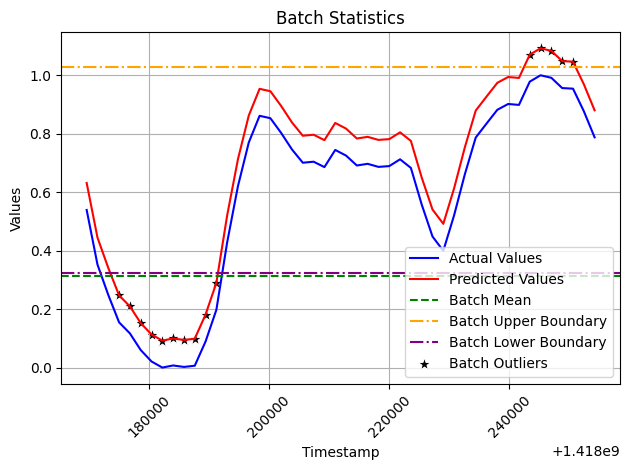


 Message Index: 164 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31797894856991754
Batch Mean Lower Bound w/ error rate: 0.38956294220164045
Batch Mean Upper Bound w/ error rate: 1.1050155764839549


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1418256000          0.800399                  0.683987          17270   
1   1418257800          0.621157                  0.504745          13379   
2   1418259600          0.479965                  0.363553          10314   
3   1418261400          0.348953                  0.232541           7470   
4   1418263200          0.283033                  0.166621           6039   
5   1418265000          0.203937                  0.087525           4322   
6   1418266800          0.164275                  0.047863           3461   
7   1418268600          0.137142                  0.020730           2872   
8   1418270400          0.136313                  0.019900           2854   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


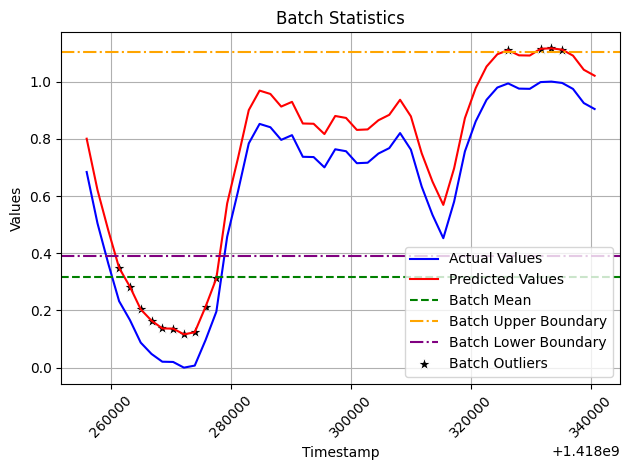


 Message Index: 165 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2841637094734511
Batch Mean Lower Bound w/ error rate: 0.33171373361877105
Batch Mean Upper Bound w/ error rate: 0.9710820799340361


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1418342400          0.793016                  0.740950          20667   
1   1418344200          0.733516                  0.681450          19265   
2   1418346000          0.603099                  0.551033          16192   
3   1418347800          0.459739                  0.407673          12814   
4   1418349600          0.357714                  0.305649          10410   
5   1418351400          0.264687                  0.212621           8218   
6   1418353200          0.184774                  0.132708           6335   
7   1418355000          0.144117                  0.092051           5377   
8   1418356800          0.113645                  0.061580           4659   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


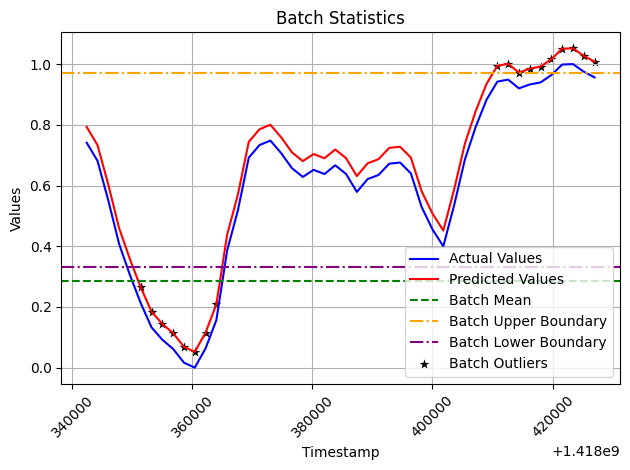


 Message Index: 166 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3033625393146161
Batch Mean Lower Bound w/ error rate: 0.341570977909778
Batch Mean Upper Bound w/ error rate: 1.0241366913676642


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1418428800          0.963862                  0.924618          24743   
1   1418430600          0.943997                  0.904754          24285   
2   1418432400          0.880716                  0.841473          22826   
3   1418434200          0.813055                  0.773812          21266   
4   1418436000          0.754111                  0.714868          19907   
5   1418437800          0.630326                  0.591083          17053   
6   1418439600          0.516256                  0.477012          14423   
7   1418441400          0.426908                  0.387665          12363   
8   1418443200          0.350442                  0.311199          10600   
9   14184

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


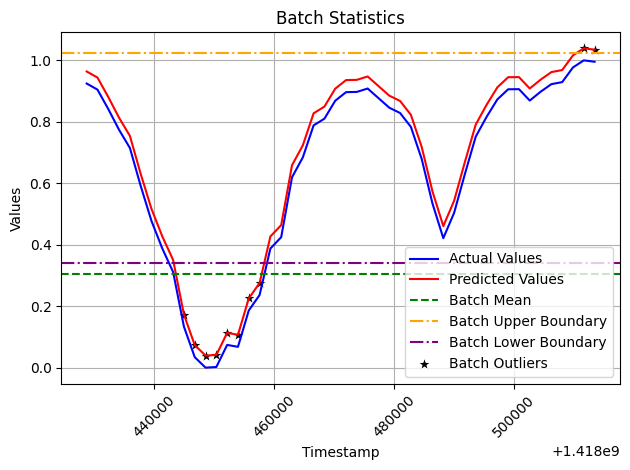


 Message Index: 167 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.2732210033640515
Batch Mean Lower Bound w/ error rate: -0.430743069375887
Batch Mean Upper Bound w/ error rate: 0.18400418819322883


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1418515200          0.331489                  1.000000          26065   
1   1418517000          0.317238                  0.985749          25745   
2   1418518800          0.241884                  0.910395          24053   
3   1418520600          0.163279                  0.831789          22288   
4   1418522400          0.117630                  0.786141          21263   
5   1418524200          0.000680                  0.669190          18637   
6   1418526000         -0.112040                  0.556471          16106   
7   1418527800         -0.223245                  0.445266          13609   
8   1418529600         -0.304433                  0.364078          11786   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


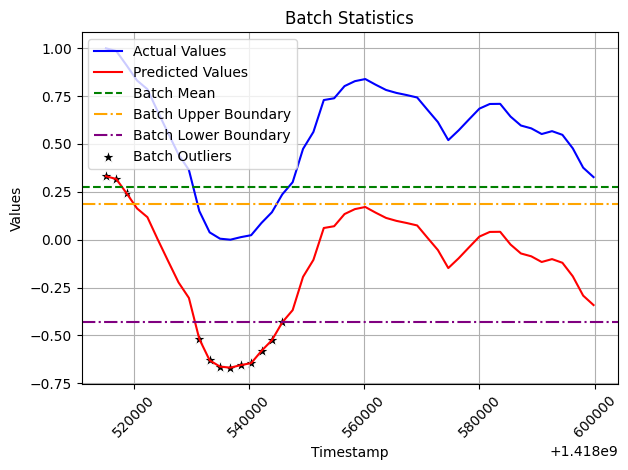


 Message Index: 168 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.31610817305719147
Batch Mean Lower Bound w/ error rate: 0.47518612751502237
Batch Mean Upper Bound w/ error rate: 1.1864295168937031


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1418601600          0.594865                  0.349751           9228   
1   1418603400          0.474100                  0.228986           6754   
2   1418605200          0.399708                  0.154593           5230   
3   1418607000          0.342498                  0.097384           4058   
4   1418608800          0.309695                  0.064581           3386   
5   1418610600          0.283726                  0.038612           2854   
6   1418612400          0.246334                  0.001220           2088   
7   1418614200          0.245114                  0.000000           2063   
8   1418616000          0.270009                  0.024895           2573   
9   14

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


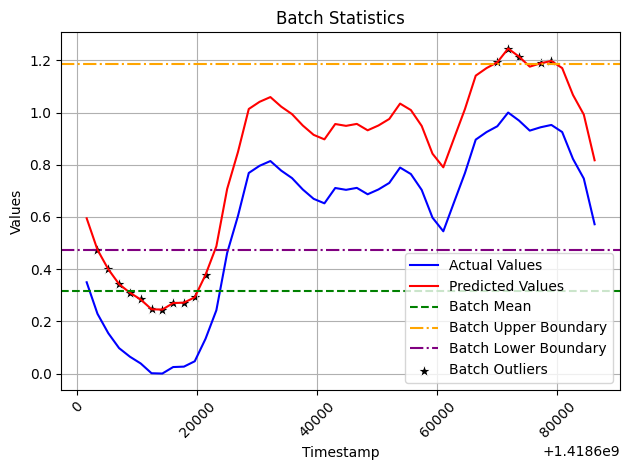


 Message Index: 169 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3091877703984875
Batch Mean Lower Bound w/ error rate: 0.34591007591246714
Batch Mean Upper Bound w/ error rate: 1.041582559309064


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1418688000          0.540940                  0.418238          11608   
1   1418689800          0.413938                  0.291237           8753   
2   1418691600          0.334134                  0.211432           6959   
3   1418693400          0.261759                  0.139057           5332   
4   1418695200          0.221056                  0.098354           4417   
5   1418697000          0.194143                  0.071441           3812   
6   1418698800          0.148458                  0.025756           2785   
7   1418700600          0.123769                  0.001068           2230   
8   1418702400          0.130575                  0.007874           2383   
9   1418

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


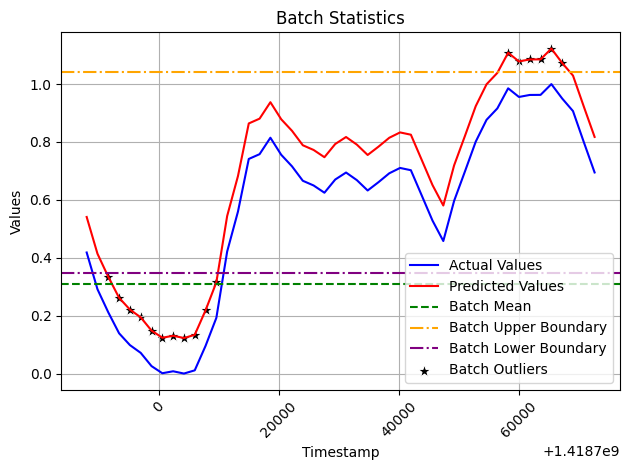


 Message Index: 170 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.30838007761100555
Batch Mean Lower Bound w/ error rate: 0.3566527423174707
Batch Mean Upper Bound w/ error rate: 1.0505079169422333


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1418774400          0.652172                  0.530420          14522   
1   1418776200          0.494577                  0.372825          10981   
2   1418778000          0.383891                  0.262139           8494   
3   1418779800          0.305783                  0.184031           6739   
4   1418781600          0.253400                  0.131648           5562   
5   1418783400          0.188110                  0.066358           4095   
6   1418785200          0.149523                  0.027772           3228   
7   1418787000          0.130519                  0.008768           2801   
8   1418788800          0.135148                  0.013396           2905   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


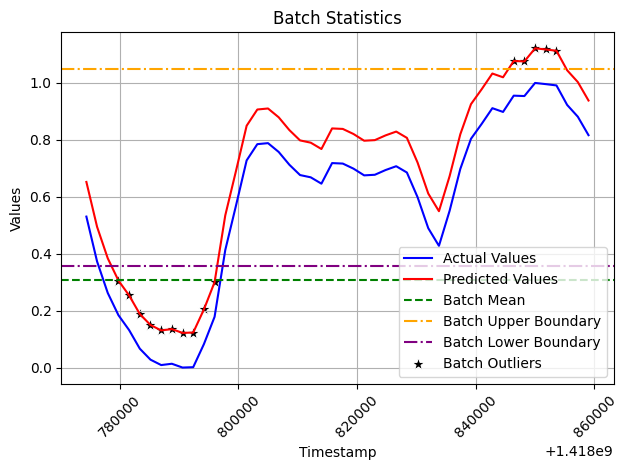


 Message Index: 171 



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['seasonal']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)




----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1418860800          0.741144                  0.667294          18285   
1   1418862600          0.593265                  0.519415          14827   
2   1418864400          0.425500                  0.351651          10904   
3   1418866200          0.339843                  0.265994           8901   
4   1418868000          0.248499                  0.174649           6765   
5   1418869800          0.181060                  0.107210           5188   
6   1418871600          0.122686                  0.048837           3823   
7   1418873400          0.109900                  0.036050           3524   
8   1418875200          0.105196                  0.031346           3414   
9   141

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


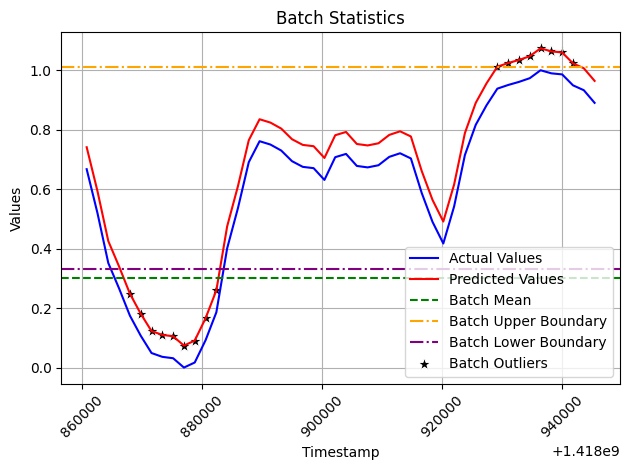

In [24]:
batch_conf_interval = 0.15
train_bayesianarima_model(batch_conf_interval)

# Training Results

In [25]:
global_anomalies_detected[batch_conf_interval] = sum(value for value in count_of_anomalies_detected.values())
print(global_anomalies_detected) ## total anomalies detected in the batch
print(100* global_anomalies_detected[batch_conf_interval]/len(x_train_df)) ## percentage of anomalies detected in the batch
print ("Actual Anomalies: ", actualanomalies_detected_index)
print("Batches with TP:", [key for key, value in tp_anomalies_detected_index.items() if value == 1])
print('Performance of the algorithm at conf:',batch_conf_interval , ' is :\n')
print("Model's MSE Mean {:.2%}".format(statistics.mean(performance_metrics_mse.values())))
print("Model's RMSE Mean {:.2%}".format(statistics.mean(performance_metrics_rmse.values())))
print("Model's MAE Mean {:.2%}".format(statistics.mean(performance_metrics_mae.values())))
print("Model's Mean Accuracy: {:.2%}".format(statistics.mean(performance_metrics_accuracy.values())))
print("Model's Mean Precision: {:.2%}".format(statistics.mean(performance_metrics_precision.values())))
print("Model's Mean Recall: {:.2%}".format(statistics.mean(performance_metrics_recall.values())))
print("Model's Mean F1 Score: {:.2%}".format(statistics.mean(performance_metrics_f1_score.values())))

{0.15: 2644}
32.025193798449614
Actual Anomalies:  {124: 1, 150: 1}
Batches with TP: [124, 150]
Performance of the algorithm at conf: 0.15  is :

Model's MSE Mean 7.11%
Model's RMSE Mean 18.59%
Model's MAE Mean 18.59%
Model's Mean Accuracy: 67.81%
Model's Mean Precision: 0.10%
Model's Mean Recall: 1.17%
Model's Mean F1 Score: 0.18%


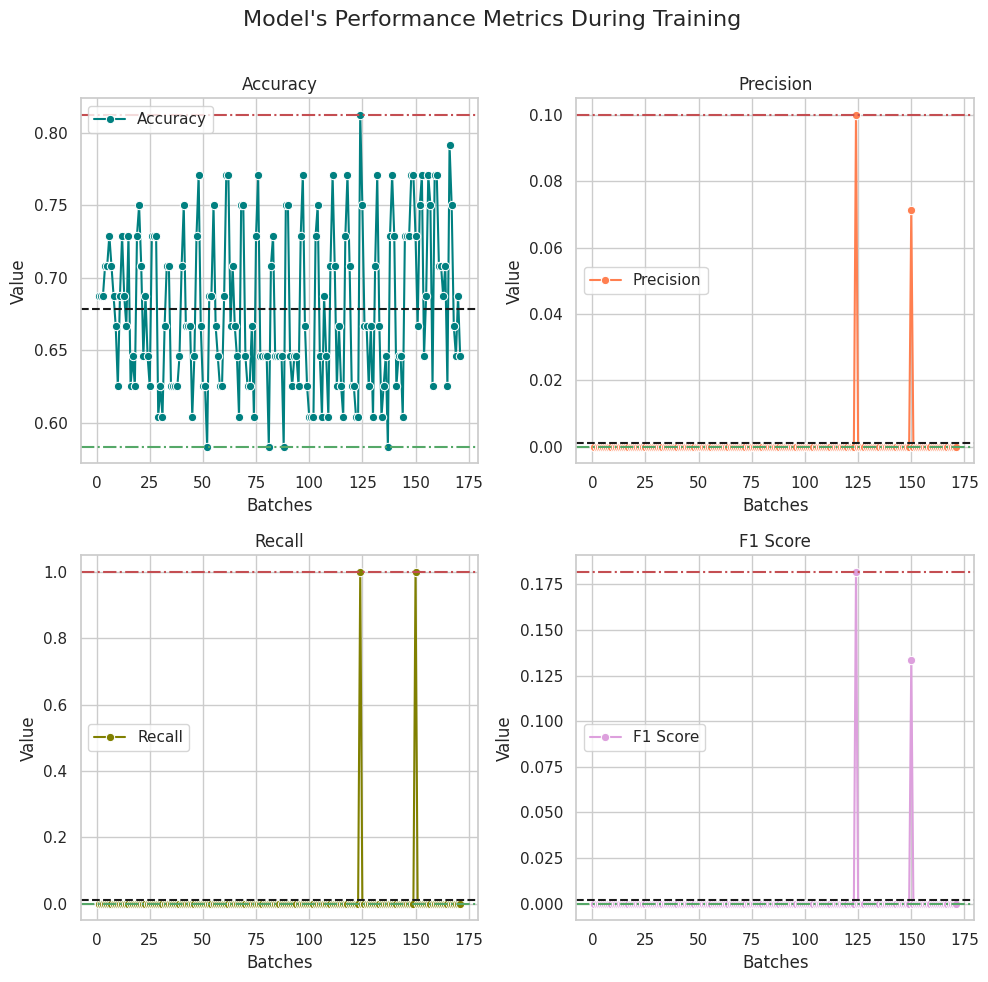

In [26]:
keys = list(performance_metrics_accuracy.keys())
values = [
    list(performance_metrics_accuracy.values()),
    list(performance_metrics_precision.values()),
    list(performance_metrics_recall.values()),
    list(performance_metrics_f1_score.values())
]
titles = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['teal', 'coral', 'olive', 'plum']

# Calculate mean, max, and min for each metric
means = [np.mean(val) for val in values]
maxs = [np.max(val) for val in values]
mins = [np.min(val) for val in values]

# Set Seaborn style
sns.set(style="whitegrid")

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
fig.suptitle('Model\'s Performance Metrics During Training', fontsize=16)

# Plot each metric on a subplot
for i, (ax, value, title, color, mean, max_val, min_val) in enumerate(zip(axs.flat, values, titles, colors, means, maxs, mins)):
    sns.lineplot(x=keys, y=value, marker='o', label=title, color=color, ax=ax)
    ax.axhline(y=mean, linestyle='--', color='k', label='Mean')
    ax.axhline(y=max_val, linestyle='-.', color='r', label='Max')
    ax.axhline(y=min_val, linestyle='-.', color='g', label='Min')
    ax.set_title(title)
    ax.set_xlabel('Batches')
    ax.set_ylabel('Value')


# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust the layout to avoid the suptitle getting cut off
plt.show()


#Testing Phase

In [27]:

global_anomalies_detected_in_test = {}
confusionmatrix_test = {}

count_of_anomalies_detected_in_test = {}
actualanomalies_detected_index_in_test = {}
tp_anomalies_detected_index_in_test = {}
global_minima_maxima_index_count_in_test  = {}

performance_metrics_mse_test = {}
performance_metrics_rmse_test = {}
performance_metrics_mae_test = {}

performance_metrics_accuracy_test = {}
performance_metrics_f1_score_test = {}
performance_metrics_precision_test = {}
performance_metrics_recall_test = {}

In [28]:
online_test_ds = tfio.experimental.streaming.KafkaBatchIODataset(
    topics=["dataanomaly-testing"],
    group_id="cgonline",
    servers="127.0.0.1:9092",
    stream_timeout=100000,                                                           # in milliseconds, to block indefinitely,set it -1
    configuration=[
        "session.timeout.ms=7000",
        "max.poll.interval.ms=8000",
        "auto.offset.reset=earliest"
    ],
)

In [29]:
def prediction_for_testingset_bayesian_arima(loaded_model, minids_message, minids_key, current_message_count, batch_conf_interval):

                  timestamp_column = minids_message[:, 0]
                  values_column1 = minids_message[:, 1]

                  min_val = np.min(values_column1)
                  max_val = np.max(values_column1)
                  values_column = (values_column1 - min_val) / (max_val - min_val)                    #normalizing data

                  y_test_labels = minids_key

                  forecast_steps = batch_size                                                         # Adjust this to the number of steps you want to forecast
                  forecast = loaded_model.get_forecast(steps =forecast_steps)                         #,exog= timestamp_column[-forecast_steps:]

                  predicted_values = forecast.predicted_mean
                  residuals = predicted_values - values_column[-forecast_steps:]

                  ###-------------------------------------------------------------------------------
                  #### Calculate the anomaly based on the batch mean
                  batch_conf_interval_multiplier = batch_conf_interval
                  batch_data = calculating_batch_confidence_bound(timestamp_column, predicted_values, batch_conf_interval_multiplier)
                  batch_data_mean =  batch_data[0]
                  batch_data_lower =  batch_data[1]
                  batch_data_upper =  batch_data[2]

                  batch_anomaly = 0.0

                  anomalies_conf_batch = (predicted_values < batch_data_lower) | (predicted_values > batch_data_upper)
                  result_df_test = pd.DataFrame({
                      'Timestamp': timestamp_column[-forecast_steps:],
                      'Predicted Values': predicted_values,
                      'Actual Values Normalized': values_column[-forecast_steps:],
                      'Actual Values': values_column1[-forecast_steps:],
                      'Difference': residuals,
                      'Anomaly Label Actual': y_test_labels,
                      'Detected Anomaly - Batch': anomalies_conf_batch,                                         # Anomaly by batch
                      'Lower Threshold Batch': batch_data_lower,
                      'Upper Threshold Batch': batch_data_upper,
                       'Batch Mean': batch_data_mean,
                      'Batch Anomaly': batch_anomaly
                  })


                  print(result_df_test[['Timestamp',
                                        'Predicted Values',
                                        'Actual Values Normalized',
                                         'Actual Values',
                                        'Detected Anomaly - Batch',
                                        'Anomaly Label Actual',
                                        'Batch Mean']])

                  #count of anomalies in each batch
                  anomalies_detected_in_test_batch = result_df_test[result_df_test['Detected Anomaly - Batch'] == True]            #all local anomalies detected


                  if not anomalies_detected_in_test_batch.empty:
                      anomaly_count = anomalies_detected_in_test_batch.shape[0]
                      count_of_anomalies_detected_in_test[current_message_count] = anomaly_count                           #count of all anomalies per batch


                  if not anomalies_detected_in_test_batch.empty :
                      actual_tp_anomalies = anomalies_detected_in_test_batch[anomalies_detected_in_test_batch['Anomaly Label Actual'].values == 1.0]
                      tp_anomaly_count = actual_tp_anomalies.shape[0]
                      tp_anomalies_detected_index_in_test[current_message_count] = tp_anomaly_count                        #count of true positive anomalies in batch


                  actualanomaly_rows_test = result_df_test[result_df_test['Anomaly Label Actual'] == 1.0]


                  if not actualanomaly_rows_test.empty:
                      actualanomaly_count_in_test = actualanomaly_rows_test.shape[0]
                      actualanomalies_detected_index_in_test[current_message_count] = actualanomaly_count_in_test                    #all actual anomalies present


                  if not anomalies_detected_in_test_batch.empty :
                      anomaly_is_minormax_in_batch_test = anomalies_detected_in_test_batch[anomalies_detected_in_test_batch['Detected Anomaly - Batch'].values == True]
                      unique_batch_anomalies_in_test = anomaly_is_minormax_in_batch_test['Batch Anomaly'].unique()
                      minormax_anomaly_count_test = len(unique_batch_anomalies_in_test)
                      global_minima_maxima_index_count_in_test[current_message_count] = minormax_anomaly_count_test                #count of minormax anomalies in batch

                  ###----------------------------PERFORMANCE----------------------------------
                  # Calculate MSE, RMSE and MAE
                  mse = np.mean((residuals) ** 2)
                  rmse = np.sqrt(mse)
                  mae = np.mean(np.abs(residuals))
                  performance_metrics_mae_test[current_message_count] = mae
                  performance_metrics_rmse_test[current_message_count] = rmse
                  performance_metrics_mse_test[current_message_count] = mse

                  pred_val_int = [1.0 if pred == True else 0.0 for pred in result_df_test['Detected Anomaly - Batch'].values]

                  confusionmatrix = confusion_matrix(result_df_test['Anomaly Label Actual'].values , pred_val_int)
                  accuracy = accuracy_score(result_df_test['Anomaly Label Actual'].values, pred_val_int)   ## Calculate accuracy
                  precision = precision_score(result_df_test['Anomaly Label Actual'].values, pred_val_int, zero_division=1) ## Calculate precision
                  recall = recall_score(result_df_test['Anomaly Label Actual'].values, pred_val_int)       ## Calculate recall
                  f1score = metrics.f1_score(result_df_test['Anomaly Label Actual'].values, pred_val_int, zero_division=1 ) ## Calculate F1 score

                  performance_metrics_accuracy_test[current_message_count] = accuracy
                  performance_metrics_precision_test[current_message_count] = precision
                  performance_metrics_recall_test[current_message_count] = recall
                  performance_metrics_f1_score_test[current_message_count] = f1score
                  confusionmatrix_test[current_message_count] = confusionmatrix

                  custom_plot_diagnostics(result_df_test)



In [30]:
def testing_using_bayesian_arima(message, key, current_message_count, batch_conf_interval, trained_model):

          batch_conf_interval_multiplier = batch_conf_interval                                 #update this as needed

          prediction_for_testingset_bayesian_arima(trained_model, message.numpy(), key.numpy(), current_message_count, batch_conf_interval)



In [31]:
def test_bayesianarima_model(batch_conf_interval):

    trained_model  = None

    with open('sarimax_model.pkl', 'rb') as f:
     trained_model = pickle.load(f)
    f.close()


    current_message_count = 0
    desired_message_count = len(x_test_df)
    iterations_count = math.ceil(desired_message_count/batch_size)-1
    prev_message = None


    # Fit the model to the training data
    for mini_ds in online_test_ds:
        mini_ds = mini_ds.map(decode_kafka_online_item)
        mini_ds = mini_ds.batch(batch_size)

        for (message, key) in mini_ds:

            # Check if we have reached the desired message count
            if current_message_count < iterations_count :

                current_message_count += 1
                print(f"\n Message Index: {current_message_count} \n")

                ##Predicting with each message
                testing_using_bayesian_arima(message,key,current_message_count, batch_conf_interval, trained_model)


            else:
                break

        if current_message_count >= iterations_count :
            break


Wrote 2064 messages into topic: dataanomaly-testing

 Message Index: 1 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419033600          0.741144                  1.000000          25976   
1   1419035400          0.593265                  0.924743          24322   
2   1419037200          0.425500                  0.864273          22993   
3   1419039000          0.339843                  0.782055          21186   
4   1419040800          0.248499                  0.700337          19390   
5   1419042600          0.181060                  0.559651          16298   
6   1419044400          0.122686                  0.469105          14308   
7   1419046200          0.109900                  0.377241          12289   
8   1419048

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


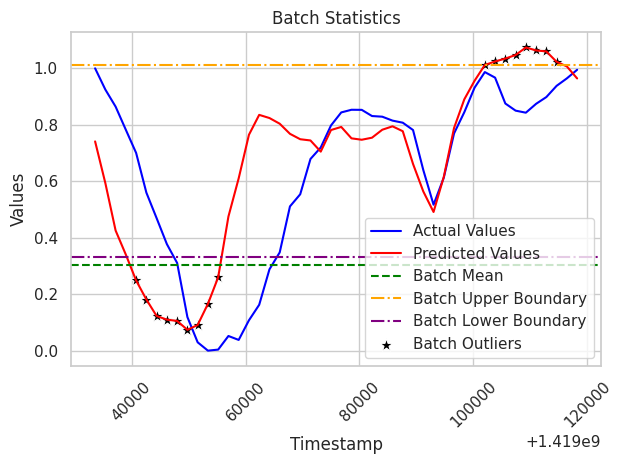


 Message Index: 2 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419120000          0.741144                  1.000000          25530   
1   1419121800          0.593265                  0.949623          24429   
2   1419123600          0.425500                  0.883139          22976   
3   1419125400          0.339843                  0.793960          21027   
4   1419127200          0.248499                  0.735118          19741   
5   1419129000          0.181060                  0.626127          17359   
6   1419130800          0.122686                  0.525326          15156   
7   1419132600          0.109900                  0.425303          12970   
8   1419134400          0.105196                  0.346420     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


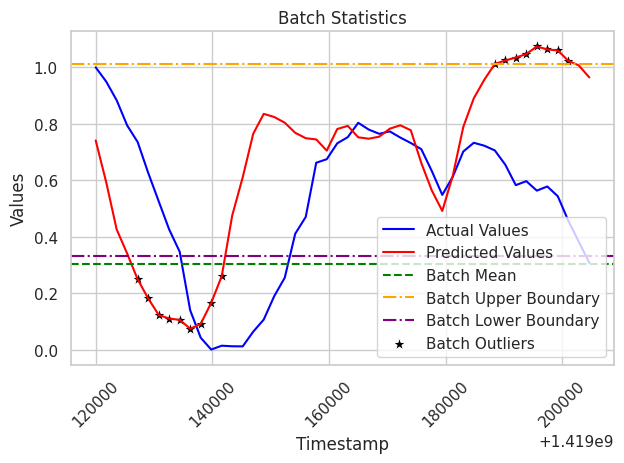


 Message Index: 3 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419206400          0.741144                  0.342308           8488   
1   1419208200          0.593265                  0.252778           6812   
2   1419210000          0.425500                  0.164263           5155   
3   1419211800          0.339843                  0.106891           4081   
4   1419213600          0.248499                  0.072062           3429   
5   1419215400          0.181060                  0.032372           2686   
6   1419217200          0.122686                  0.013942           2341   
7   1419219000          0.109900                  0.000000           2080   
8   1419220800          0.105196                  0.025694     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


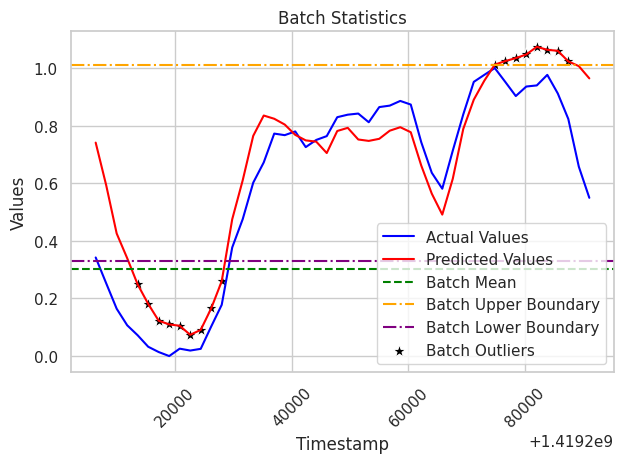


 Message Index: 4 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419292800          0.741144                  0.423066          10077   
1   1419294600          0.593265                  0.330589           8426   
2   1419296400          0.425500                  0.269927           7343   
3   1419298200          0.339843                  0.184507           5818   
4   1419300000          0.248499                  0.104800           4395   
5   1419301800          0.181060                  0.039993           3238   
6   1419303600          0.122686                  0.017532           2837   
7   1419305400          0.109900                  0.005825           2628   
8   1419307200          0.105196                  0.016300     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


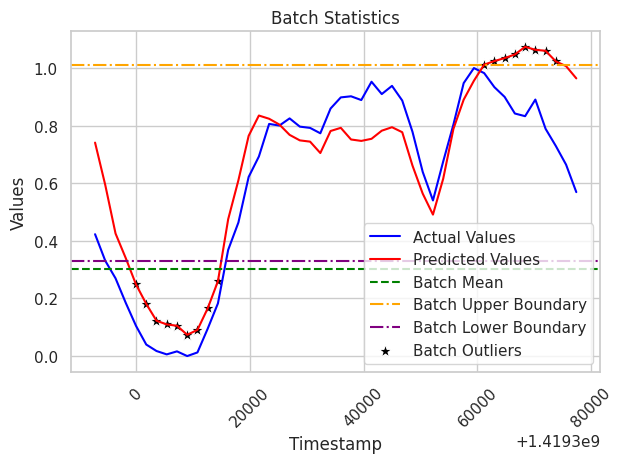


 Message Index: 5 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419379200          0.741144                  0.467228          11488   
1   1419381000          0.593265                  0.343166           9158   
2   1419382800          0.425500                  0.254033           7484   
3   1419384600          0.339843                  0.191151           6303   
4   1419386400          0.248499                  0.145945           5454   
5   1419388200          0.181060                  0.089825           4400   
6   1419390000          0.122686                  0.037059           3409   
7   1419391800          0.109900                  0.031308           3301   
8   1419393600          0.105196                  0.040786     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


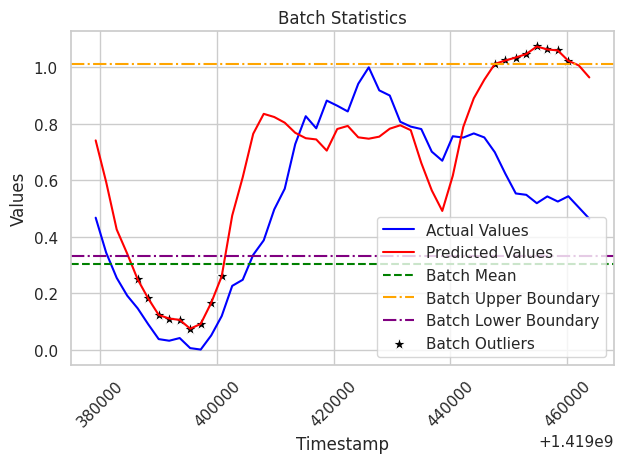


 Message Index: 6 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419465600          0.741144                  0.851558          10665   
1   1419467400          0.593265                  0.777480           9890   
2   1419469200          0.425500                  0.643472           8488   
3   1419471000          0.339843                  0.521220           7209   
4   1419472800          0.248499                  0.428599           6240   
5   1419474600          0.181060                  0.323743           5143   
6   1419476400          0.122686                  0.214777           4003   
7   1419478200          0.109900                  0.158478           3414   
8   1419480000          0.105196                  0.138597     

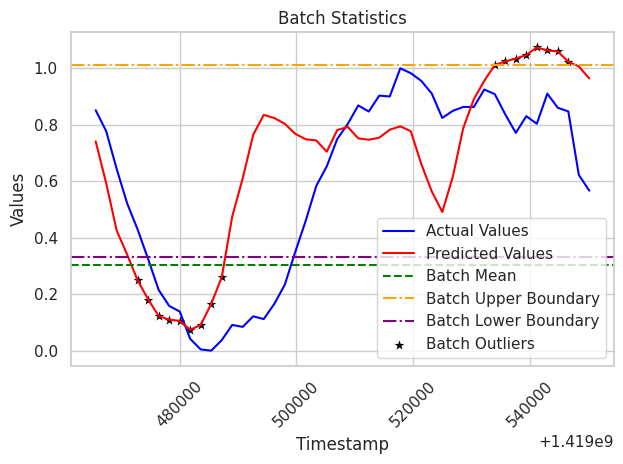


 Message Index: 7 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419552000          0.741144                  0.305092           6540   
1   1419553800          0.593265                  0.231356           5312   
2   1419555600          0.425500                  0.186982           4573   
3   1419557400          0.339843                  0.111865           3322   
4   1419559200          0.248499                  0.082923           2840   
5   1419561000          0.181060                  0.050138           2294   
6   1419562800          0.122686                  0.025760           1888   
7   1419564600          0.109900                  0.010148           1628   
8   1419566400          0.105196                  0.030203     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


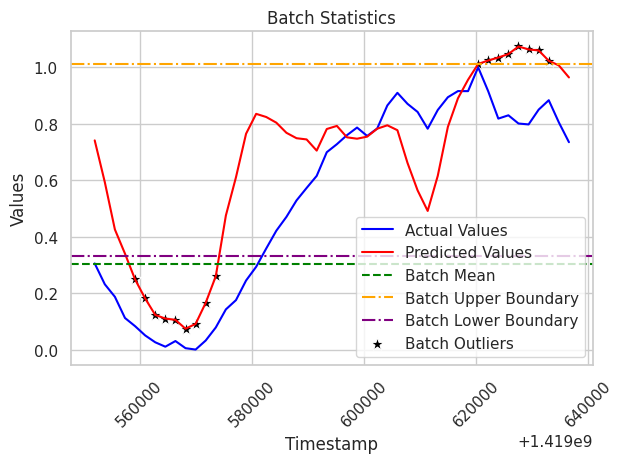


 Message Index: 8 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419638400          0.741144                  0.679355          13396   
1   1419640200          0.593265                  0.596236          12040   
2   1419642000          0.425500                  0.550754          11298   
3   1419643800          0.339843                  0.471497          10005   
4   1419645600          0.248499                  0.432451           9368   
5   1419647400          0.181060                  0.348719           8002   
6   1419649200          0.122686                  0.317519           7493   
7   1419651000          0.109900                  0.257202           6509   
8   1419652800          0.105196                  0.221589     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


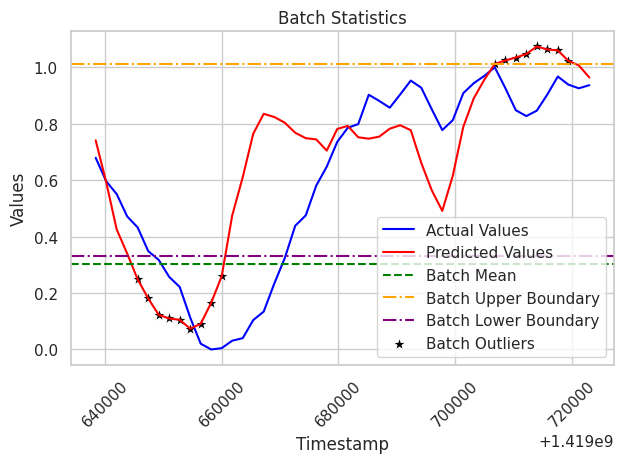


 Message Index: 9 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419724800          0.741144                  0.990563          16514   
1   1419726600          0.593265                  0.921547          15556   
2   1419728400          0.425500                  0.842951          14465   
3   1419730200          0.339843                  0.723723          12810   
4   1419732000          0.248499                  0.714358          12680   
5   1419733800          0.181060                  0.602046          11121   
6   1419735600          0.122686                  0.510482           9850   
7   1419737400          0.109900                  0.451625           9033   
8   1419739200          0.105196                  0.385995     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


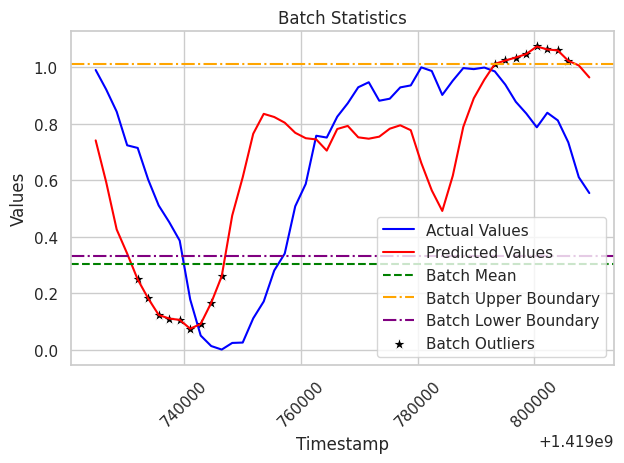


 Message Index: 10 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419811200          0.741144                  0.355409           8548   
1   1419813000          0.593265                  0.258196           6766   
2   1419814800          0.425500                  0.166603           5087   
3   1419816600          0.339843                  0.126562           4353   
4   1419818400          0.248499                  0.087993           3646   
5   1419820200          0.181060                  0.044951           2857   
6   1419822000          0.122686                  0.024603           2484   
7   1419823800          0.109900                  0.003928           2105   
8   1419825600          0.105196                  0.012929    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


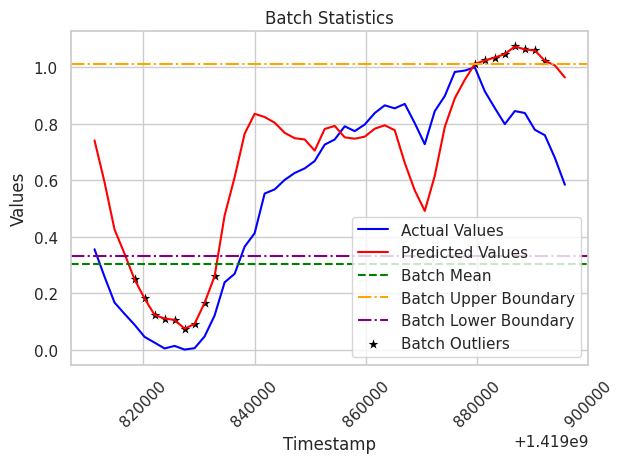


 Message Index: 11 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419897600          0.741144                  0.437531          11042   
1   1419899400          0.593265                  0.326669           8774   
2   1419901200          0.425500                  0.253006           7267   
3   1419903000          0.339843                  0.176606           5704   
4   1419904800          0.248499                  0.129925           4749   
5   1419906600          0.181060                  0.089989           3932   
6   1419908400          0.122686                  0.060856           3336   
7   1419910200          0.109900                  0.045557           3023   
8   1419912000          0.105196                  0.047316    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


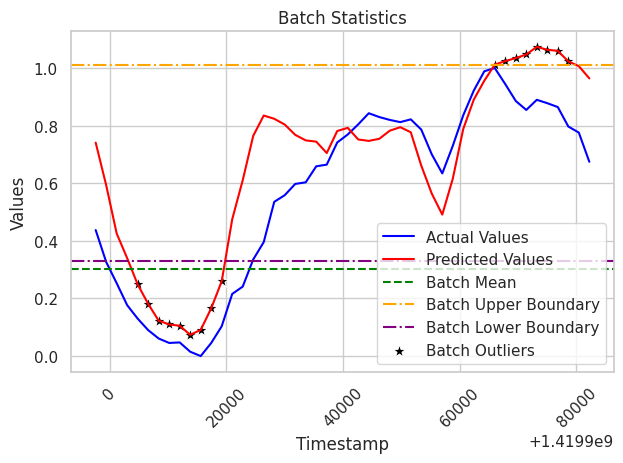


 Message Index: 12 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1419984000          0.741144                  0.471005          14294   
1   1419985800          0.593265                  0.387055          12150   
2   1419987600          0.425500                  0.319433          10423   
3   1419989400          0.339843                  0.233525           8229   
4   1419991200          0.248499                  0.188065           7068   
5   1419993000          0.181060                  0.129488           5572   
6   1419994800          0.122686                  0.094131           4669   
7   1419996600          0.109900                  0.064881           3922   
8   1419998400          0.105196                  0.072634    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


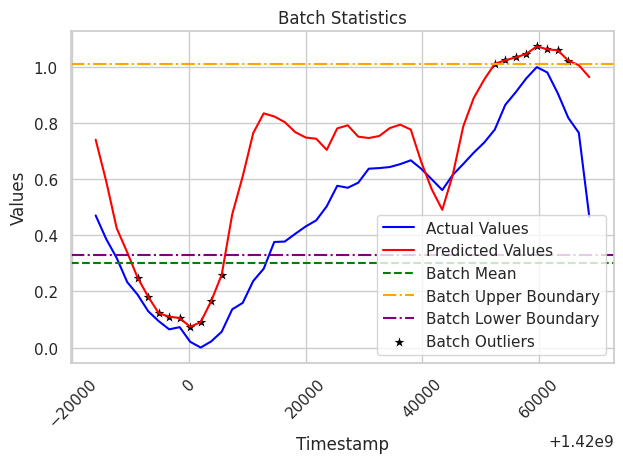


 Message Index: 13 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420070400          0.741144                  0.684406          22153   
1   1420072200          0.593265                  0.973099          29547   
2   1420074000          0.425500                  1.000000          30236   
3   1420075800          0.339843                  0.926285          28348   
4   1420077600          0.248499                  0.844916          26264   
5   1420079400          0.181060                  0.805052          25243   
6   1420081200          0.122686                  0.722044          23117   
7   1420083000          0.109900                  0.640052          21017   
8   1420084800          0.105196                  0.528893    

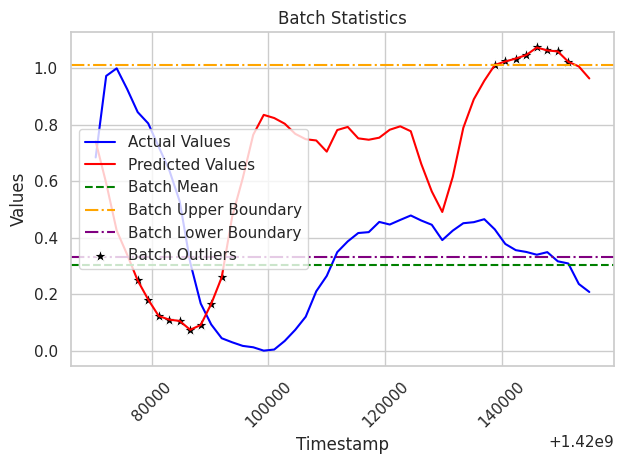


 Message Index: 14 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420156800          0.741144                  0.314474           8258   
1   1420158600          0.593265                  0.318715           8343   
2   1420160400          0.425500                  0.218081           6326   
3   1420162200          0.339843                  0.126229           4485   
4   1420164000          0.248499                  0.101582           3991   
5   1420165800          0.181060                  0.058424           3126   
6   1420167600          0.122686                  0.041860           2794   
7   1420169400          0.109900                  0.017013           2296   
8   1420171200          0.105196                  0.027491    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


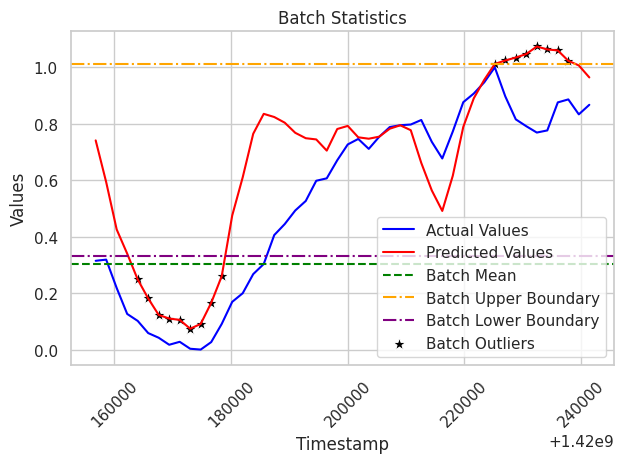


 Message Index: 15 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420243200          0.741144                  0.727913          18085   
1   1420245000          0.593265                  0.660129          16661   
2   1420246800          0.425500                  0.610767          15624   
3   1420248600          0.339843                  0.541889          14177   
4   1420250400          0.248499                  0.478722          12850   
5   1420252200          0.181060                  0.414890          11509   
6   1420254000          0.122686                  0.358720          10329   
7   1420255800          0.109900                  0.287367           8830   
8   1420257600          0.105196                  0.243241    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


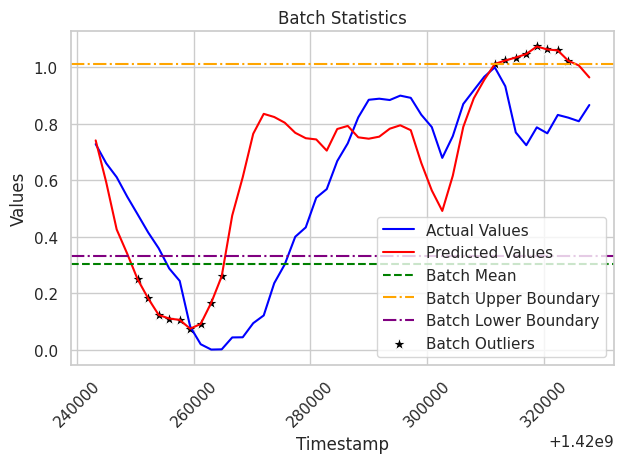


 Message Index: 16 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420329600          0.741144                  1.000000          19613   
1   1420331400          0.593265                  0.845406          16975   
2   1420333200          0.425500                  0.819972          16541   
3   1420335000          0.339843                  0.693272          14379   
4   1420336800          0.248499                  0.617675          13089   
5   1420338600          0.181060                  0.466303          10506   
6   1420340400          0.122686                  0.390706           9216   
7   1420342200          0.109900                  0.325481           8103   
8   1420344000          0.105196                  0.250469    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


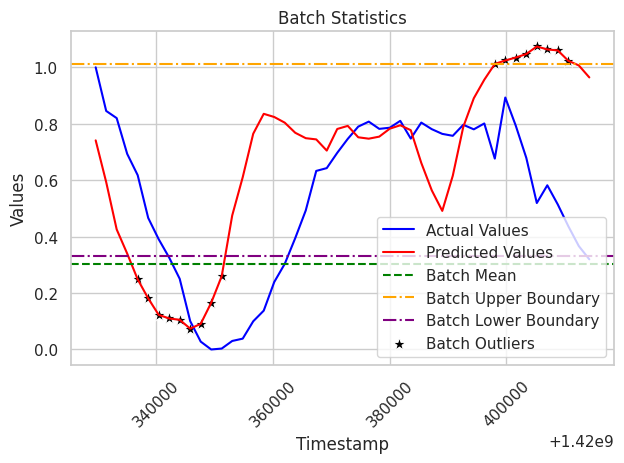


 Message Index: 17 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420416000          0.741144                  0.248222           6669   
1   1420417800          0.593265                  0.213490           5961   
2   1420419600          0.425500                  0.125583           4169   
3   1420421400          0.339843                  0.086142           3365   
4   1420423200          0.248499                  0.061025           2853   
5   1420425000          0.181060                  0.030316           2227   
6   1420426800          0.122686                  0.000000           1609   
7   1420428600          0.109900                  0.004317           1697   
8   1420430400          0.105196                  0.013441    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


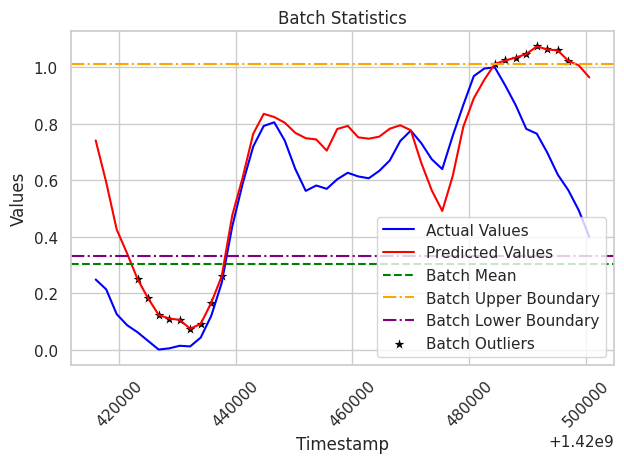


 Message Index: 18 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420502400          0.741144                  0.304670           7969   
1   1420504200          0.593265                  0.210690           6005   
2   1420506000          0.425500                  0.143076           4592   
3   1420507800          0.339843                  0.090200           3487   
4   1420509600          0.248499                  0.060006           2856   
5   1420511400          0.181060                  0.030434           2238   
6   1420513200          0.122686                  0.004163           1689   
7   1420515000          0.109900                  0.000000           1602   
8   1420516800          0.105196                  0.008230    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


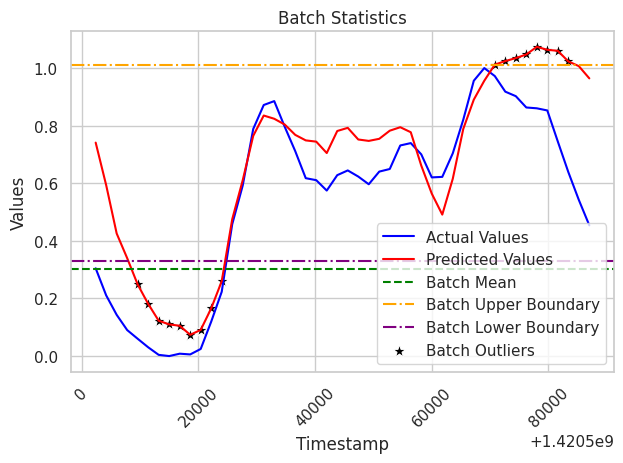


 Message Index: 19 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420588800          0.741144                  0.276107           8357   
1   1420590600          0.593265                  0.210647           6788   
2   1420592400          0.425500                  0.151821           5378   
3   1420594200          0.339843                  0.089699           3889   
4   1420596000          0.248499                  0.055447           3068   
5   1420597800          0.181060                  0.027828           2406   
6   1420599600          0.122686                  0.011932           2025   
7   1420601400          0.109900                  0.000000           1739   
8   1420603200          0.105196                  0.006592    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


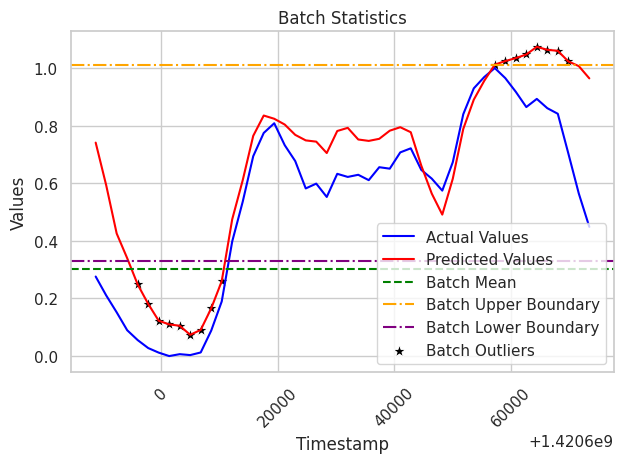


 Message Index: 20 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420675200          0.741144                  0.339166           9843   
1   1420677000          0.593265                  0.239888           7477   
2   1420678800          0.425500                  0.165198           5697   
3   1420680600          0.339843                  0.107712           4327   
4   1420682400          0.248499                  0.069025           3405   
5   1420684200          0.181060                  0.041079           2739   
6   1420686000          0.122686                  0.012840           2066   
7   1420687800          0.109900                  0.010616           2013   
8   1420689600          0.105196                  0.009021    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


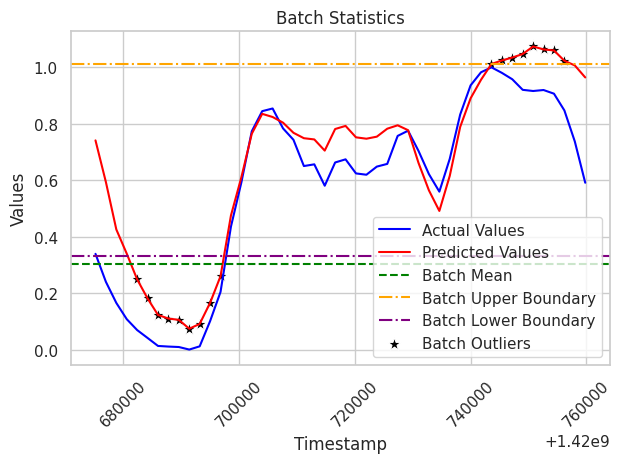


 Message Index: 21 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420761600          0.741144                  0.430588          13156   
1   1420763400          0.593265                  0.318392          10295   
2   1420765200          0.425500                  0.231529           8080   
3   1420767000          0.339843                  0.151569           6041   
4   1420768800          0.248499                  0.117804           5180   
5   1420770600          0.181060                  0.071216           3992   
6   1420772400          0.122686                  0.046392           3359   
7   1420774200          0.109900                  0.024784           2808   
8   1420776000          0.105196                  0.020667    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


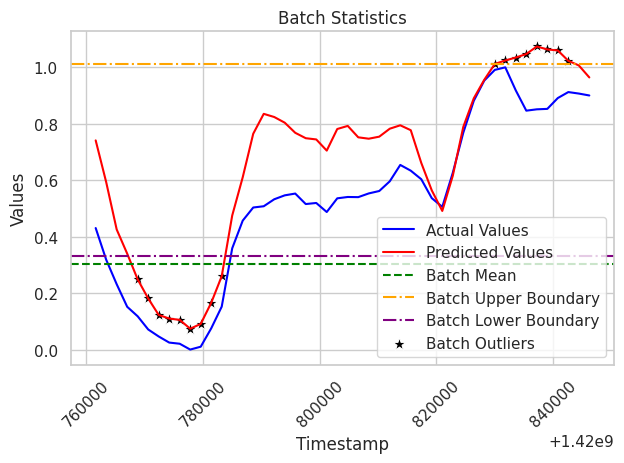


 Message Index: 22 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420848000          0.741144                  0.837229          24251   
1   1420849800          0.593265                  0.761884          22330   
2   1420851600          0.425500                  0.667281          19918   
3   1420853400          0.339843                  0.588994          17922   
4   1420855200          0.248499                  0.530279          16425   
5   1420857000          0.181060                  0.434264          13977   
6   1420858800          0.122686                  0.348761          11797   
7   1420860600          0.109900                  0.284986          10171   
8   1420862400          0.105196                  0.225957    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


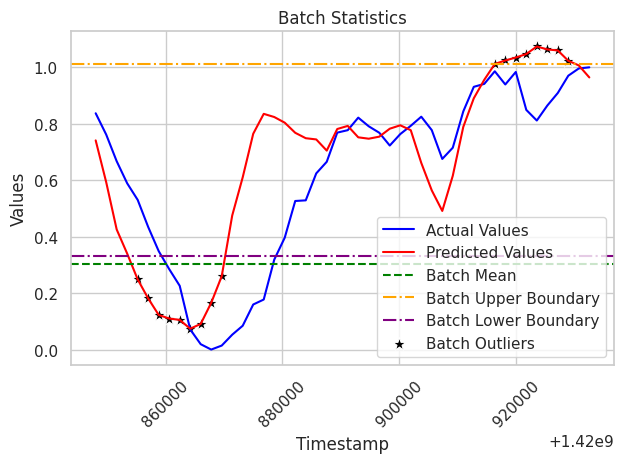


 Message Index: 23 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1420934400          0.741144                  0.025207          26653   
1   1420936200          0.593265                  0.023231          24790   
2   1420938000          0.425500                  0.021483          23141   
3   1420939800          0.339843                  0.018845          20654   
4   1420941600          0.248499                  0.017281          19179   
5   1420943400          0.181060                  0.014842          16879   
6   1420945200          0.122686                  0.012422          14597   
7   1420947000          0.109900                  0.010086          12394   
8   1420948800          0.105196                  0.007321    

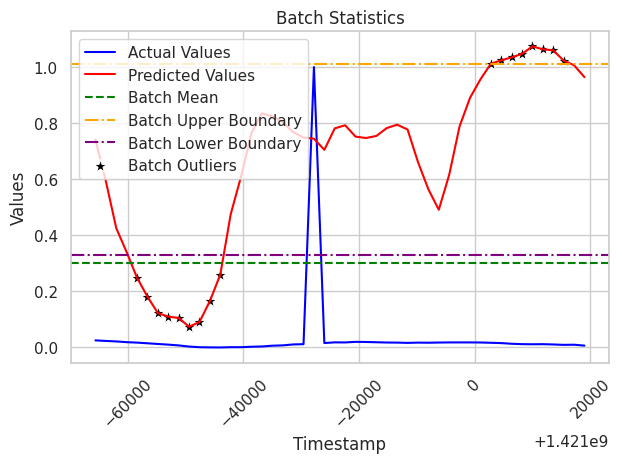


 Message Index: 24 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421020800          0.741144                  0.267110           7147   
1   1421022600          0.593265                  0.180060           5365   
2   1421024400          0.425500                  0.101461           3756   
3   1421026200          0.339843                  0.068292           3077   
4   1421028000          0.248499                  0.045137           2603   
5   1421029800          0.181060                  0.028577           2264   
6   1421031600          0.122686                  0.014362           1973   
7   1421033400          0.109900                  0.000000           1679   
8   1421035200          0.105196                  0.013922    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


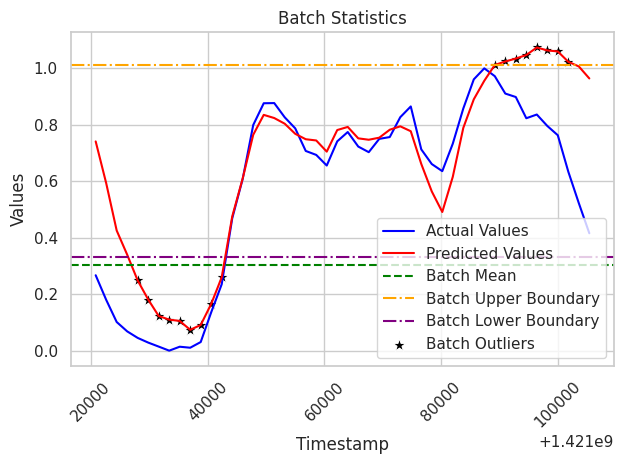


 Message Index: 25 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421107200          0.741144                  0.410914          11139   
1   1421109000          0.593265                  0.245123           7323   
2   1421110800          0.425500                  0.150367           5142   
3   1421112600          0.339843                  0.100187           3987   
4   1421114400          0.248499                  0.065864           3197   
5   1421116200          0.181060                  0.028457           2336   
6   1421118000          0.122686                  0.005170           1800   
7   1421119800          0.109900                  0.002650           1742   
8   1421121600          0.105196                  0.009558    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


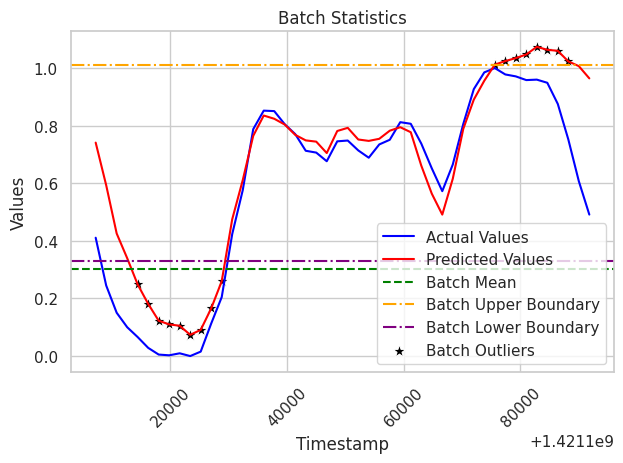


 Message Index: 26 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421193600          0.741144                  0.381442          10584   
1   1421195400          0.593265                  0.263198           7941   
2   1421197200          0.425500                  0.186247           6221   
3   1421199000          0.339843                  0.122316           4792   
4   1421200800          0.248499                  0.078561           3814   
5   1421202600          0.181060                  0.044515           3053   
6   1421204400          0.122686                  0.029841           2725   
7   1421206200          0.109900                  0.013332           2356   
8   1421208000          0.105196                  0.012035    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


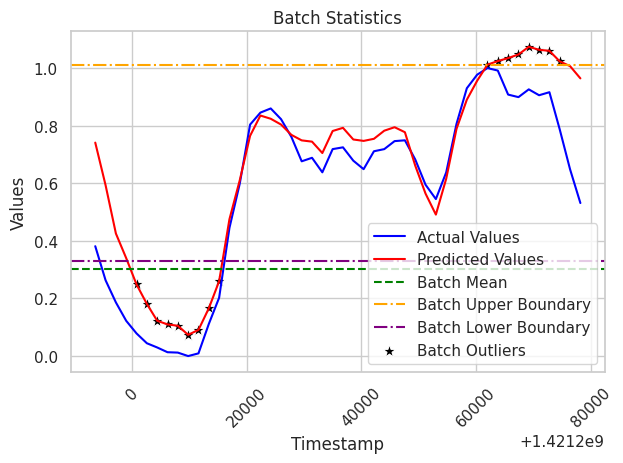


 Message Index: 27 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421280000          0.741144                  0.384126          10852   
1   1421281800          0.593265                  0.264674           8131   
2   1421283600          0.425500                  0.182229           6253   
3   1421285400          0.339843                  0.121998           4881   
4   1421287200          0.248499                  0.077703           3872   
5   1421289000          0.181060                  0.037315           2952   
6   1421290800          0.122686                  0.018789           2530   
7   1421292600          0.109900                  0.006146           2242   
8   1421294400          0.105196                  0.012380    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


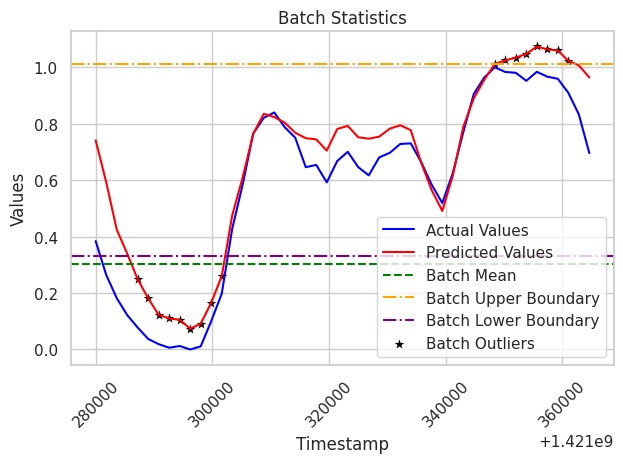


 Message Index: 28 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421366400          0.741144                  0.478226          14729   
1   1421368200          0.593265                  0.360794          11814   
2   1421370000          0.425500                  0.256335           9221   
3   1421371800          0.339843                  0.168835           7049   
4   1421373600          0.248499                  0.130685           6102   
5   1421375400          0.181060                  0.085123           4971   
6   1421377200          0.122686                  0.054264           4205   
7   1421379000          0.109900                  0.015308           3238   
8   1421380800          0.105196                  0.024816    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


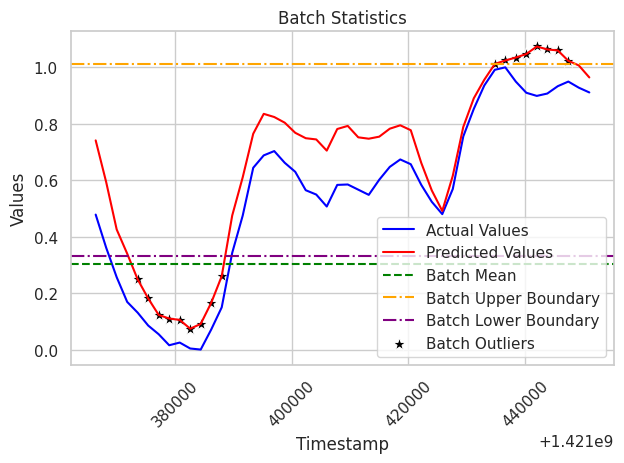


 Message Index: 29 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421452800          0.741144                  0.906499          24841   
1   1421454600          0.593265                  0.794196          22159   
2   1421456400          0.425500                  0.705720          20046   
3   1421458200          0.339843                  0.617746          17945   
4   1421460000          0.248499                  0.534377          15954   
5   1421461800          0.181060                  0.461352          14210   
6   1421463600          0.122686                  0.374927          12146   
7   1421465400          0.109900                  0.299389          10342   
8   1421467200          0.105196                  0.241940    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


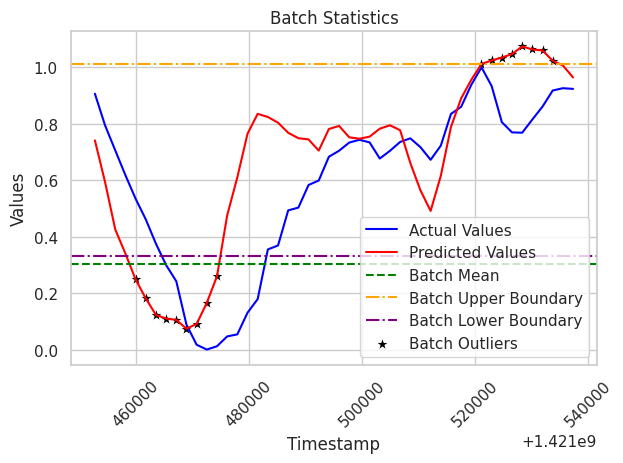


 Message Index: 30 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421539200          0.741144                  1.000000          25423   
1   1421541000          0.593265                  0.934787          23964   
2   1421542800          0.425500                  0.852992          22134   
3   1421544600          0.339843                  0.768918          20253   
4   1421546400          0.248499                  0.728736          19354   
5   1421548200          0.181060                  0.644527          17470   
6   1421550000          0.122686                  0.530371          14916   
7   1421551800          0.109900                  0.447817          13069   
8   1421553600          0.105196                  0.338220    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


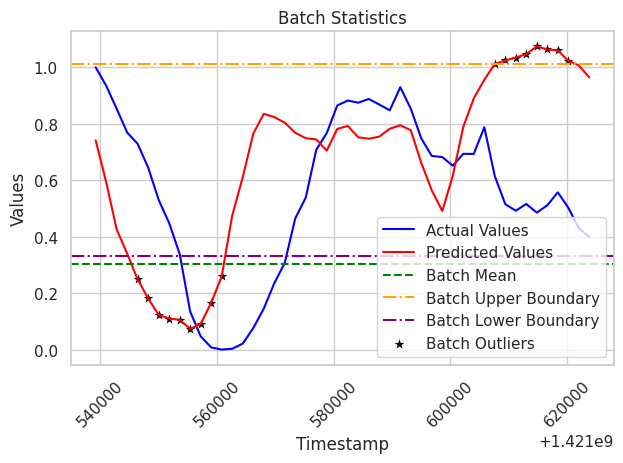


 Message Index: 31 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421625600          0.741144                  0.502513          10938   
1   1421627400          0.593265                  0.399813           9181   
2   1421629200          0.425500                  0.309154           7630   
3   1421631000          0.339843                  0.227964           6241   
4   1421632800          0.248499                  0.177052           5370   
5   1421634600          0.181060                  0.108604           4199   
6   1421636400          0.122686                  0.086159           3815   
7   1421638200          0.109900                  0.059972           3367   
8   1421640000          0.105196                  0.054770    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


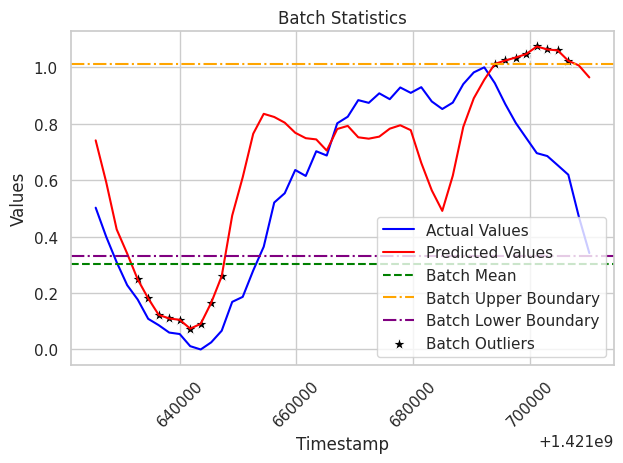


 Message Index: 32 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421712000          0.741144                  0.250195           6941   
1   1421713800          0.593265                  0.168558           5164   
2   1421715600          0.425500                  0.112326           3940   
3   1421717400          0.339843                  0.072495           3073   
4   1421719200          0.248499                  0.054900           2690   
5   1421721000          0.181060                  0.023476           2006   
6   1421722800          0.122686                  0.004089           1584   
7   1421724600          0.109900                  0.000000           1495   
8   1421726400          0.105196                  0.009050    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


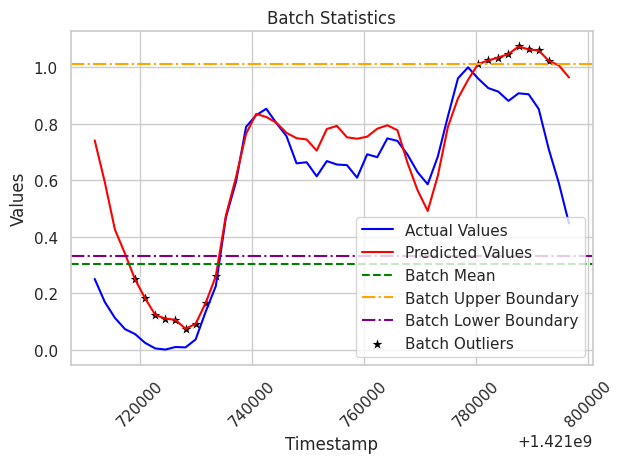


 Message Index: 33 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421798400          0.741144                  0.007422           8987   
1   1421800200          0.593265                  0.004911           6616   
2   1421802000          0.425500                  0.003633           5410   
3   1421803800          0.339843                  0.002300           4152   
4   1421805600          0.248499                  0.001509           3405   
5   1421807400          0.181060                  0.000743           2682   
6   1421809200          0.122686                  0.000211           2180   
7   1421811000          0.109900                  1.000000         945876   
8   1421812800          0.105196                  0.000114    

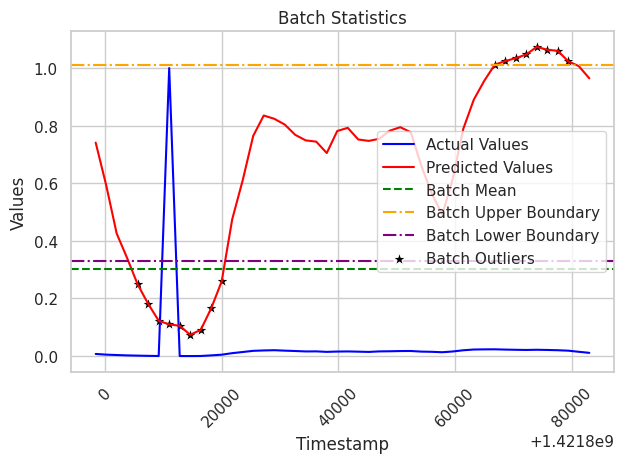


 Message Index: 34 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421884800          0.741144                  0.342119          10173   
1   1421886600          0.593265                  0.241313           7771   
2   1421888400          0.425500                  0.179033           6287   
3   1421890200          0.339843                  0.113270           4720   
4   1421892000          0.248499                  0.068029           3642   
5   1421893800          0.181060                  0.031392           2769   
6   1421895600          0.122686                  0.016157           2406   
7   1421897400          0.109900                  0.007260           2194   
8   1421899200          0.105196                  0.010660    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


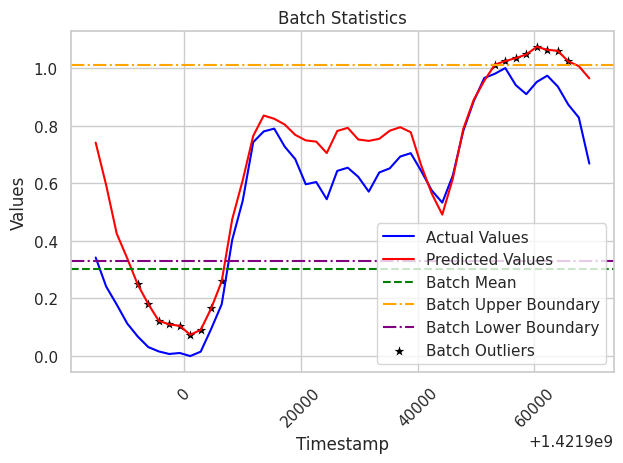


 Message Index: 35 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1421971200          0.741144                  0.501151          14722   
1   1421973000          0.593265                  0.381620          11815   
2   1421974800          0.425500                  0.277138           9274   
3   1421976600          0.339843                  0.193544           7241   
4   1421978400          0.248499                  0.150082           6184   
5   1421980200          0.181060                  0.099589           4956   
6   1421982000          0.122686                  0.066776           4158   
7   1421983800          0.109900                  0.039679           3499   
8   1421985600          0.105196                  0.036965    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


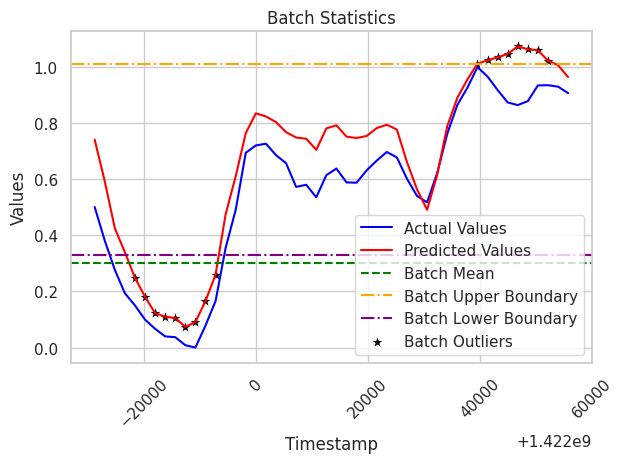


 Message Index: 36 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1422057600          0.741144                  0.915877          24223   
1   1422059400          0.593265                  0.809774          21761   
2   1422061200          0.425500                  0.749224          20356   
3   1422063000          0.339843                  0.657214          18221   
4   1422064800          0.248499                  0.486683          14264   
5   1422066600          0.181060                  0.382736          11852   
6   1422068400          0.122686                  0.313480          10245   
7   1422070200          0.109900                  0.255301           8895   
8   1422072000          0.105196                  0.200957    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


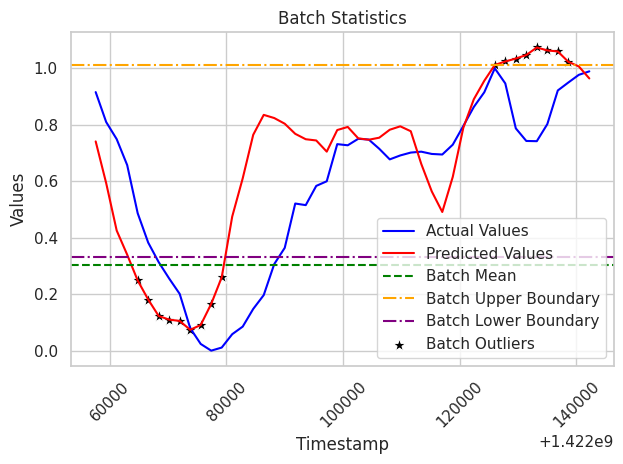


 Message Index: 37 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1422144000          0.741144                  1.000000          25026   
1   1422145800          0.593265                  0.943642          23773   
2   1422147600          0.425500                  0.893896          22667   
3   1422149400          0.339843                  0.812801          20864   
4   1422151200          0.248499                  0.751361          19498   
5   1422153000          0.181060                  0.661224          17494   
6   1422154800          0.122686                  0.560833          15262   
7   1422156600          0.109900                  0.446813          12727   
8   1422158400          0.105196                  0.354833    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


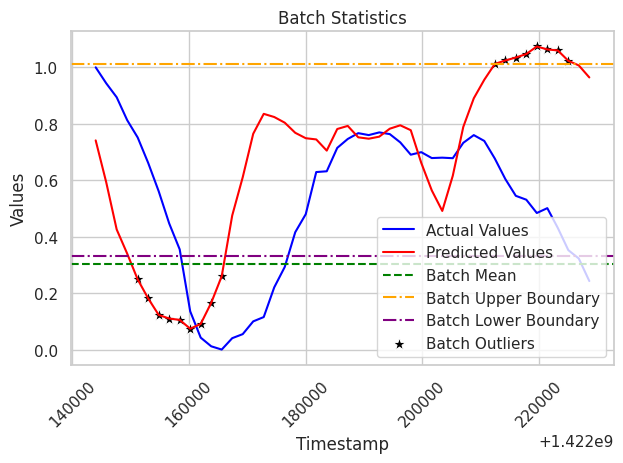


 Message Index: 38 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1422230400          0.741144                  0.345575           6663   
1   1422232200          0.593265                  0.264866           5151   
2   1422234000          0.425500                  0.208338           4092   
3   1422235800          0.339843                  0.161097           3207   
4   1422237600          0.248499                  0.130084           2626   
5   1422239400          0.181060                  0.096349           1994   
6   1422241200          0.122686                  0.095975           1987   
7   1422243000          0.109900                  0.091972           1912   
8   1422244800          0.105196                  0.104996    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


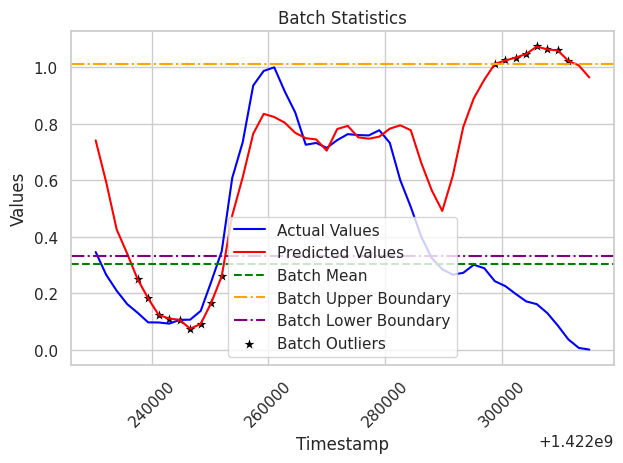


 Message Index: 39 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1422316800          0.741144                  0.007966            109   
1   1422318600          0.593265                  0.005679             80   
2   1422320400          0.425500                  0.002524             40   
3   1422322200          0.339843                  0.002445             39   
4   1422324000          0.248499                  0.001420             26   
5   1422325800          0.181060                  0.001893             32   
6   1422327600          0.122686                  0.000000              8   
7   1422329400          0.109900                  0.000237             11   
8   1422331200          0.105196                  0.000079    

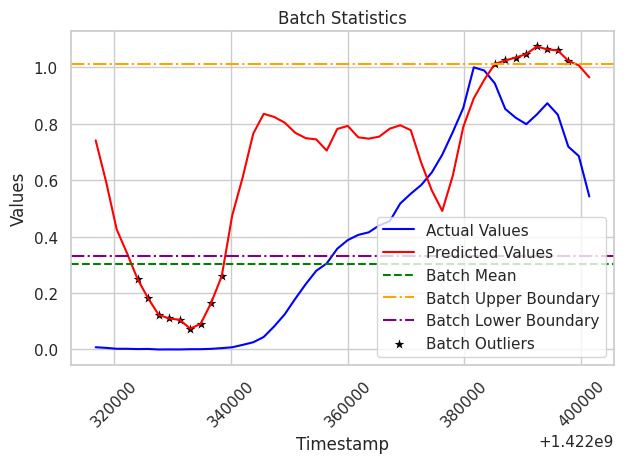


 Message Index: 40 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1422403200          0.741144                  0.196355           5502   
1   1422405000          0.593265                  0.126563           4001   
2   1422406800          0.425500                  0.081834           3039   
3   1422408600          0.339843                  0.053564           2431   
4   1422410400          0.248499                  0.033756           2005   
5   1422412200          0.181060                  0.017762           1661   
6   1422414000          0.122686                  0.000976           1300   
7   1422415800          0.109900                  0.000000           1279   
8   1422417600          0.105196                  0.005952    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


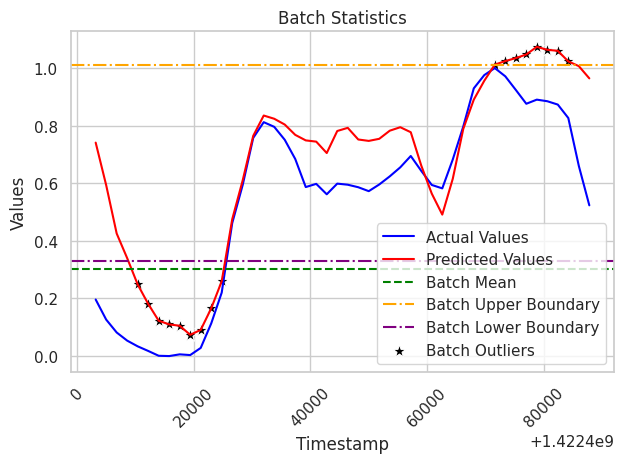


 Message Index: 41 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1422489600          0.741144                  0.379885          10134   
1   1422491400          0.593265                  0.260514           7568   
2   1422493200          0.425500                  0.169846           5619   
3   1422495000          0.339843                  0.110439           4342   
4   1422496800          0.248499                  0.076107           3604   
5   1422498600          0.181060                  0.039728           2822   
6   1422500400          0.122686                  0.019120           2379   
7   1422502200          0.109900                  0.007118           2121   
8   1422504000          0.105196                  0.007536    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


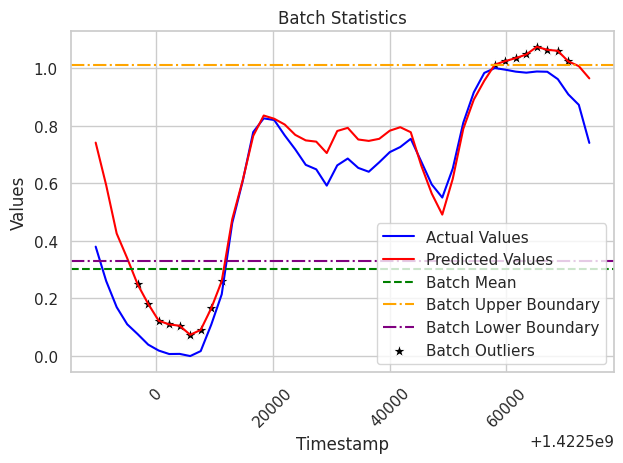


 Message Index: 42 



----------batch mean------------


Batch STD: 0.3018678132410133
Batch Mean Lower Bound w/ error rate: 0.33113796182367244
Batch Mean Upper Bound w/ error rate: 1.0103405416159523


------------------------------------


     Timestamp  Predicted Values  Actual Values Normalized  Actual Values  \
0   1422576000          0.741144                  0.462567          14367   
1   1422577800          0.593265                  0.335485          11118   
2   1422579600          0.425500                  0.242197           8733   
3   1422581400          0.339843                  0.172612           6954   
4   1422583200          0.248499                  0.131307           5898   
5   1422585000          0.181060                  0.078229           4541   
6   1422586800          0.122686                  0.050575           3834   
7   1422588600          0.109900                  0.023547           3143   
8   1422590400          0.105196                  0.029492    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


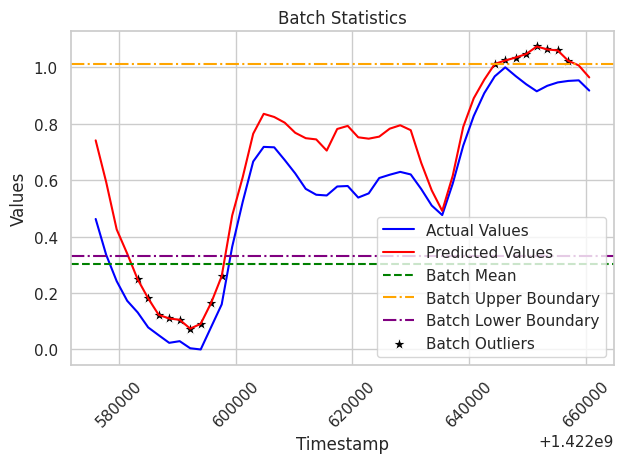

In [32]:
batch_conf_interval = 0.15
write_to_kafka("dataanomaly-testing", zip(x_test, y_test))

test_bayesianarima_model(batch_conf_interval)


# Testing Results

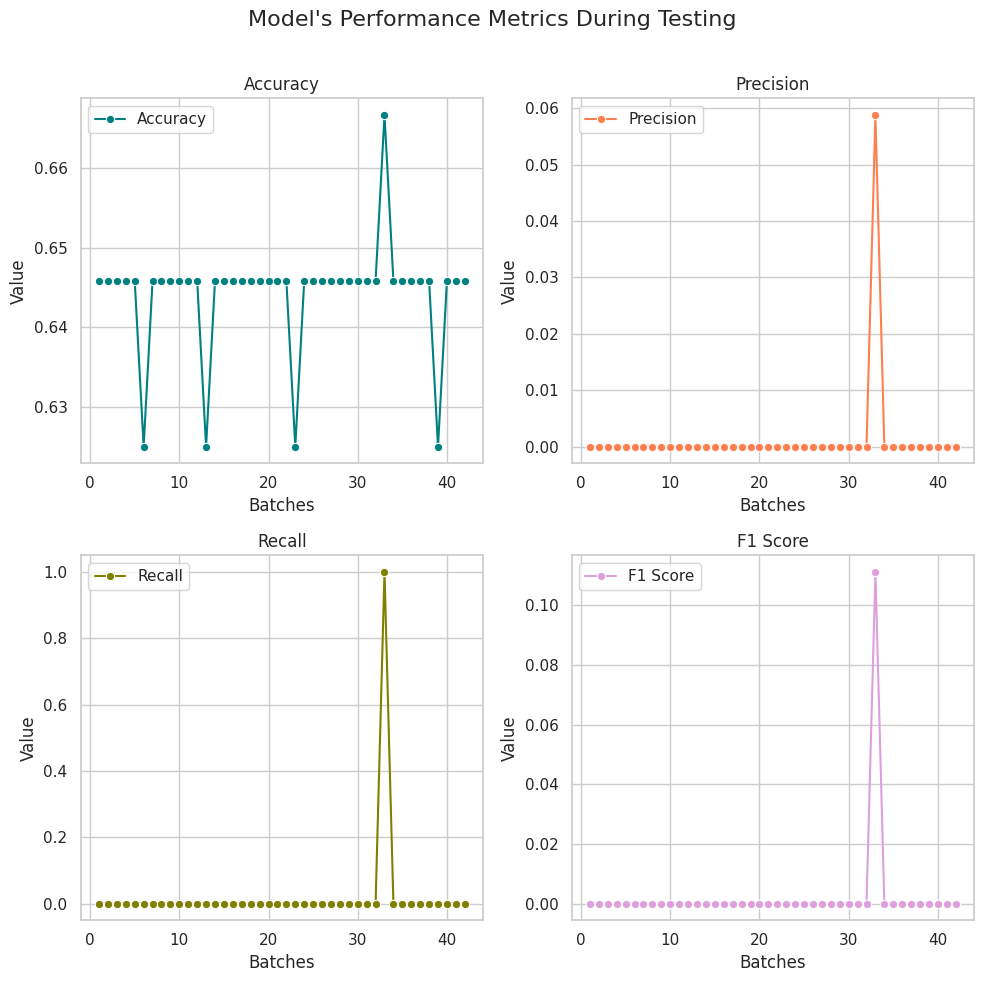

In [33]:

keys = list(performance_metrics_accuracy_test.keys())
values = [
    list(performance_metrics_accuracy_test.values()),
    list(performance_metrics_precision_test.values()),
    list(performance_metrics_recall_test.values()),
    list(performance_metrics_f1_score_test.values())
]
titles = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['teal', 'coral', 'olive', 'plum']

# Calculate mean, max, and min for each metric
means = [np.mean(val) for val in values]
maxs = [np.max(val) for val in values]
mins = [np.min(val) for val in values]

# Set Seaborn style
sns.set(style="whitegrid")

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
fig.suptitle('Model\'s Performance Metrics During Testing', fontsize=16)

# Plot each metric on a subplot
for i, (ax, value, title, color, mean, max_val, min_val) in enumerate(zip(axs.flat, values, titles, colors, means, maxs, mins)):
    sns.lineplot(x=keys, y=value, marker='o', label=title, color=color, ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Batches')
    ax.set_ylabel('Value')


# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust the layout to avoid the suptitle getting cut off
plt.show()

In [34]:
global_anomalies_detected_in_test[batch_conf_interval] = sum(value for value in count_of_anomalies_detected_in_test.values())
print(global_anomalies_detected_in_test) ## total anomalies detected in the batch
print(100* global_anomalies_detected_in_test[batch_conf_interval]/len(x_test_df)) ## percentage of anomalies detected in the batch
print ("\nTesting Phase Metrics \n\nActual Anomalies: ", actualanomalies_detected_index_in_test)
print("Batches with TP:", [key for key, value in tp_anomalies_detected_index_in_test.items() if value == 1])
print('Performance of the algorithm at conf:',batch_conf_interval , ' is :\n')
print("Model's MSE Mean {:.2%}".format(statistics.mean(performance_metrics_mse_test.values())))
print("Model's RMSE Mean {:.2%}".format(statistics.mean(performance_metrics_rmse_test.values())))
print("Model's MAE Mean {:.2%}".format(statistics.mean(performance_metrics_mae_test.values())))
print("Model's Mean Accuracy: {:.2%}".format(statistics.mean(performance_metrics_accuracy_test.values())))
print("Model's Mean Precision: {:.2%}".format(statistics.mean(performance_metrics_precision_test.values())))
print("Model's Mean F1 Score: {:.2%}".format(statistics.mean(performance_metrics_f1_score_test.values())))
print("Model's Mean Recall: {:.2%}".format(statistics.mean(performance_metrics_recall_test.values())))

{0.15: 714}
34.593023255813954

Testing Phase Metrics 

Actual Anomalies:  {6: 1, 13: 1, 23: 1, 33: 1, 39: 1}
Batches with TP: [33]
Performance of the algorithm at conf: 0.15  is :

Model's MSE Mean 8.65%
Model's RMSE Mean 25.81%
Model's MAE Mean 20.83%
Model's Mean Accuracy: 64.43%
Model's Mean Precision: 0.14%
Model's Mean F1 Score: 0.26%
Model's Mean Recall: 2.38%
